# <div align = "center"><h1><b>Predicting Stocks</b></h1></div>
<div text align = "center"><img align = middle src="https://miro.medium.com/max/1400/1*raJCtjXLEVNomYOVZ_S47g.jpeg" width = 100%></div>

# Introduction
In this notebook we'll focus on analysing the stock data of the companies. We will look at everything from scraping stock data of the **S&P500 companies** to visualizing the scraped data, analysing it and finally ***predicting*** the stock prices using various methods. The S&P500, which is short for **Standard & Poor's 500**, was introduced in 1957 as a stock market index to track the value of 500 corporations that have their stocks listed on the ***New York Stock Exchange (NYSE)*** and the ***NASDAQ Composite***. Standard & Poor's provides financial data, credit ratings for investments, and various equity indices. The collection of stocks that make up the S&P500 is designed to represent most of the composition of the U.S. economy. As a result, the value of the S&P and various stocks within the index is closely watched by market participants since their performance represents a gauge of the health of the U.S. economy.

# Installing the Necessary Libraries

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
! cp drive/MyDrive/kaggle.json /content
! mkdir ~/.kaggle
! cp kaggle.json ~/.kaggle/
! chmod 600 ~/.kaggle/kaggle.json


In [ ]:
!kaggle datasets download -d ilyaryabov/insider-trading-sp500-inside-info

  0% 0.00/532k [00:00<?, ?B/s]
100% 532k/532k [00:00<00:00, 159MB/s]


In [ ]:
!unzip /content/insider-trading-sp500-inside-info.zip

Archive:  /content/insider-trading-sp500-inside-info.zip
  inflating: A.csv                   
  inflating: AAP.csv                 
  inflating: AAPL.csv                
  inflating: ABBV.csv                
  inflating: ABC.csv                 
  inflating: ABMD.csv                
  inflating: ABT.csv                 
  inflating: ACN.csv                 
  inflating: ADBE.csv                
  inflating: ADI.csv                 
  inflating: ADM.csv                 
  inflating: ADP.csv                 
  inflating: ADSK.csv                
  inflating: AEE.csv                 
  inflating: AEP.csv                 
  inflating: AES.csv                 
  inflating: AFL.csv                 
  inflating: AIG.csv                 
  inflating: AIZ.csv                 
  inflating: AJG.csv                 
  inflating: AKAM.csv                
  inflating: ALB.csv                 
  inflating: ALGN.csv                
  inflating: ALK.csv                 
  inflating: ALL.csv           

In [ ]:
!mkdir insider
!mv *.csv insider

In [ ]:
!pip install yfinance==0.1.70
!pip install yahoo-fin==0.8.9.1
!pip install mplfinance
!pip install pmdarima

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.8/62.8 KB 3.8 MB/s eta 0:00:00
  Attempting uninstall: requests
    Found existing installation: requests 2.25.1
    Uninstalling requests-2.25.1:
      Successfully uninstalled requests-2.25.1
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 81.1/81.1 KB 3.7 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 50.4/50.4 KB 8.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 83.4/83.4 KB 11.4 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 140.6/140.6 KB 20.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 107.0/107.0 KB 15.3 MB/s eta 0:00:00
  Created wheel for parse: filename=parse-1.19.0-py3-none-any.whl size=245

In [ ]:
pip install prophet --no-cache-dir

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


# Imports

In [ ]:
import numpy as np
import pandas as pd 
import os
import matplotlib.pyplot as plt
from mplfinance.original_flavor import candlestick_ohlc
import matplotlib.dates as mpdates
import seaborn as sns
import yfinance as yf
from yahoo_fin import stock_info
import numpy as np 

import datetime
from dateutil.parser import parse

from sklearn.preprocessing import MinMaxScaler

import tensorflow as tf
import keras
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv1D, Bidirectional, LSTM, Dropout, Dense
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.losses import Huber

import math
from statsmodels.tsa.stattools import adfuller
from statsmodels.tsa.arima_model import ARIMA

import pmdarima as pm
from pmdarima.arima.utils import ndiffs

from prophet import Prophet
from prophet.plot import plot_plotly

from datetime import datetime

import warnings
warnings.filterwarnings('ignore')

# Scraping the Data


In [ ]:
tickers = stock_info.tickers_sp500()
dataframe_names = [ticker for ticker in tickers]
print('Web scraper starting.....')
for i in range(len(tickers)):
  historical_stock_prices = (yf.Ticker(tickers[i])).history(period = 'max')
  historical_stock_prices.to_csv(dataframe_names[i] + '.csv')

# # taking a look at the scraped data


Web scraper starting.....


In [ ]:
!mkdir input
!mv *.csv input

In [ ]:
# taking a look at the scraped data
pd.read_csv('/content/input/META.csv')

,Date,Open,High,Low,Close,Volume,Dividends,Stock Splits
0,2012-05-18,42.049999,45.000000,38.000000,38.230000,573576400,0,0
1,2012-05-21,36.529999,36.660000,33.000000,34.029999,168192700,0,0
2,2012-05-22,32.610001,33.590000,30.940001,31.000000,101786600,0,0
3,2012-05-23,31.370001,32.500000,31.360001,32.000000,73600000,0,0
4,2012-05-24,32.950001,33.209999,31.770000,33.029999,50237200,0,0
...,...,...,...,...,...,...,...,...
2691,2023-01-30,149.410004,151.119995,146.949997,147.059998,28040100,0,0
2692,2023-01-31,147.949997,149.880005,147.520004,148.970001,29842100,0,0
2693,2023-02-01,148.029999,153.580002,147.059998,153.119995,55661000,0,0
2694,2023-02-02,183.380005,197.160004,180.160004,188.770004,150475700,0,0


# Exploratory Data Analysis (EDA)
Before we start predicting stock prices of the companies we need to explore the dataset first. We will be considering the `Date`, `Open`, `High`, `Low`, `Close` and `Volume` columns of the dataset while performing our analysis.

In [ ]:
# for dirname, _, filenames in os.walk('/kaggle/input'):
#     for filename in filenames:
#         os.path.join(dirname, filename)

dirname = '/content/input'
df_meta = pd.read_csv(os.path.join(dirname, 'META.csv'))
df_aapl = pd.read_csv(os.path.join(dirname, 'AAPL.csv'))
df_amzn = pd.read_csv(os.path.join(dirname, 'AMZN.csv'))
df_nflx = pd.read_csv(os.path.join(dirname, 'NFLX.csv'))
df_goog = pd.read_csv(os.path.join(dirname, 'GOOG.csv'))
df_cat = pd.read_csv(os.path.join(dirname, 'CAT.csv'))


print('\t\tStart Date\t\tEnd Date')
print('META\t\t{}\t\t{}'.format(df_meta['Date'][0], df_meta.iloc[-1, 0]))
print('AAPL\t\t{}\t\t{}'.format(df_aapl['Date'][0], df_aapl.iloc[-1, 0]))
print('AMZN\t\t{}\t\t{}'.format(df_amzn['Date'][0], df_amzn.iloc[-1, 0]))
print('NFLX\t\t{}\t\t{}'.format(df_nflx['Date'][0], df_nflx.iloc[-1, 0]))
print('GOOG\t\t{}\t\t{}'.format(df_goog['Date'][0], df_goog.iloc[-1, 0]))
print('CAT\t\t{}\t\t{}'.format(df_cat['Date'][0], df_cat.iloc[-1, 0]))


df_meta['Date'] = df_meta.Date.apply(parse)
df_aapl['Date'] = df_aapl.Date.apply(parse)
df_amzn['Date'] = df_amzn.Date.apply(parse)
df_nflx['Date'] = df_nflx.Date.apply(parse)
df_goog['Date'] = df_goog.Date.apply(parse)
df_cat['Date'] = df_cat.Date.apply(parse)

		Start Date		End Date
META		2012-05-18		2023-02-03
AAPL		1980-12-12		2023-02-03
AMZN		1997-05-15		2023-02-03
NFLX		2002-05-23		2023-02-03
GOOG		2004-08-19		2023-02-03
CAT		1962-01-02		2023-02-03


##STOCK TRADING

In [ ]:
import plotly.graph_objects as go
import plotly.express as px


In [ ]:
ticker = 'CAT'

In [ ]:

def go_fig(ticker,df):
  fig = go.Figure(data=[go.Candlestick(x=df['Date'],
                  open=df['Open'],
                  high=df['High'],
                  low=df['Low'],
                  close=df['Close'])])

  fig.update_layout(
      title=f"{ticker} Stocks",
      xaxis_title="Date",
      yaxis_title="Price, $",
      font=dict(
          family="Courier New, monospace",
          size=18,
          color="RebeccaPurple",
      ),
      paper_bgcolor='rgb(0,0,0)',
          plot_bgcolor='rgba(0,0,0,0)'

  )
  fig.show()

go_fig('CAT',df_cat)
go_fig('AAPL',df_aapl)
go_fig('AMZN',df_amzn)
go_fig('GOOG',df_goog)
go_fig('NFLX',df_nflx)

In [ ]:
snp500_insider_trading_data = '/content/insider'

In [ ]:
def px_fig(ticker,df):
  df.Date = pd.to_datetime(df.Date, format="%d-%m-%Y")
  df_insider = pd.read_csv(f"{snp500_insider_trading_data}/{ticker}.csv")
  df_insider.Date = pd.to_datetime(df_insider.Date, format="%Y-%m-%d")
  df = df[~(df['Date'] < '1-7-2021')]
  fig1 = px.line(df, x="Date", y="Close")
  fig1.update_traces(line=dict(color = 'rgba(50,50,50,0.2)'))

  fig2 = px.scatter(
      df_insider.fillna(0),
      x="Date",
      y="Cost",
      color='Transaction',
      size="Cost",
      color_discrete_map={"Sale": "red", "Buy": "green", "Option Exercise" : "grey"},
  ).update_traces(mode="markers")

  fig = go.Figure(data=fig1.data + fig2.data)

  fig.update_traces(line_color='RebeccaPurple', line_width=5)

  fig.update_layout(
      title=f"{ticker} Stocks",
      xaxis_title="Date",
      yaxis_title="Price, $",
      font=dict(
          family="Courier New, monospace",
          size=18,
          color="RebeccaPurple"
      ),
          paper_bgcolor='rgb(0,0,0)',
          plot_bgcolor='rgba(0,0,0,0)'
  )

  fig.show()

px_fig('CAT',df_cat)
px_fig('AAPL',df_aapl)
px_fig('META',df_meta)
px_fig('NFLX',df_nflx)


##More VISUALIZATION

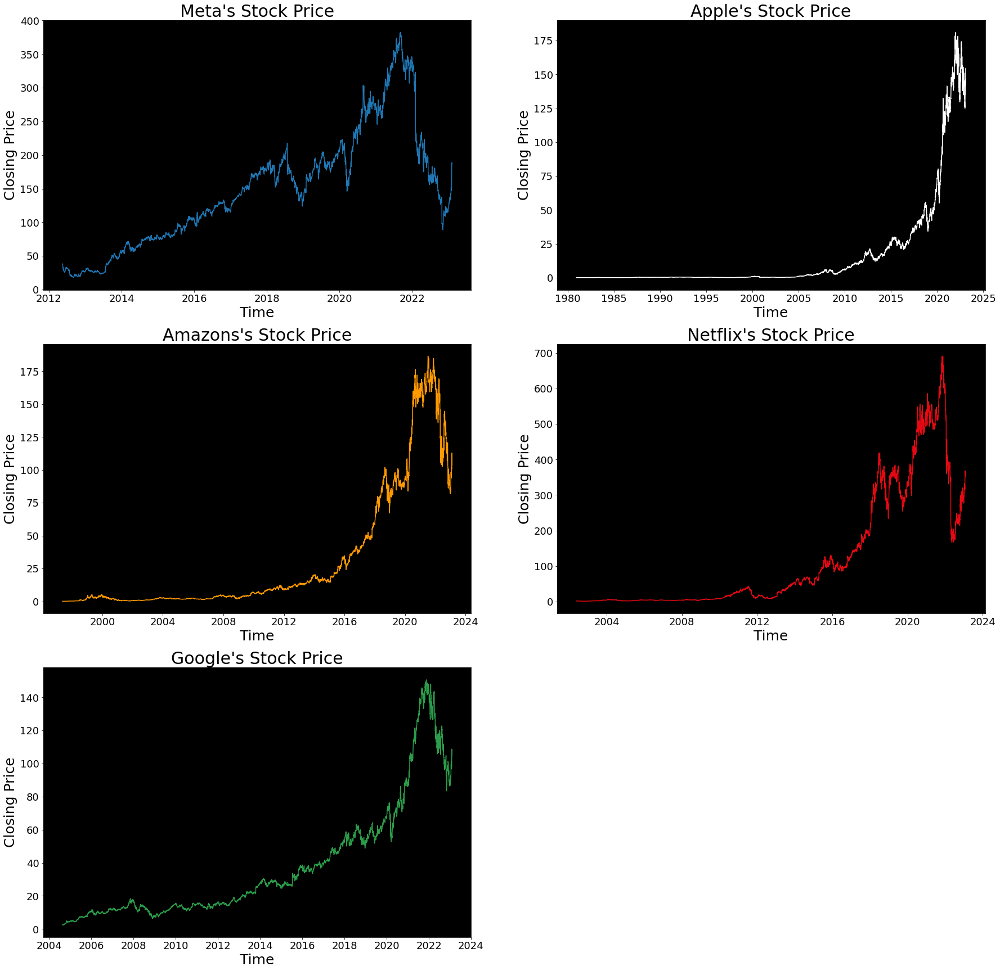

In [ ]:
def visualize_stock_prices(df_meta, df_aapl, df_amzn, df_nflx, df_goog):

    fig, axes = plt.subplots(3, 2, figsize = (30, 30))
    axes[2][1].set_visible(False)

    axes[0][0].set_facecolor('black')
    axes[0][0].plot(df_meta['Date'], df_meta['Close'])
    axes[0][0].set_title("Meta's Stock Price", fontsize = 30)
    axes[0][0].set_xlabel('Time', fontsize = 25)
    axes[0][0].set_ylabel('Closing Price', fontsize = 25)
    axes[0][0].xaxis.set_tick_params(labelsize = 18)
    axes[0][0].yaxis.set_tick_params(labelsize = 18)
    
    axes[0][1].set_facecolor('black')
    axes[0][1].plot(df_aapl['Date'], df_aapl['Close'], color = 'white')
    axes[0][1].set_title("Apple's Stock Price", fontsize = 30)
    axes[0][1].set_xlabel('Time', fontsize = 25)
    axes[0][1].set_ylabel('Closing Price', fontsize = 25)
    axes[0][1].xaxis.set_tick_params(labelsize = 18)
    axes[0][1].yaxis.set_tick_params(labelsize = 18)

    axes[1][0].set_facecolor('black')
    axes[1][0].plot(df_amzn['Date'], df_amzn['Close'], color = '#FF9900')
    axes[1][0].set_title("Amazons's Stock Price", fontsize = 30)
    axes[1][0].set_xlabel('Time', fontsize = 25)
    axes[1][0].set_ylabel('Closing Price', fontsize = 25)
    axes[1][0].xaxis.set_tick_params(labelsize = 18)
    axes[1][0].yaxis.set_tick_params(labelsize = 18)

    axes[1][1].set_facecolor('black')
    axes[1][1].plot(df_nflx['Date'], df_nflx['Close'], color = '#E50913')
    axes[1][1].set_title("Netflix's Stock Price", fontsize = 30)
    axes[1][1].set_xlabel('Time', fontsize = 25)
    axes[1][1].set_ylabel('Closing Price', fontsize = 25)
    axes[1][1].xaxis.set_tick_params(labelsize = 18)
    axes[1][1].yaxis.set_tick_params(labelsize = 18)

    axes[2][0].set_facecolor('black')
    axes[2][0].plot(df_goog['Date'], df_goog['Close'], color = '#2B9D4A')
    axes[2][0].set_title("Google's Stock Price", fontsize = 30)
    axes[2][0].set_xlabel('Time', fontsize = 25)
    axes[2][0].set_ylabel('Closing Price', fontsize = 25)
    axes[2][0].xaxis.set_tick_params(labelsize = 18)
    axes[2][0].yaxis.set_tick_params(labelsize = 18)

    plt.show()
    
visualize_stock_prices(df_meta, df_aapl, df_amzn, df_nflx, df_goog)

**Observations**: We begin by analyzing the **Closing Price** of the companies. The closing price is the last price at which a stock traded during the regular trading day. A stock's closing price is the standard benchmark used by investors to track its performance over time. As we can observe from the graphs the closing price of all the stocks has reduced significantly from 2020 to 2022. This can be attributed to the COVID-19 pandemic that led to a stock market crash.

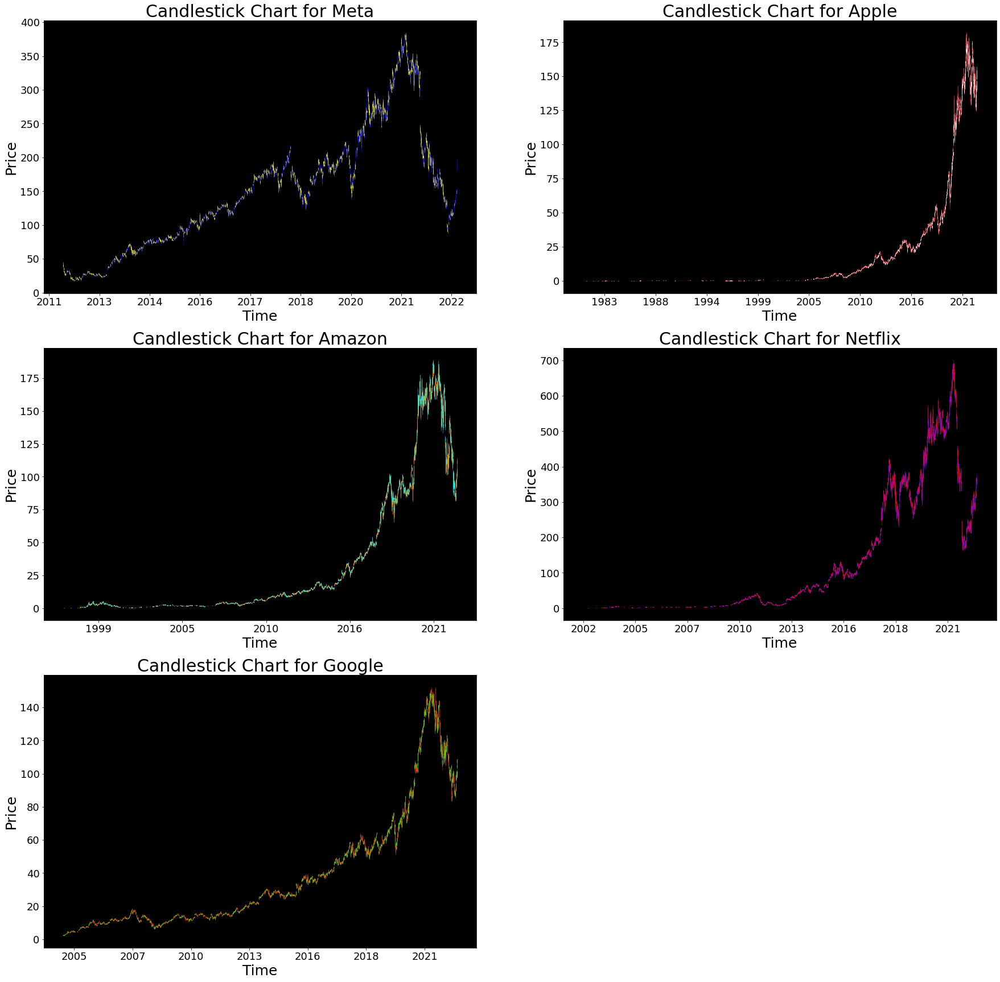

In [ ]:
def visualize_candlestick_charts(df_meta, df_aapl, df_amzn, df_nflx, df_goog):

    candlestick_chart_data = ['Date', 'Open', 'High', 'Low', 'Close']

    new_meta_df = df_meta[candlestick_chart_data]
    new_aapl_df = df_aapl[candlestick_chart_data]
    new_amzn_df = df_amzn[candlestick_chart_data]
    new_nflx_df = df_nflx[candlestick_chart_data]
    new_goog_df = df_goog[candlestick_chart_data]

    new_meta_df['Date'] = new_meta_df['Date'].map(mpdates.date2num)
    new_aapl_df['Date'] = new_aapl_df['Date'].map(mpdates.date2num)
    new_amzn_df['Date'] = new_amzn_df['Date'].map(mpdates.date2num)
    new_nflx_df['Date'] = new_nflx_df['Date'].map(mpdates.date2num)
    new_goog_df['Date'] = new_goog_df['Date'].map(mpdates.date2num)

    fig, axes = plt.subplots(3, 2, figsize = (30, 30))
    axes[2][1].set_visible(False)

    axes[0][0].set_facecolor('black')
    date_format = mpdates.DateFormatter('%Y')
    axes[0][0].xaxis.set_major_formatter(date_format)
    candlestick_ohlc(axes[0][0], new_meta_df.values, colorup = '#0000FF', colordown = '#FFFF00', alpha = 0.8)
    axes[0][0].set_title('Candlestick Chart for Meta', fontsize = 30)
    axes[0][0].set_xlabel('Time', fontsize = 25)
    axes[0][0].set_ylabel('Price', fontsize = 25)
    axes[0][0].xaxis.set_tick_params(labelsize = 18)
    axes[0][0].yaxis.set_tick_params(labelsize = 18)

    axes[0][1].set_facecolor('black')
    date_format = mpdates.DateFormatter('%Y')
    axes[0][1].xaxis.set_major_formatter(date_format)
    candlestick_ohlc(axes[0][1], new_aapl_df.values, colorup = '#FFFFFF', colordown = '#E50913', alpha = 0.8)
    axes[0][1].set_title('Candlestick Chart for Apple', fontsize = 30)
    axes[0][1].set_xlabel('Time', fontsize = 25)
    axes[0][1].set_ylabel('Price', fontsize = 25)
    axes[0][1].xaxis.set_tick_params(labelsize = 18)
    axes[0][1].yaxis.set_tick_params(labelsize = 18)

    axes[1][0].set_facecolor('black')
    date_format = mpdates.DateFormatter('%Y')
    axes[1][0].xaxis.set_major_formatter(date_format)
    candlestick_ohlc(axes[1][0], new_amzn_df.values, colorup = '#FF8000', colordown = '#01FFFF', alpha = 0.8)
    axes[1][0].set_title('Candlestick Chart for Amazon', fontsize = 30)
    axes[1][0].set_xlabel('Time', fontsize = 25)
    axes[1][0].set_ylabel('Price', fontsize = 25)
    axes[1][0].xaxis.set_tick_params(labelsize = 18)
    axes[1][0].yaxis.set_tick_params(labelsize = 18)

    axes[1][1].set_facecolor('black')
    date_format = mpdates.DateFormatter('%Y')
    axes[1][1].xaxis.set_major_formatter(date_format)
    candlestick_ohlc(axes[1][1], new_nflx_df.values, colorup = '#8000FF', colordown = '#FF0000', alpha = 0.8)
    axes[1][1].set_title('Candlestick Chart for Netflix', fontsize = 30)
    axes[1][1].set_xlabel('Time', fontsize = 25)
    axes[1][1].set_ylabel('Price', fontsize = 25)
    axes[1][1].xaxis.set_tick_params(labelsize = 18)
    axes[1][1].yaxis.set_tick_params(labelsize = 18)

    axes[2][0].set_facecolor('black')
    date_format = mpdates.DateFormatter('%Y')
    axes[2][0].xaxis.set_major_formatter(date_format)
    candlestick_ohlc(axes[2][0], new_goog_df.values, colorup = '#37F713', colordown = '#F71111', alpha = 0.8)
    axes[2][0].set_title('Candlestick Chart for Google', fontsize = 30)
    axes[2][0].set_xlabel('Time', fontsize = 25)
    axes[2][0].set_ylabel('Price', fontsize = 25)
    axes[2][0].xaxis.set_tick_params(labelsize = 18)
    axes[2][0].yaxis.set_tick_params(labelsize = 18)

    plt.show()
    
visualize_candlestick_charts(df_meta, df_aapl, df_amzn, df_nflx, df_goog)

**Observations**: An **OHLC** (Open High Low Close) chart is a type of chart typically used to illustrate movements in the price of a financial instrument over time. Each vertical line on the chart shows the price range (the highest and lowest prices) over one unit of time. Similar to the Closing Prices graph we can observe a significant decline in the OHLC charts from 2020 to 2022, due to the global pandemic.

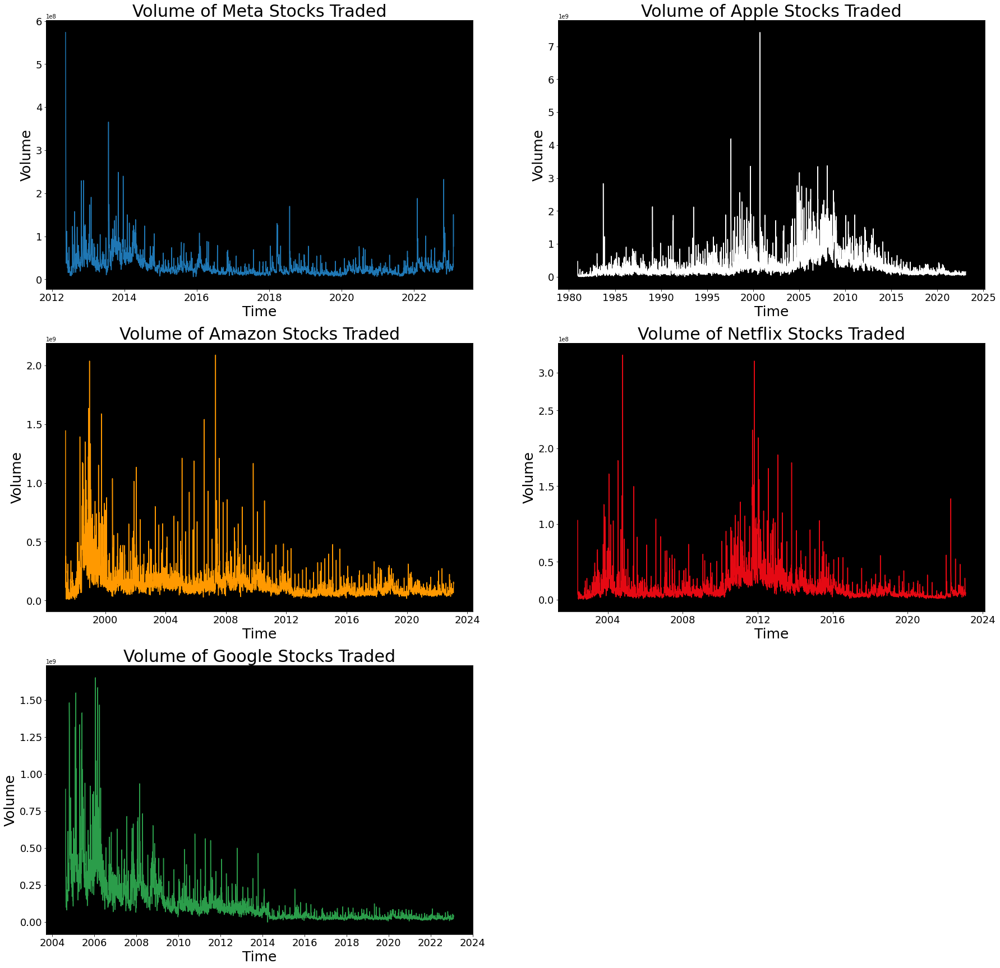

In [ ]:
def visualize_stock_volume(df_meta, df_aapl, df_amzn, df_nflx, df_goog):

    fig, axes = plt.subplots(3, 2, figsize = (30, 30))
    axes[2][1].set_visible(False)

    axes[0][0].set_facecolor('black')
    axes[0][0].plot(df_meta['Date'], df_meta['Volume'])
    axes[0][0].set_title("Volume of Meta Stocks Traded", fontsize = 30)
    axes[0][0].set_xlabel('Time', fontsize = 25)
    axes[0][0].set_ylabel('Volume', fontsize = 25)
    axes[0][0].xaxis.set_tick_params(labelsize = 18)
    axes[0][0].yaxis.set_tick_params(labelsize = 18)
    
    axes[0][1].set_facecolor('black')
    axes[0][1].plot(df_aapl['Date'], df_aapl['Volume'], color = 'white')
    axes[0][1].set_title("Volume of Apple Stocks Traded", fontsize = 30)
    axes[0][1].set_xlabel('Time', fontsize = 25)
    axes[0][1].set_ylabel('Volume', fontsize = 25)
    axes[0][1].xaxis.set_tick_params(labelsize = 18)
    axes[0][1].yaxis.set_tick_params(labelsize = 18)

    axes[1][0].set_facecolor('black')
    axes[1][0].plot(df_amzn['Date'], df_amzn['Volume'], color = '#FF9900')
    axes[1][0].set_title("Volume of Amazon Stocks Traded", fontsize = 30)
    axes[1][0].set_xlabel('Time', fontsize = 25)
    axes[1][0].set_ylabel('Volume', fontsize = 25)
    axes[1][0].xaxis.set_tick_params(labelsize = 18)
    axes[1][0].yaxis.set_tick_params(labelsize = 18)

    axes[1][1].set_facecolor('black')
    axes[1][1].plot(df_nflx['Date'], df_nflx['Volume'], color = '#E50913')
    axes[1][1].set_title("Volume of Netflix Stocks Traded", fontsize = 30)
    axes[1][1].set_xlabel('Time', fontsize = 25)
    axes[1][1].set_ylabel('Volume', fontsize = 25)
    axes[1][1].xaxis.set_tick_params(labelsize = 18)
    axes[1][1].yaxis.set_tick_params(labelsize = 18)

    axes[2][0].set_facecolor('black')
    axes[2][0].plot(df_goog['Date'], df_goog['Volume'], color = '#2B9D4A')
    axes[2][0].set_title("Volume of Google Stocks Traded", fontsize = 30)
    axes[2][0].set_xlabel('Time', fontsize = 25)
    axes[2][0].set_ylabel('Volume', fontsize = 25)
    axes[2][0].xaxis.set_tick_params(labelsize = 18)
    axes[2][0].yaxis.set_tick_params(labelsize = 18)

    plt.show()
    
visualize_stock_volume(df_meta, df_aapl, df_amzn, df_nflx, df_goog)

**Observations**: Volume of a stock measures the number of shares traded for that stock.There is no particularly observable trend when it comes to the volume of the stock. For some companies such as **Meta** and **Google** we can observe that the volume of the stock being traded when the company was listed is higher than the volume being traded at present. This is because of the increase in the stock price over time. 

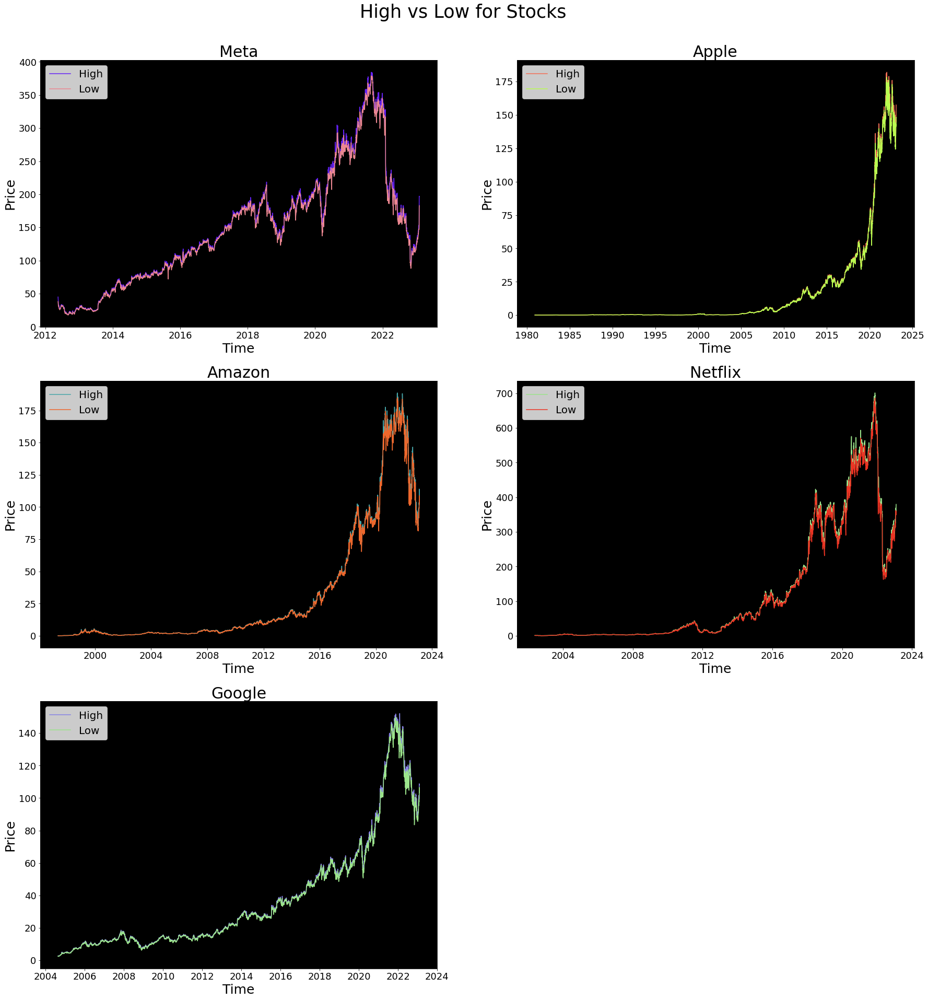

In [ ]:
def visualize_two_features_over_time_graph(df_meta, df_aapl, df_amzn, df_nflx, df_goog, time, feature1, feature2):
    
    fig, axes = plt.subplots(3, 2, figsize = (30, 30))
    axes[2][1].set_visible(False)
    
    plt.suptitle(feature1 + ' vs ' + feature2 + ' for Stocks', verticalalignment = 'top', horizontalalignment = 'center', fontsize = 35)

    axes[0][0].set_facecolor('black')
    axes[0][0].plot(df_meta[time], df_meta[feature1], color = '#6522F5', label = feature1)
    axes[0][0].plot(df_meta[time], df_meta[feature2], color = '#EB8791', label = feature2)
    axes[0][0].set_title('Meta', fontsize = 30)
    axes[0][0].set_xlabel('Time', fontsize = 25)
    axes[0][0].set_ylabel('Price', fontsize = 25)
    axes[0][0].xaxis.set_tick_params(labelsize = 18)
    axes[0][0].yaxis.set_tick_params(labelsize = 18)
    axes[0][0].legend(loc = 'upper left', fontsize = 20)
    
    axes[0][1].set_facecolor('black')
    axes[0][1].plot(df_aapl[time], df_aapl[feature1], color = '#F26E55', label = feature1)
    axes[0][1].plot(df_aapl[time], df_aapl[feature2], color = '#B9FB50', label = feature2)
    axes[0][1].set_title('Apple', fontsize = 30)
    axes[0][1].set_xlabel('Time', fontsize = 25)
    axes[0][1].set_ylabel('Price', fontsize = 25)
    axes[0][1].xaxis.set_tick_params(labelsize = 18)
    axes[0][1].yaxis.set_tick_params(labelsize = 18)
    axes[0][1].legend(loc = 'upper left', fontsize = 20)
    
    axes[1][0].set_facecolor('black')
    axes[1][0].plot(df_amzn[time], df_amzn[feature1], color = '#47A5A8', label = feature1)
    axes[1][0].plot(df_amzn[time], df_amzn[feature2], color = '#ED672C', label = feature2)
    axes[1][0].set_title('Amazon', fontsize = 30)
    axes[1][0].set_xlabel('Time', fontsize = 25)
    axes[1][0].set_ylabel('Price', fontsize = 25)
    axes[1][0].xaxis.set_tick_params(labelsize = 18)
    axes[1][0].yaxis.set_tick_params(labelsize = 18)
    axes[1][0].legend(loc = 'upper left', fontsize = 20)
    
    axes[1][1].set_facecolor('black')
    axes[1][1].plot(df_nflx[time], df_nflx[feature1], color = '#9BE48B', label = feature1)
    axes[1][1].plot(df_nflx[time], df_nflx[feature2], color = '#EB3323', label = feature2)
    axes[1][1].set_title('Netflix', fontsize = 30)
    axes[1][1].set_xlabel('Time', fontsize = 25)
    axes[1][1].set_ylabel('Price', fontsize = 25)
    axes[1][1].xaxis.set_tick_params(labelsize = 18)
    axes[1][1].yaxis.set_tick_params(labelsize = 18)
    axes[1][1].legend(loc = 'upper left', fontsize = 20)
    
    axes[2][0].set_facecolor('black')
    axes[2][0].plot(df_goog[time], df_goog[feature1], color = '#8783E3', label = feature1)
    axes[2][0].plot(df_goog[time], df_goog[feature2], color = '#9BE48B', label = feature2)
    axes[2][0].set_title('Google', fontsize = 30)
    axes[2][0].set_xlabel('Time', fontsize = 25)
    axes[2][0].set_ylabel('Price', fontsize = 25)
    axes[2][0].xaxis.set_tick_params(labelsize = 18)
    axes[2][0].yaxis.set_tick_params(labelsize = 18)
    axes[2][0].legend(loc = 'upper left', fontsize = 20)
    
    plt.subplots_adjust(top = 0.93)
    plt.show()
    
visualize_two_features_over_time_graph(df_meta, df_aapl, df_amzn, df_nflx, df_goog, 'Date', 'High', 'Low')

**Observations**: The high is the highest price at which a stock is traded during a period. The low is the lowest price of that same period. A stock's high and low points for the day are often called its intraday high and low. The **High** and **Low** of the stocks almost overlap each other, indicating that the range of Highs and Lows for the day was about the same. There are a few exceptions with an increasingly large value of **`High`** as compared to the **`Low`**. These could be indicators of a bullish market.

In [ ]:
candlestick_chart_data = ['Date', 'Open', 'High', 'Low', 'Close']
new_meta_df = df_meta[candlestick_chart_data]
new_aapl_df = df_aapl[candlestick_chart_data]
new_amzn_df = df_amzn[candlestick_chart_data]
new_nflx_df = df_nflx[candlestick_chart_data]
new_goog_df = df_goog[candlestick_chart_data]

def create_moving_averages_columns(company_data):
    days_for_moving_averages = [10, 50, 100]
    
    for moving_averages in days_for_moving_averages:
        column = f'MA for {moving_averages} days'
        company_data[column] = company_data['Close'].rolling(moving_averages).mean()
        
    return company_data

new_meta_df = create_moving_averages_columns(new_meta_df)
new_aapl_df = create_moving_averages_columns(new_aapl_df)
new_amzn_df = create_moving_averages_columns(new_amzn_df)
new_nflx_df = create_moving_averages_columns(new_nflx_df)
new_goog_df = create_moving_averages_columns(new_goog_df)

new_meta_df.tail(10)

,Date,Open,High,Low,Close,MA for 10 days,MA for 50 days,MA for 100 days
2686,2023-01-23,139.289993,143.759995,138.660004,143.270004,135.621001,120.364401,127.3232
2687,2023-01-24,141.690002,145.000000,141.360001,143.139999,136.988000,121.197801,127.1830
2688,2023-01-25,141.220001,143.169998,140.309998,141.500000,137.839000,121.790401,126.9687
2689,2023-01-26,144.399994,147.509995,143.300003,147.300003,139.280000,122.476001,126.7881
2690,2023-01-27,148.240005,153.190002,147.389999,151.740005,140.783000,123.226401,126.7023
2691,2023-01-30,149.410004,151.119995,146.949997,147.059998,141.791000,123.826001,126.5875
2692,2023-01-31,147.949997,149.880005,147.520004,148.970001,143.152000,124.540801,126.4733
2693,2023-02-01,148.029999,153.580002,147.059998,153.119995,145.162000,125.374201,126.3839
2694,2023-02-02,183.380005,197.160004,180.160004,188.770004,150.424001,126.908601,126.5801
2695,2023-02-03,183.470001,196.770004,182.889999,186.529999,155.140001,128.442001,126.7558


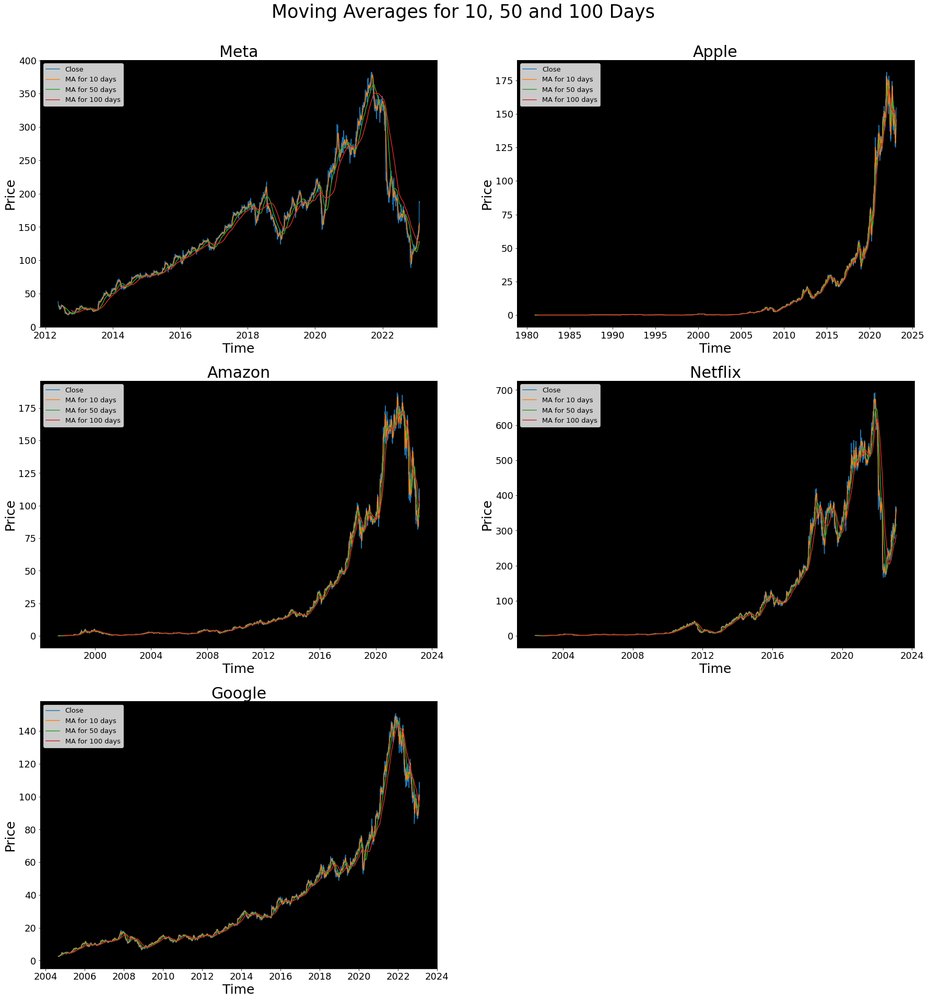

In [ ]:
def visualize_moving_averages(new_meta_df, new_aapl_df, new_amzn_df, new_nflx_df, new_goog_df, time, feature, ma1, ma2, ma3):

    fig, axes = plt.subplots(3, 2, figsize = (30, 30))
    axes[2][1].set_visible(False)

    plt.suptitle('Moving Averages for 10, 50 and 100 Days', verticalalignment = 'top', horizontalalignment = 'center', fontsize = 35)

    axes[0][0].set_facecolor('black')
    axes[0][0].plot(new_meta_df[time], new_meta_df[feature], label = feature)
    axes[0][0].plot(new_meta_df[time], new_meta_df[ma1], label = ma1)
    axes[0][0].plot(new_meta_df[time], new_meta_df[ma2], label = ma2)
    axes[0][0].plot(new_meta_df[time], new_meta_df[ma3], label = ma3)
    axes[0][0].set_title('Meta', fontsize = 30)
    axes[0][0].set_xlabel('Time', fontsize = 25)
    axes[0][0].set_ylabel('Price', fontsize = 25)
    axes[0][0].xaxis.set_tick_params(labelsize = 18)
    axes[0][0].yaxis.set_tick_params(labelsize = 18)
    axes[0][0].legend(loc = 'upper left', fontsize = 13)
    
    axes[0][1].set_facecolor('black')
    axes[0][1].plot(new_aapl_df[time], new_aapl_df[feature], label = feature)
    axes[0][1].plot(new_aapl_df[time], new_aapl_df[ma1], label = ma1)
    axes[0][1].plot(new_aapl_df[time], new_aapl_df[ma2], label = ma2)
    axes[0][1].plot(new_aapl_df[time], new_aapl_df[ma3], label = ma3)
    axes[0][1].set_title('Apple', fontsize = 30)
    axes[0][1].set_xlabel('Time', fontsize = 25)
    axes[0][1].set_ylabel('Price', fontsize = 25)
    axes[0][1].xaxis.set_tick_params(labelsize = 18)
    axes[0][1].yaxis.set_tick_params(labelsize = 18)
    axes[0][1].legend(loc = 'upper left', fontsize = 13)
    
    axes[1][0].set_facecolor('black')
    axes[1][0].plot(new_amzn_df[time], new_amzn_df[feature], label = feature)
    axes[1][0].plot(new_amzn_df[time], new_amzn_df[ma1], label = ma1)
    axes[1][0].plot(new_amzn_df[time], new_amzn_df[ma2], label = ma2)
    axes[1][0].plot(new_amzn_df[time], new_amzn_df[ma3], label = ma3)
    axes[1][0].set_title('Amazon', fontsize = 30)
    axes[1][0].set_xlabel('Time', fontsize = 25)
    axes[1][0].set_ylabel('Price', fontsize = 25)
    axes[1][0].xaxis.set_tick_params(labelsize = 18)
    axes[1][0].yaxis.set_tick_params(labelsize = 18)
    axes[1][0].legend(loc = 'upper left', fontsize = 13)
    
    axes[1][1].set_facecolor('black')
    axes[1][1].plot(new_nflx_df[time], new_nflx_df[feature], label = feature)
    axes[1][1].plot(new_nflx_df[time], new_nflx_df[ma1], label = ma1)
    axes[1][1].plot(new_nflx_df[time], new_nflx_df[ma2], label = ma2)
    axes[1][1].plot(new_nflx_df[time], new_nflx_df[ma3], label = ma3)
    axes[1][1].set_title('Netflix', fontsize = 30)
    axes[1][1].set_xlabel('Time', fontsize = 25)
    axes[1][1].set_ylabel('Price', fontsize = 25)
    axes[1][1].xaxis.set_tick_params(labelsize = 18)
    axes[1][1].yaxis.set_tick_params(labelsize = 18)
    axes[1][1].legend(loc = 'upper left', fontsize = 13)
    
    axes[2][0].set_facecolor('black')
    axes[2][0].plot(new_goog_df[time], new_goog_df[feature], label = feature)
    axes[2][0].plot(new_goog_df[time], new_goog_df[ma1], label = ma1)
    axes[2][0].plot(new_goog_df[time], new_goog_df[ma2], label = ma2)
    axes[2][0].plot(new_goog_df[time], new_goog_df[ma3], label = ma3)
    axes[2][0].set_title('Google', fontsize = 30)
    axes[2][0].set_xlabel('Time', fontsize = 25)
    axes[2][0].set_ylabel('Price', fontsize = 25)
    axes[2][0].xaxis.set_tick_params(labelsize = 18)
    axes[2][0].yaxis.set_tick_params(labelsize = 18)
    axes[2][0].legend(loc = 'upper left', fontsize = 13)

    plt.subplots_adjust(top = 0.93)
    plt.show()

visualize_moving_averages(new_meta_df, new_aapl_df, new_amzn_df, new_nflx_df, new_goog_df, 'Date', 'Close', 'MA for 10 days', 'MA for 50 days', 'MA for 100 days')

**Observations**: **Moving Averages (MA)** are one of the most popular and often used technical indicators in financial markets. In simple word, a moving average is an indicator that shows the average value of a stock's price over a period (i.e. 10 days, 50 days, 100 days, etc) and is usually plotted along with the closing price. The most common applications of moving averages are to **identify the trending direction** and determine support and resistance levels. One can also say that moving averages are used to smoothen out the **noise** of short-term price fluctuations, so as to be able to identify and define significant underlying trends more readily. When calculating a moving average, a mathematical analysis of the stock's average value over a predetermined time period is made. As the stock price changes, its average price moves up or down.

In [ ]:
new_meta_df['Daily Return'] = new_meta_df['Close'].pct_change()
new_aapl_df['Daily Return'] = new_aapl_df['Close'].pct_change()
new_amzn_df['Daily Return'] = new_amzn_df['Close'].pct_change()
new_nflx_df['Daily Return'] = new_nflx_df['Close'].pct_change()
new_goog_df['Daily Return'] = new_goog_df['Close'].pct_change()
new_meta_df.tail()

,Date,Open,High,Low,Close,MA for 10 days,MA for 50 days,MA for 100 days,Daily Return
2691,2023-01-30,149.410004,151.119995,146.949997,147.059998,141.791000,123.826001,126.5875,-0.030842
2692,2023-01-31,147.949997,149.880005,147.520004,148.970001,143.152000,124.540801,126.4733,0.012988
2693,2023-02-01,148.029999,153.580002,147.059998,153.119995,145.162000,125.374201,126.3839,0.027858
2694,2023-02-02,183.380005,197.160004,180.160004,188.770004,150.424001,126.908601,126.5801,0.232824
2695,2023-02-03,183.470001,196.770004,182.889999,186.529999,155.140001,128.442001,126.7558,-0.011866


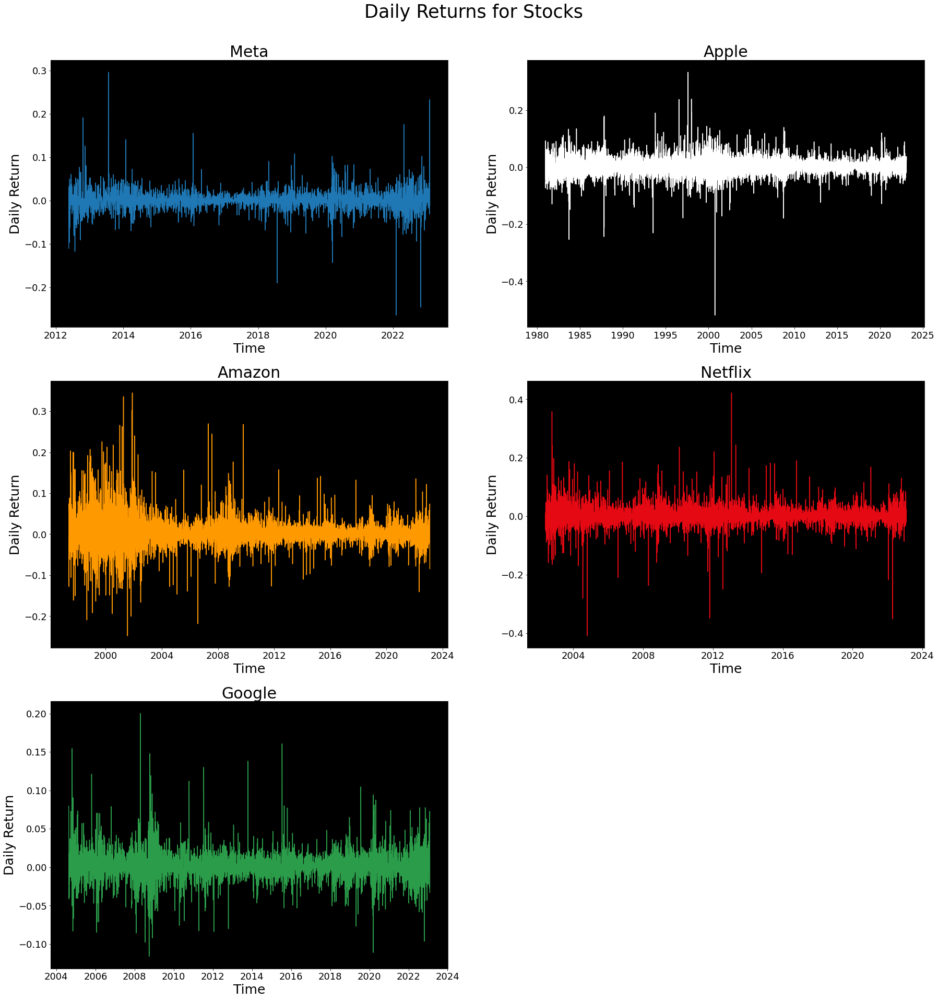

In [ ]:
def visualize_daily_return(df_meta, df_aapl, df_amzn, df_nflx, df_goog):

    fig, axes = plt.subplots(3, 2, figsize = (30, 30))
    axes[2][1].set_visible(False)
    
    plt.suptitle('Daily Returns for Stocks', verticalalignment = 'top', horizontalalignment = 'center', fontsize = 35)

    axes[0][0].set_facecolor('black')
    axes[0][0].plot(df_meta['Date'], df_meta['Daily Return'])
    axes[0][0].set_title('Meta', fontsize = 30)
    axes[0][0].set_xlabel('Time', fontsize = 25)
    axes[0][0].set_ylabel('Daily Return', fontsize = 25)
    axes[0][0].xaxis.set_tick_params(labelsize = 18)
    axes[0][0].yaxis.set_tick_params(labelsize = 18)
    
    axes[0][1].set_facecolor('black')
    axes[0][1].plot(df_aapl['Date'], df_aapl['Daily Return'], color = 'white')
    axes[0][1].set_title('Apple', fontsize = 30)
    axes[0][1].set_xlabel('Time', fontsize = 25)
    axes[0][1].set_ylabel('Daily Return', fontsize = 25)
    axes[0][1].xaxis.set_tick_params(labelsize = 18)
    axes[0][1].yaxis.set_tick_params(labelsize = 18)

    axes[1][0].set_facecolor('black')
    axes[1][0].plot(df_amzn['Date'], df_amzn['Daily Return'], color = '#FF9900')
    axes[1][0].set_title('Amazon', fontsize = 30)
    axes[1][0].set_xlabel('Time', fontsize = 25)
    axes[1][0].set_ylabel('Daily Return', fontsize = 25)
    axes[1][0].xaxis.set_tick_params(labelsize = 18)
    axes[1][0].yaxis.set_tick_params(labelsize = 18)

    axes[1][1].set_facecolor('black')
    axes[1][1].plot(df_nflx['Date'], df_nflx['Daily Return'], color = '#E50913')
    axes[1][1].set_title('Netflix', fontsize = 30)
    axes[1][1].set_xlabel('Time', fontsize = 25)
    axes[1][1].set_ylabel('Daily Return', fontsize = 25)
    axes[1][1].xaxis.set_tick_params(labelsize = 18)
    axes[1][1].yaxis.set_tick_params(labelsize = 18)

    axes[2][0].set_facecolor('black')
    axes[2][0].plot(df_goog['Date'], df_goog['Daily Return'], color = '#2B9D4A')
    axes[2][0].set_title('Google', fontsize = 30)
    axes[2][0].set_xlabel('Time', fontsize = 25)
    axes[2][0].set_ylabel('Daily Return', fontsize = 25)
    axes[2][0].xaxis.set_tick_params(labelsize = 18)
    axes[2][0].yaxis.set_tick_params(labelsize = 18)
    
    plt.subplots_adjust(top = 0.93)
    plt.show()
    
visualize_daily_return(new_meta_df, new_aapl_df, new_amzn_df, new_nflx_df, new_goog_df)

**Observations**: Daily return on a stock is used to measure the **day to day performance** of stocks, it is the price of stocks at today’s close compared to the price of the same stock at yesterday’s close. A positive daily return means appreciation in stock price for that particular day. Based on the graphs we plotted for the daily return over time for stocks, *no particular pattern or trend can be observed*. All the graphs contain a **large number of fluctuations** in the data, making it difficult to identify any specific trend in the movement of the stock.

#Machine Learning

In [ ]:


"""
helper function to better understand every operation we are applying
"""
def apply_func(function,stocks):
    for s in stocks:
        function(s.tail(10))
'''
function to load stock data from the path
'''
def load_stock(name):
    df = pd.read_csv("/content/input/{}.csv".format(name))
    return df


'''
we chose to examine 5 popular stocks from usa main stock market(NYSE)
1.Meta
2.Apple
3.Amazon
4.Netflix
5.google
'''
names=[("META"),("AAPL"),("AMZN"),("NFLX"),("GOOG")]
stocks=[load_stock(n) for n in names]

apply_func(print,stocks)


            Date        Open        High         Low       Close     Volume  \
2686  2023-01-23  139.289993  143.759995  138.660004  143.270004   27470100   
2687  2023-01-24  141.690002  145.000000  141.360001  143.139999   21970200   
2688  2023-01-25  141.220001  143.169998  140.309998  141.500000   26622000   
2689  2023-01-26  144.399994  147.509995  143.300003  147.300003   25482100   
2690  2023-01-27  148.240005  153.190002  147.389999  151.740005   35746900   
2691  2023-01-30  149.410004  151.119995  146.949997  147.059998   28040100   
2692  2023-01-31  147.949997  149.880005  147.520004  148.970001   29842100   
2693  2023-02-01  148.029999  153.580002  147.059998  153.119995   55661000   
2694  2023-02-02  183.380005  197.160004  180.160004  188.770004  150475700   
2695  2023-02-03  183.470001  196.770004  182.889999  186.529999   76733100   

      Dividends  Stock Splits  
2686          0             0  
2687          0             0  
2688          0             0  
26

In [ ]:
meta_df = stocks[0]
aapl_df = stocks[1]
amzn_df = stocks[2]
nflx_df = stocks[3]
goog_df = stocks[4]



In [ ]:
for i,stock in enumerate(stocks):
    print(names[i][0])
    print(stock.info())
    print(stock.isnull().sum())
    print(stock.describe())

"""
before feature creation there is no null values and the data is pretty clean.
"""

M
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2696 entries, 0 to 2695
Data columns (total 8 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   Date          2696 non-null   object 
 1   Open          2696 non-null   float64
 2   High          2696 non-null   float64
 3   Low           2696 non-null   float64
 4   Close         2696 non-null   float64
 5   Volume        2696 non-null   int64  
 6   Dividends     2696 non-null   int64  
 7   Stock Splits  2696 non-null   int64  
dtypes: float64(4), int64(3), object(1)
memory usage: 168.6+ KB
None
Date            0
Open            0
High            0
Low             0
Close           0
Volume          0
Dividends       0
Stock Splits    0
dtype: int64
              Open         High          Low        Close        Volume  \
count  2696.000000  2696.000000  2696.000000  2696.000000  2.696000e+03   
mean    147.897682   149.792964   146.028850   147.943542  3.124466e+07   
std      86

'\nbefore feature creation there is no null values and the data is pretty clean.\n'

## Feature creation
**One of the most important and intersting part. at this stage we add to think outside the box and to help the prediction with some information that we create using few other features.**



In [ ]:
ma_days = [7,10,14,21,50,100]
maxi_days=[7,30,365,730]
# create features that calulates moving average, maximum values for n days, ,minimum values for n days, std of last 7 days

"""
average for x days
""" 
def calculate_average(df,ma_days):
    for ma in ma_days:
        column_name = "MA for %s days" %(str(ma))
        df.loc[:,column_name]=pd.DataFrame.rolling(df['Close'],ma).mean()
        
"""
maximum for x days
""" 
def calculate_maximum(df,ma_days):
    for ma in maxi_days:
        column_name = "Maximum for %s days" %(str(ma))
        df.loc[:,column_name]=pd.DataFrame.rolling(df['Close'],ma).max()
"""
minimum for x days
""" 
def calculate_minimum(df,ma_days):
    for ma in maxi_days:
        column_name = "Minimum for %s days" %(str(ma))
        df.loc[:,column_name]=pd.DataFrame.rolling(df['Close'],ma).min()

def calc_df(df):
  calculate_average(df,ma_days)
  calculate_maximum(df,maxi_days)
  calculate_minimum(df,maxi_days)
  df.loc[:,"std for 7 days"]=pd.DataFrame.rolling(df['Close'],7).std()
  #add difference high-low daily feature
  df.loc[:,'Diff High Low']=df['High']-df['Low']
  #add diff open-close feature
  df.loc[:,'Diff Open Close']=df['Open']-df['Close']
  df.loc[:,'Daily Return'] = df['Close'].pct_change()*100

  print("number of features {}".format(len(df.columns)))
  df.columns

calc_df(meta_df)
calc_df(aapl_df)
calc_df(amzn_df)
calc_df(nflx_df)
calc_df(goog_df)


number of features 26
number of features 26
number of features 26
number of features 26
number of features 26


## Normalization the dataset with min-max scalar
**we wil examine the models with and without normalization**

In [ ]:
from sklearn.preprocessing import MinMaxScaler
def normalize(df):
    scaler = MinMaxScaler(feature_range=(0,1))
    df = scaler.fit_transform(df)
    df=pd.DataFrame(df)
    return df

**convert the date string to date_time type and convert the index to date**

In [ ]:
"""
we decided to chose the last 6 years for the data set. 
That decision was made Based on articles that we read and empirical  tests.
"""

for index,stock in enumerate(stocks):
    stock['Date'] = pd.to_datetime(stock['Date'],dayfirst=True)
    start_date=pd.to_datetime("01/01/2017")
    end_date=pd.to_datetime("01/01/2023")
    stock = stock[(stock["Date"] >= start_date) & (stock["Date"] <= end_date)]
    stock.set_index('Date', inplace=True)
    stocks[index]=stock
meta_df = stocks[0]
aapl_df = stocks[1]
amzn_df = stocks[2]
nflx_df = stocks[3]
goog_df = stocks[4]


**delete null values and replace them with average, prepare the df for feature selection and prediction**


In [ ]:
def y_and_del_null(df,name):

  print('='*50)
  print(name)
  print('='*50)
  y = df['Close'][1:] #target column -close value
  df.loc[:,'Close previous']=df['Close']
  df=df.drop(['Close'],axis=1)
  df=df.shift(periods=1)[1:]

  # we decided not to normalize because the result's performance decreased 
  # df=normalize(df)


  # print(x_train.head(30))
  print(df.isnull().sum())
  print(y.isnull().sum)
  return y


y_meta = y_and_del_null(meta_df,'META')
y_aapl = y_and_del_null(aapl_df,'APPLE')
y_amzn = y_and_del_null(amzn_df,'AMAZON')
y_nflx = y_and_del_null(nflx_df,'NETFLIX')
y_goog = y_and_del_null(goog_df,'GOOGLE')

META
Open                    0
High                    0
Low                     0
Volume                  0
Dividends               0
Stock Splits            0
MA for 7 days           0
MA for 10 days          0
MA for 14 days          0
MA for 21 days          0
MA for 50 days          0
MA for 100 days         0
Maximum for 7 days      0
Maximum for 30 days     0
Maximum for 365 days    0
Maximum for 730 days    0
Minimum for 7 days      0
Minimum for 30 days     0
Minimum for 365 days    0
Minimum for 730 days    0
std for 7 days          0
Diff High Low           0
Diff Open Close         0
Daily Return            0
Close previous          0
dtype: int64
<bound method NDFrame._add_numeric_operations.<locals>.sum of Date
2017-01-04    False
2017-01-05    False
2017-01-06    False
2017-01-09    False
2017-01-10    False
              ...  
2022-12-23    False
2022-12-27    False
2022-12-28    False
2022-12-29    False
2022-12-30    False
Name: Close, Length: 1509, dtype: bool>
APPLE

## split into test-train 

In [ ]:
from sklearn.model_selection import train_test_split

'''
because our model is time series, shuffle must be false because every value depened on the previous one
'''
def ml_split(df,y):
  df = df[:len(y)]
  x_train, x_test, y_train, y_test = train_test_split(df, y, test_size=0.25, shuffle=False)
  return x_train, x_test, y_train, y_test

x_train_meta, x_test_meta, y_train_meta, y_test_meta = ml_split(meta_df,y_meta)
x_train_aapl, x_test_aapl, y_train_aapl, y_test_aapl = ml_split(aapl_df,y_aapl)
x_train_amzn, x_test_amzn, y_train_amzn, y_test_amzn = ml_split(amzn_df,y_amzn)
x_train_nflx, x_test_nflx, y_train_nflx, y_test_nflx = ml_split(nflx_df,y_nflx)
x_train_goog, x_test_goog, y_train_goog, y_test_goog = ml_split(goog_df,y_goog)

best features for:  META


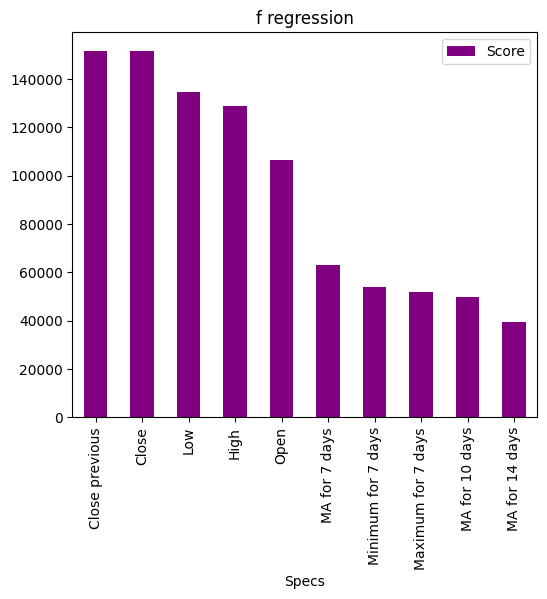

                  Open        High         Low       Close  Close previous
Date                                                                      
2017-01-03  116.029999  117.839996  115.510002  116.860001      116.860001
2017-01-04  117.550003  119.660004  117.290001  118.690002      118.690002
2017-01-05  118.860001  120.949997  118.320000  120.669998      120.669998
2017-01-06  120.980003  123.879997  120.029999  123.410004      123.410004
2017-01-09  123.550003  125.430000  123.040001  124.900002      124.900002
...                ...         ...         ...         ...             ...
2021-06-24  341.850006  344.899994  341.790009  343.179993      343.179993
2021-06-25  342.589996  344.119995  339.679993  341.369995      341.369995
2021-06-28  342.459991  358.140015  341.769989  355.640015      355.640015
2021-06-29  356.269989  356.739990  349.049988  351.890015      351.890015
2021-06-30  352.170013  352.920013  347.170013  347.709991      347.709991

[1131 rows x 5 columns]


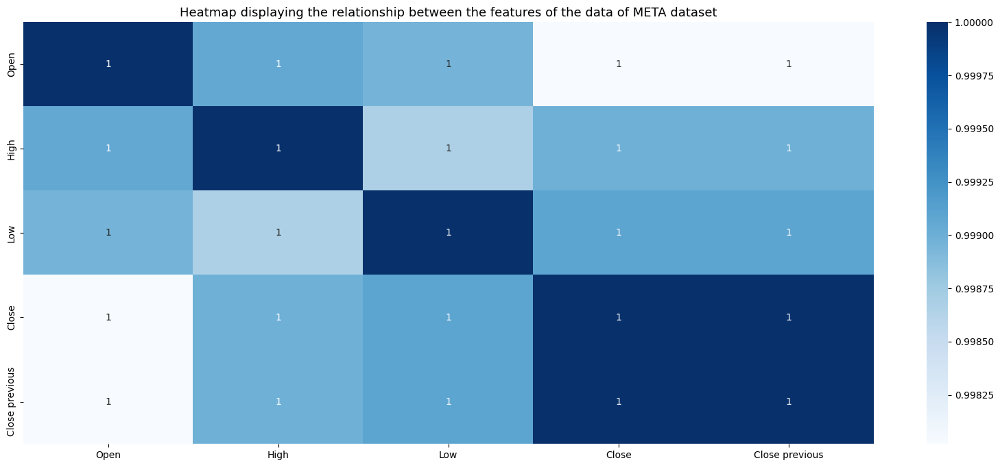

best features for:  APPLE


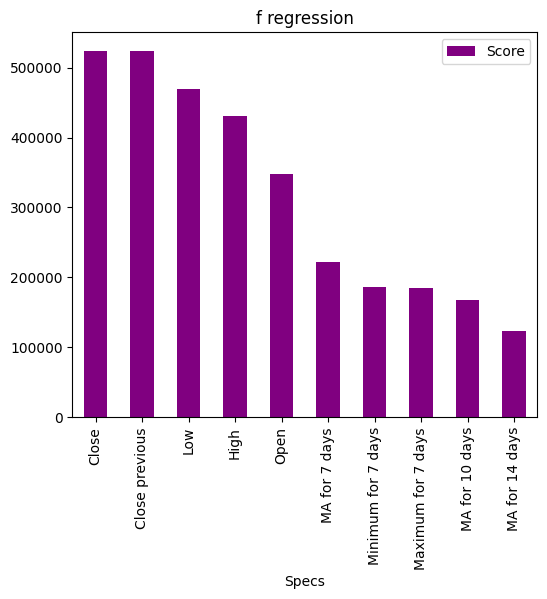

                  Open        High         Low       Close  Close previous
Date                                                                      
2017-01-03   27.092870   27.216870   26.849549   27.174757       27.174757
2017-01-04   27.104562   27.258978   27.081166   27.144335       27.144335
2017-01-05   27.120942   27.340868   27.095206   27.282377       27.282377
2017-01-06   27.322152   27.645021   27.249624   27.586531       27.586531
2017-01-09   27.595891   27.942157   27.593553   27.839212       27.839212
...                ...         ...         ...         ...             ...
2021-06-24  133.279674  133.468023  131.772901  132.248734      132.248734
2021-06-25  132.298314  132.724564  131.653963  131.951355      131.951355
2021-06-28  132.248741  134.072722  132.189266  133.606812      133.606812
2021-06-29  133.626630  135.301921  133.180550  135.143311      135.143311
2021-06-30  134.984721  136.213933  134.687329  135.767853      135.767853

[1131 rows x 5 columns]


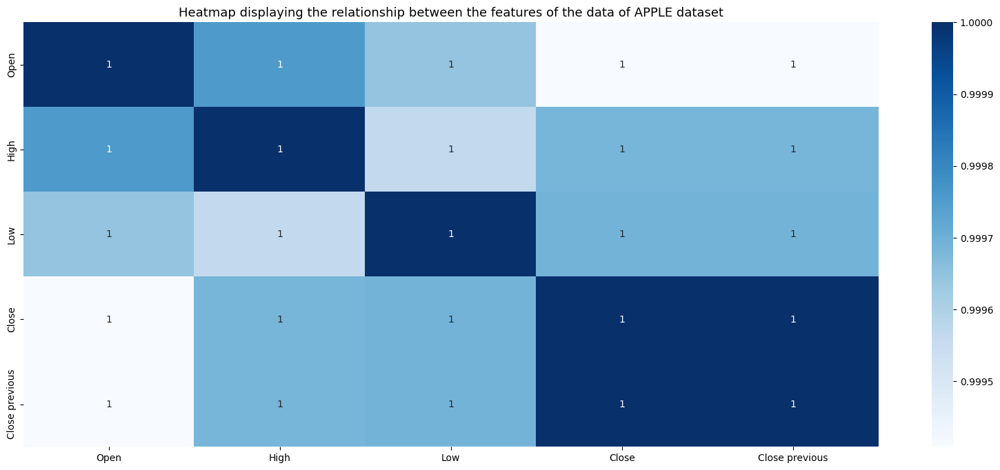

best features for:  AMAZON


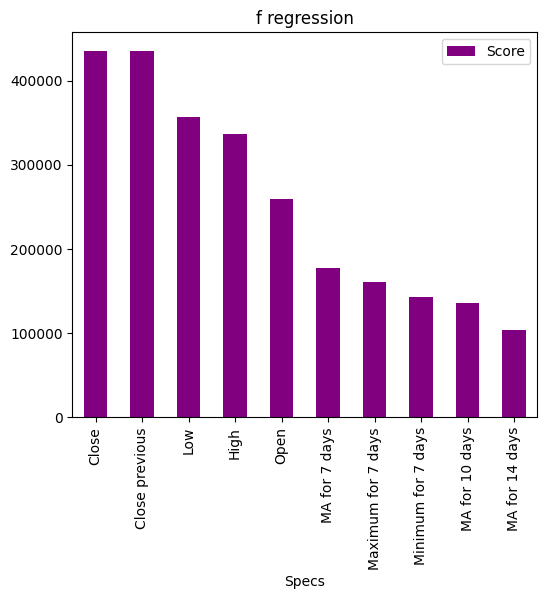

                  Open        High         Low       Close  Close previous
Date                                                                      
2017-01-03   37.896000   37.938000   37.384998   37.683498       37.683498
2017-01-04   37.919498   37.984001   37.709999   37.859001       37.859001
2017-01-05   38.077499   39.119999   38.013000   39.022499       39.022499
2017-01-06   39.118000   39.972000   38.924000   39.799500       39.799500
2017-01-09   39.900002   40.088501   39.588501   39.846001       39.846001
...                ...         ...         ...         ...             ...
2021-06-24  175.382004  176.242996  171.542496  172.453995      172.453995
2021-06-25  173.199997  173.240997  169.709000  170.072998      170.072998
2021-06-28  170.800003  172.399994  170.675507  172.194504      172.194504
2021-06-29  171.940994  172.801498  171.151505  172.406998      172.406998
2021-06-30  172.052994  173.580002  171.750000  172.007996      172.007996

[1131 rows x 5 columns]


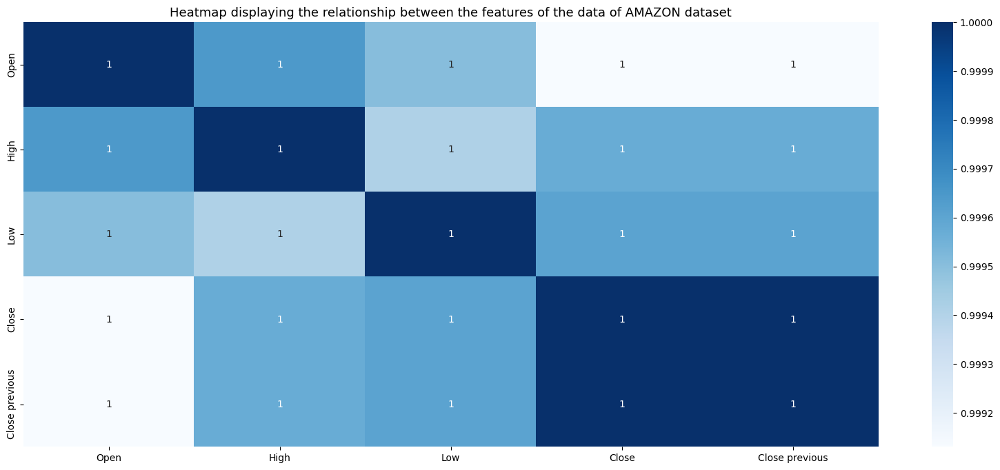

best features for:  NETFLIX


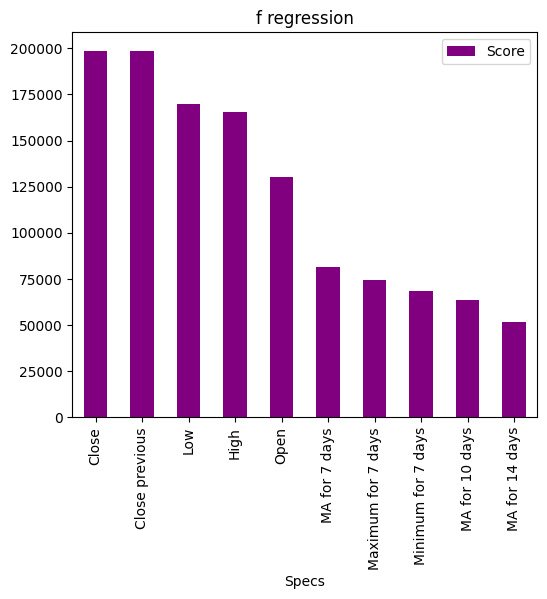

                  Open        High         Low       Close  Close previous
Date                                                                      
2017-01-03  124.959999  128.190002  124.309998  127.489998      127.489998
2017-01-04  127.489998  130.169998  126.550003  129.410004      129.410004
2017-01-05  129.220001  132.750000  128.899994  131.809998      131.809998
2017-01-06  132.080002  133.880005  129.809998  131.070007      131.070007
2017-01-09  131.479996  131.990005  129.889999  130.949997      130.949997
...                ...         ...         ...         ...             ...
2021-06-24  517.960022  520.960022  514.400024  518.059998      518.059998
2021-06-25  528.840027  533.059998  525.000000  527.070007      527.070007
2021-06-28  528.119995  533.940002  524.559998  533.030029      533.030029
2021-06-29  533.549988  536.130005  528.570007  533.500000      533.500000
2021-06-30  534.059998  534.380005  526.820007  528.210022      528.210022

[1131 rows x 5 columns]


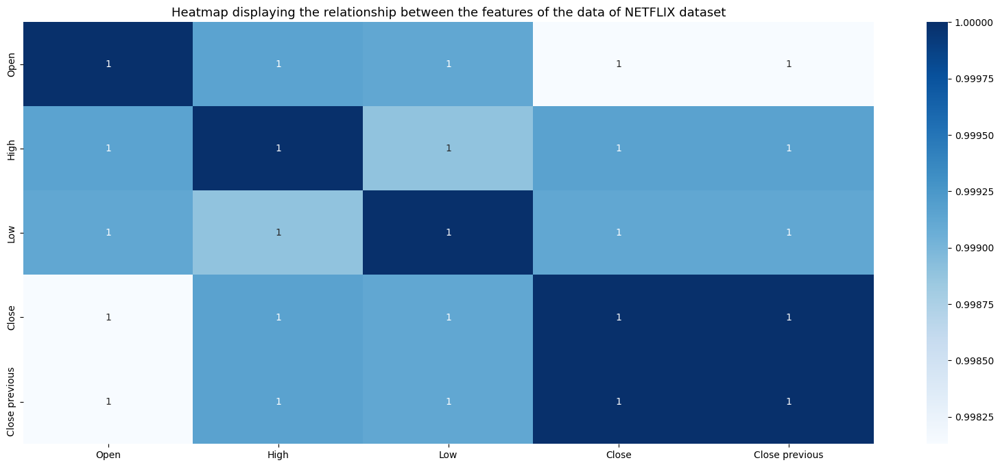

best features for:  GOOGLE


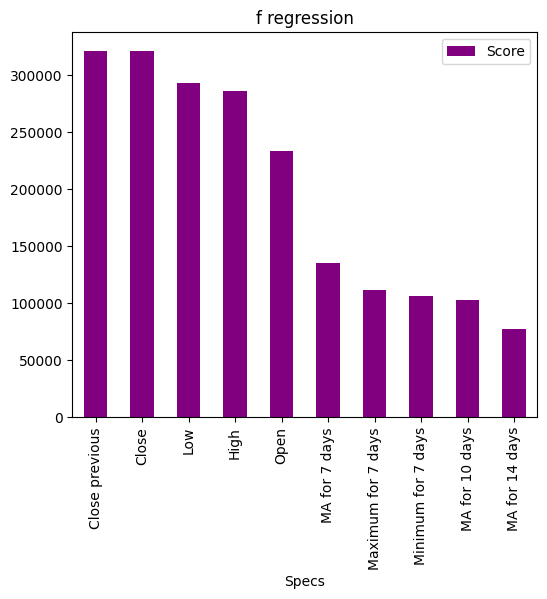

                  Open        High         Low       Close  Close previous
Date                                                                      
2017-01-03   38.940498   39.481499   38.790001   39.306999       39.306999
2017-01-04   39.417999   39.567001   39.158001   39.345001       39.345001
2017-01-05   39.304001   39.723999   39.250999   39.701000       39.701000
2017-01-06   39.763000   40.395000   39.610199   40.307499       40.307499
2017-01-09   40.320000   40.498299   40.141499   40.332500       40.332500
...                ...         ...         ...         ...             ...
2021-06-24  127.053497  127.535500  126.959999  127.281998      127.281998
2021-06-25  126.957001  127.504997  126.444000  126.995003      126.995003
2021-06-28  127.000000  127.336998  125.973801  126.819504      126.819504
2021-06-29  126.772499  127.000000  125.436996  126.018501      126.018501
2021-06-30  125.653549  125.800003  124.757500  125.316002      125.316002

[1131 rows x 5 columns]


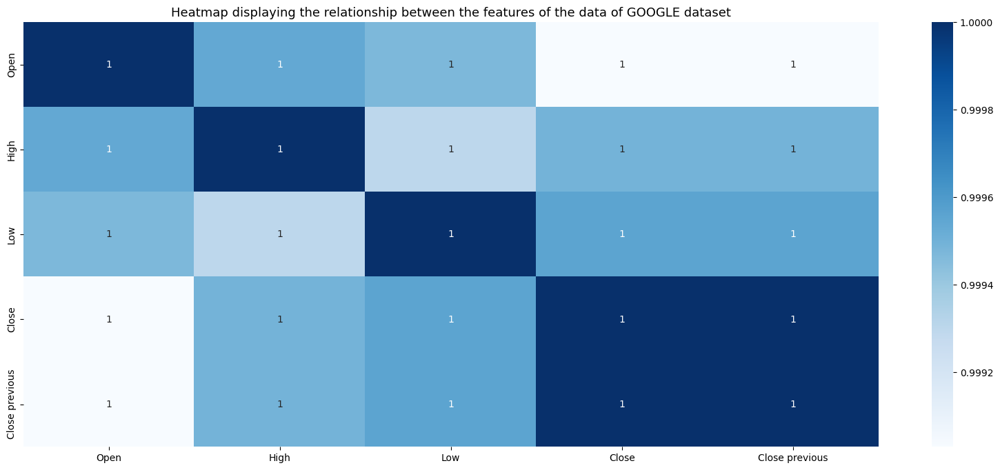

In [ ]:
from sklearn.feature_selection import SelectKBest,f_classif,f_regression,mutual_info_regression

#feature selection for from train data!
import matplotlib.pyplot as plt
import seaborn as sns

##todo how much features to select for the model##
def select_k_features(func,x_train,y_train):
    #apply SelectKBest class to extract top 10 best features
    bestfeatures = SelectKBest(score_func=func, k=5)
    fit = bestfeatures.fit(x_train,y_train)
    dfscores = pd.DataFrame(fit.scores_)
    dfcolumns = pd.DataFrame(x_train.columns)
    #concat two dataframes for better visualization 
    featureScores = pd.concat([dfcolumns,dfscores],axis=1)
    featureScores.columns = ['Specs','Score']  #naming the dataframe columns
    featureScores.nlargest(10,'Score').plot.bar(x="Specs",y="Score",figsize=(6,5),color="purple")
    plt.title("f regression")
    plt.show()
    best_10=list(featureScores.nlargest(5,'Score')['Specs'])
    for col in x_train:
        if col not in best_10:
            x_train.drop([col], axis=1, inplace=True)
    return x_train

def select_k_features_for_each_model(x_train,y_train,x_test,name):

  
  print('='*50)
  print('best features for: ',name)
  print('='*50)

  x_train=select_k_features(f_regression,x_train,y_train)

  print(x_train)
  x_test=x_test[x_train.columns]
  x_train.columns

  plt.figure(figsize=(20,8))
  sns.heatmap(x_train.corr(),cmap=plt.cm.Blues,annot=True)
  plt.title(f'Heatmap displaying the relationship between the features of the data of {name} dataset',
          fontsize=13)
  plt.show()
  return x_train,x_test


x_train_meta,x_test_meta = select_k_features_for_each_model(x_train_meta,y_train_meta,x_test_meta,'META')
x_train_aapl,x_test_aapl = select_k_features_for_each_model(x_train_aapl,y_train_aapl,x_test_aapl,'APPLE')
x_train_amzn,x_test_amzn = select_k_features_for_each_model(x_train_amzn,y_train_amzn,x_test_amzn,'AMAZON')
x_train_nflx,x_test_nflx = select_k_features_for_each_model(x_train_nflx,y_train_nflx,x_test_nflx,'NETFLIX')
x_train_goog,x_test_goog = select_k_features_for_each_model(x_train_goog,y_train_goog,x_test_goog,'GOOGLE')

In [249]:
import sklearn.metrics
import math
from sklearn.model_selection import TimeSeriesSplit

def mean_absolute_percentage_error(y_true, y_pred): 
    y_true, y_pred = np.array(y_true), np.array(y_pred)
    return np.mean(np.abs((y_true - y_pred) / y_true)) * 100



def train_test_and_measure(model_name,model,x_train,x_test,y_train,y_test,name):
    print('='*50)
    print('Expirement of: ',name)
    print('='*50)
    model=model.fit(x_train,y_train)
    prediction = model.predict(x_test)
    mse = sklearn.metrics.mean_squared_error(y_test,prediction)
    rmse = math.sqrt(mse)
    MBE = np.mean(prediction - y_test)
    print("Test set MAPE: {} ".format(model_name), mean_absolute_percentage_error(y_test,prediction))
    print("Test set RMSE: {} ".format(model_name), rmse)
    print("Test set MBE: {} ".format(model_name), MBE)
    print("r^2: {} ".format(model.score(x_test,y_test)))
    plot_df_train=pd.DataFrame(y_train)
    plot_df=pd.DataFrame(y_test)
    plot_df["predictions"]=prediction
    print(plot_df[-5:])
    plt.figure(figsize=(18,5))
    plt.plot(plot_df_train[-360:])
    plt.plot(plot_df)
    plt.show()    
    plot_df=pd.DataFrame(y_test)
    plot_df["predictions"]=prediction
    plot_df[-360:].plot(legend=True, figsize = (15, 8))
    plt.show()
    


## train linear regression model and measure the rmse, r squared,mape & mbe

In [ ]:
 pip install scikit-optimize

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
import time
from datetime import datetime
import plotly.express as px
from plotly.offline import init_notebook_mode
init_notebook_mode(connected=True)
from sklearn.linear_model import LinearRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import AdaBoostRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.datasets import make_regression
import matplotlib.pyplot as plt
from sklearn.neural_network import MLPRegressor
from sklearn.svm import SVR
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import StandardScaler
from skopt import BayesSearchCV
from skopt.space import Real, Categorical, Integer
from sklearn.model_selection import GridSearchCV
from sklearn.ensemble import GradientBoostingRegressor


## choose best hyper parameters

In [ ]:
def mlp_model(X, Y):
    estimator=MLPRegressor(learning_rate_init=0.002)
    param_grid = {'hidden_layer_sizes': [(50,50,50), (50,100,50), (100,1)],
              'activation': ['relu','tanh','logistic'],
              'alpha': [0.0001, 0.05],
              'learning_rate': ['constant','adaptive'],
              'solver': ['adam']}
    gsc = GridSearchCV(
        estimator,
        param_grid,
        cv=5, scoring='neg_mean_squared_error', verbose=0, n_jobs=-1)
    grid_result = gsc.fit(X, Y)
    best_params = grid_result.best_params_
    print(best_params)
    return best_params

## 4.Modeling

In [ ]:
from sklearn.neural_network import MLPRegressor

"""
create models:
1. Linear Regression
2.Random Forest Regresson
3.Support Vector Regression 
4.Gradient boosting regressor
5.Mlp Regressor
"""
regression_model = LinearRegression()
randomForestRegressor_model = RandomForestRegressor(max_depth=6, random_state=1)
svr = make_pipeline(StandardScaler(), SVR(C=1.0, epsilon=0.2))
gradientReg = GradientBoostingRegressor(random_state=0)
MLPRegressor=MLPRegressor(hidden_layer_sizes=(50, 50, 50), activation='relu',  solver='adam', alpha=0.0001, batch_size='auto', learning_rate='constant', learning_rate_init=0.001, power_t=0.5, max_iter=300, shuffle=True, random_state=None, tol=0.0001, verbose=False, warm_start=False, momentum=0.9, nesterovs_momentum=True, early_stopping=False, validation_fraction=0.1, beta_1=0.9, beta_2=0.999, epsilon=1e-08, n_iter_no_change=10, max_fun=15000)



#notes
# randomForestRegressor_model = RandomForestRegressor(n_estimators=800,min_samples_split=10, min_samples_leaf=2, max_depth=None,bootstrap=False)
# mlp_model(x_train,y_train)
# {'activation': 'relu', 'alpha': 0.0001, 'hidden_layer_sizes': (50, 50, 50), 'learning_rate': 'constant', 'solver': 'adam'}
# MLPRegressor=MLPRegressor(hidden_layer_sizes=(200,), activation='tanh',  solver='adam', alpha=0.0001, batch_size='auto', learning_rate='constant', learning_rate_init=0.001, power_t=0.5, max_iter=300, shuffle=False, random_state=None, tol=0.0001, verbose=False, warm_start=False, momentum=0.9, nesterovs_momentum=True, early_stopping=False, validation_fraction=0.1, beta_1=0.9, beta_2=0.999, epsilon=1e-08, n_iter_no_change=10, max_fun=15000)
# MLPRegressor=MLPRegressor(hidden_layer_sizes=(100,), activation='logistic',  solver='adam', alpha=0.0001, batch_size='auto', learning_rate='constant', learning_rate_init=0.001, power_t=0.5, max_iter=200, shuffle=True, random_state=None, tol=0.0001, verbose=False, warm_start=False, momentum=0.9, nesterovs_momentum=True, early_stopping=False, validation_fraction=0.1, beta_1=0.9, beta_2=0.999, epsilon=1e-08, n_iter_no_change=10, max_fun=15000)





In [ ]:
# train_test_and_measure("regression_model",regression_model)
# train_test_and_measure("randomForestRegressor_model",randomForestRegressor_model)
# train_test_and_measure("MLPRegressor",MLPRegressor)
# train_test_and_measure("SVR_model",svr)
# train_test_and_measure("gradientReg_model",gradientReg)

## 5.Fit and Evaluation 

###MLP

Expirement of:  META
Test set MAPE: MLPRegressor  2.43545989618465
Test set RMSE: MLPRegressor  7.8629967936901615
Test set MBE: MLPRegressor  1.032175542187182
r^2: 0.992609093333666 
                 Close  predictions
Date                               
2022-12-23  118.040001   117.024183
2022-12-27  116.879997   117.366108
2022-12-28  115.620003   117.220789
2022-12-29  120.260002   116.108531
2022-12-30  120.339996   119.122274


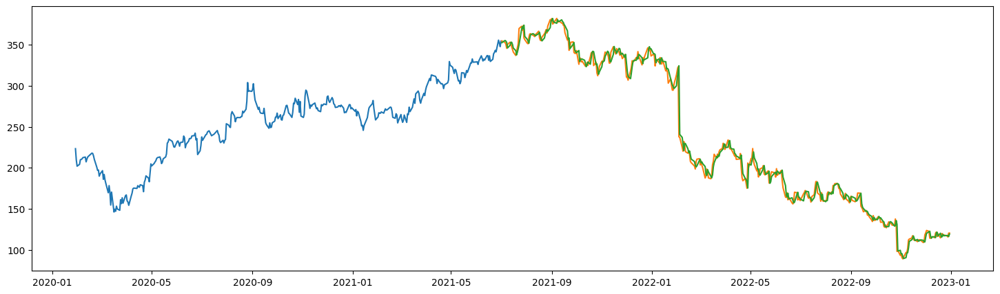

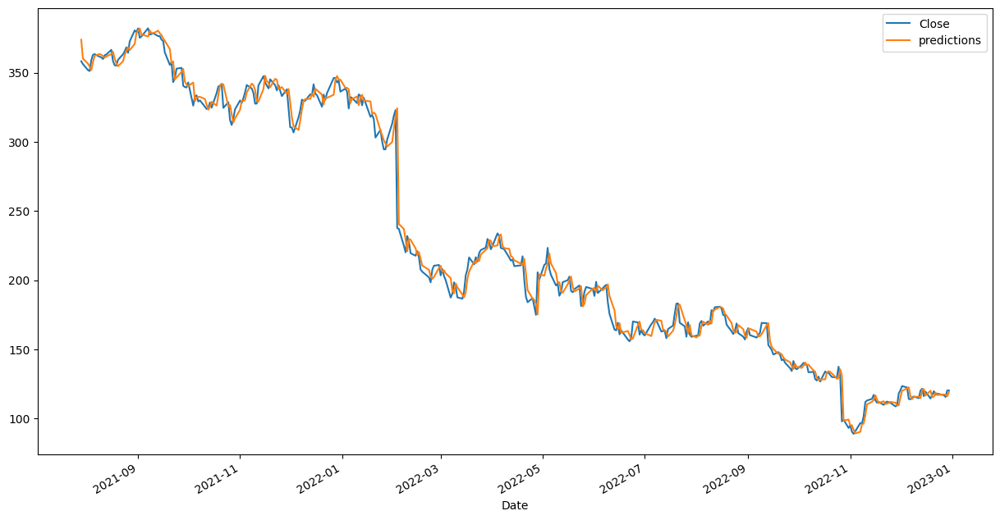

Expirement of:  APPLE
Test set MAPE: MLPRegressor  1.7466906367141612
Test set RMSE: MLPRegressor  3.391328484244858
Test set MBE: MLPRegressor  0.3141659597287626
r^2: 0.9233539826424997 
                 Close  predictions
Date                               
2022-12-23  131.860001   133.178361
2022-12-27  130.029999   131.498919
2022-12-28  126.040001   130.754287
2022-12-29  129.610001   128.446109
2022-12-30  129.929993   129.207857


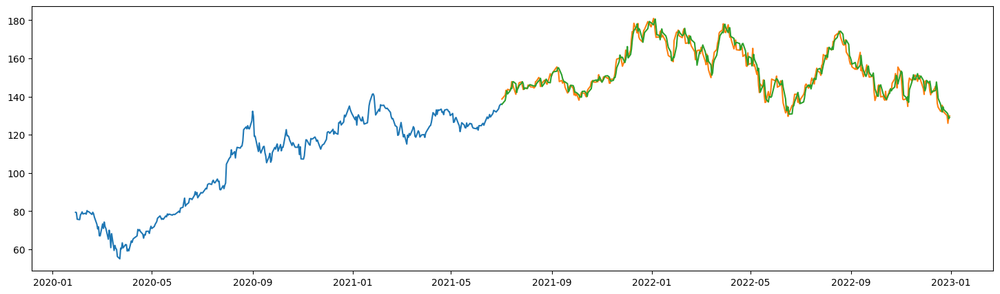

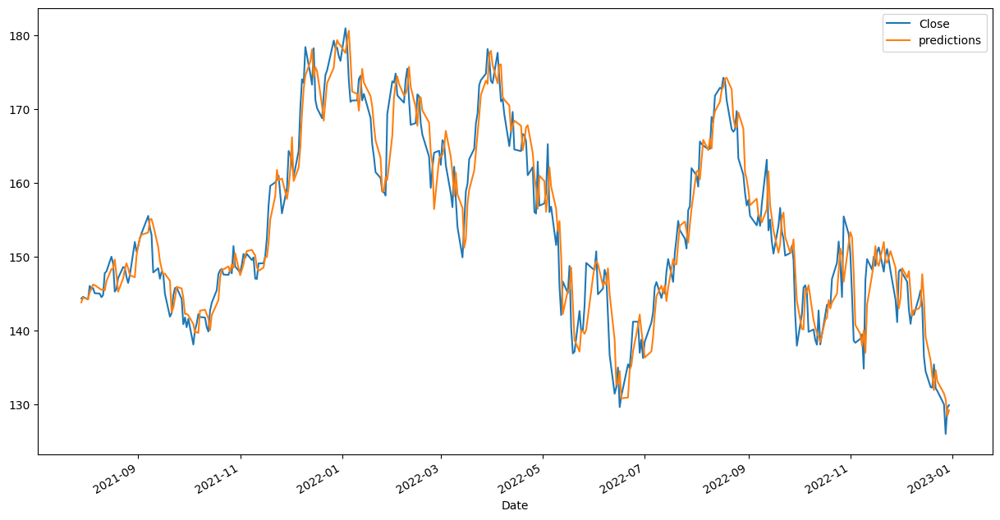

Expirement of:  AMAZON
Test set MAPE: MLPRegressor  2.0859773498098733
Test set RMSE: MLPRegressor  3.759215347655787
Test set MBE: MLPRegressor  0.398312019208624
r^2: 0.9835386987004482 
                Close  predictions
Date                              
2022-12-23  85.250000    84.248454
2022-12-27  83.040001    84.677723
2022-12-28  81.820000    83.855037
2022-12-29  84.180000    82.340029
2022-12-30  84.000000    83.822048


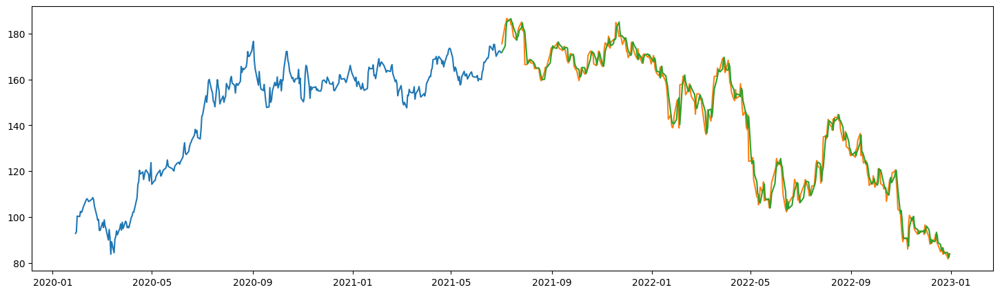

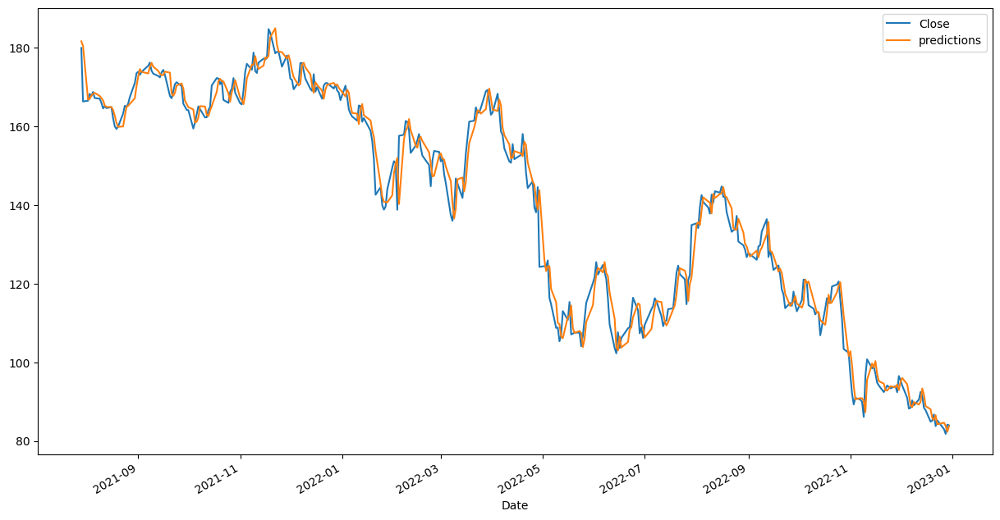

Expirement of:  NETFLIX
Test set MAPE: MLPRegressor  2.489681403965227
Test set RMSE: MLPRegressor  13.180555336745217
Test set MBE: MLPRegressor  0.8621470948670019
r^2: 0.9938792482621233 
                 Close  predictions
Date                               
2022-12-23  294.959991   297.476922
2022-12-27  284.170013   296.059610
2022-12-28  276.880005   285.642869
2022-12-29  291.119995   277.581504
2022-12-30  294.880005   288.868296


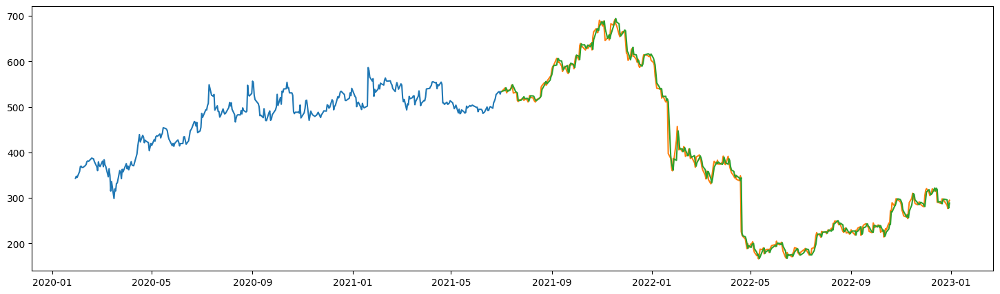

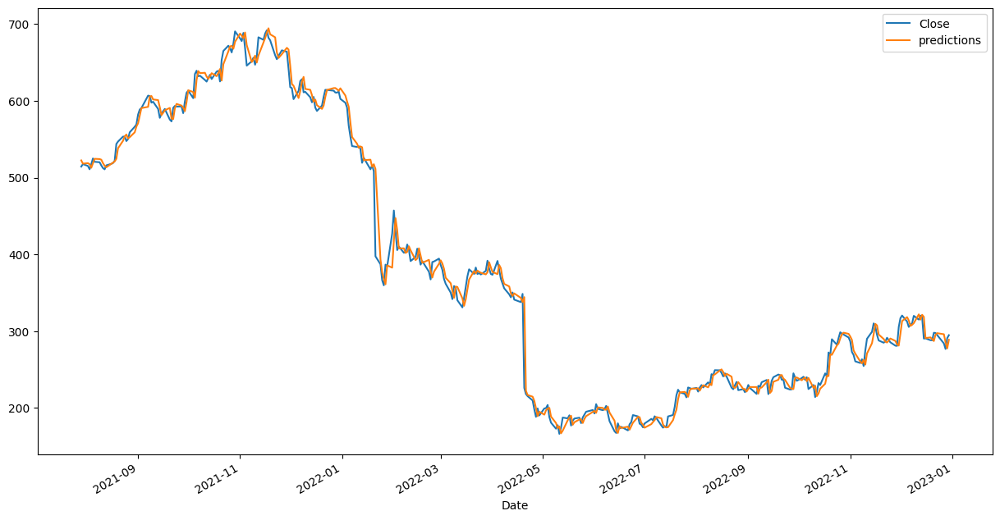

Expirement of:  GOOGLE
Test set MAPE: MLPRegressor  1.7448356969962104
Test set RMSE: MLPRegressor  2.698006785459771
Test set MBE: MLPRegressor  -0.22189586038790893
r^2: 0.9781026308895888 
                Close  predictions
Date                              
2022-12-23  89.809998    88.209348
2022-12-27  87.930000    88.772537
2022-12-28  86.459999    88.446946
2022-12-29  88.949997    87.146296
2022-12-30  88.730003    88.067632


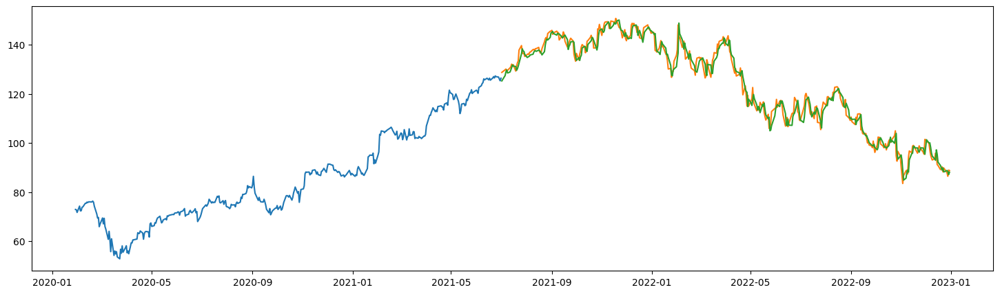

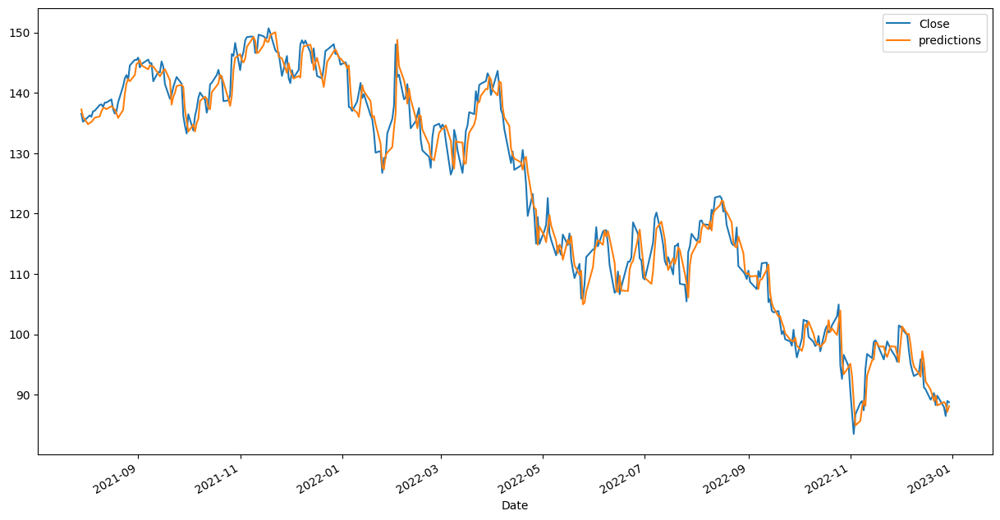

In [250]:
train_test_and_measure("MLPRegressor",MLPRegressor,x_train_meta,x_test_meta,y_train_meta,y_test_meta,'META')
train_test_and_measure("MLPRegressor",MLPRegressor,x_train_aapl,x_test_aapl,y_train_aapl,y_test_aapl,'APPLE')
train_test_and_measure("MLPRegressor",MLPRegressor,x_train_amzn,x_test_amzn,y_train_amzn,y_test_amzn,'AMAZON')
train_test_and_measure("MLPRegressor",MLPRegressor,x_train_nflx,x_test_nflx,y_train_nflx,y_test_nflx,'NETFLIX')
train_test_and_measure("MLPRegressor",MLPRegressor,x_train_goog,x_test_goog,y_train_goog,y_test_goog,'GOOGLE')


###RANDOM FOREST

Expirement of:  META
Test set MAPE: randomForestRegressor_model  3.8822695897464268
Test set RMSE: randomForestRegressor_model  11.14743899184654
Test set MBE: randomForestRegressor_model  0.5876455098332449
r^2: 0.9851450317049056 
                 Close  predictions
Date                               
2022-12-23  118.040001   122.343436
2022-12-27  116.879997   122.343436
2022-12-28  115.620003   122.423699
2022-12-29  120.260002   122.343436
2022-12-30  120.339996   123.196026


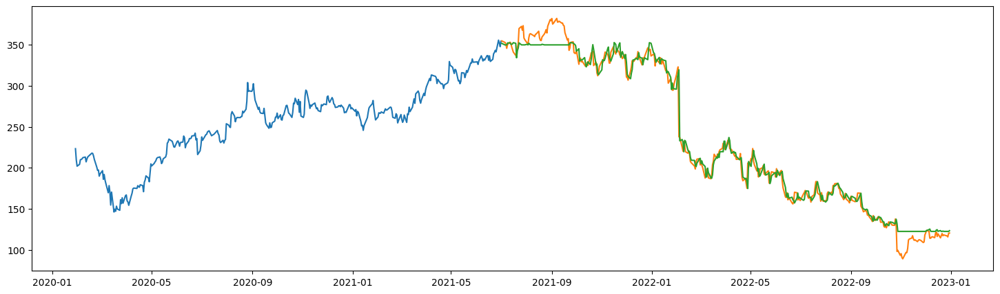

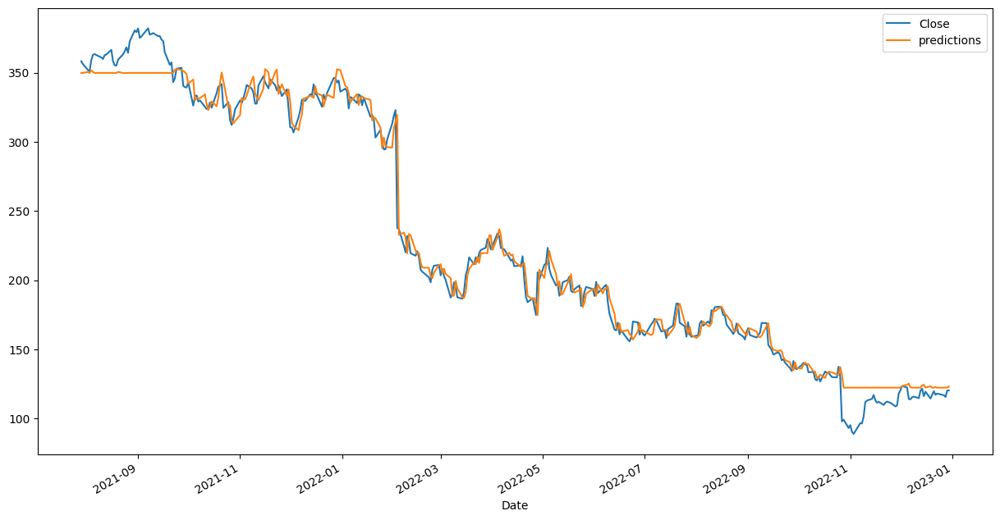

Expirement of:  APPLE
Test set MAPE: randomForestRegressor_model  9.023840045650205
Test set RMSE: randomForestRegressor_model  18.471668419590614
Test set MBE: randomForestRegressor_model  -14.400235335468542
r^2: -1.2738516445262644 
                 Close  predictions
Date                               
2022-12-23  131.860001   131.844081
2022-12-27  130.029999   131.241423
2022-12-28  126.040001   130.992918
2022-12-29  129.610001   127.340948
2022-12-30  129.929993   127.930946


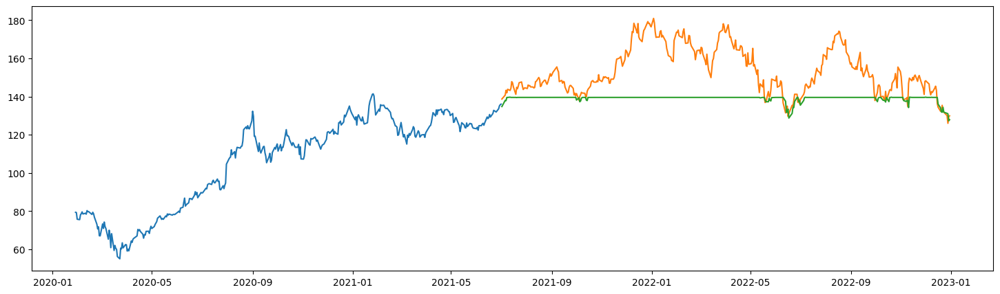

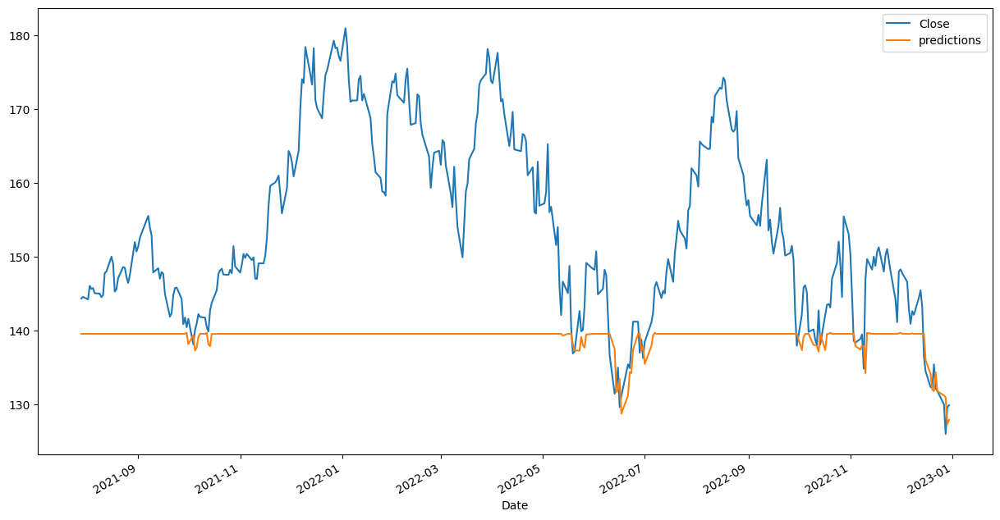

Expirement of:  AMAZON
Test set MAPE: randomForestRegressor_model  2.660043179316697
Test set RMSE: randomForestRegressor_model  5.097537745911644
Test set MBE: randomForestRegressor_model  -0.020788857664018015
r^2: 0.9697315170682881 
                Close  predictions
Date                              
2022-12-23  85.250000    84.509096
2022-12-27  83.040001    84.584445
2022-12-28  81.820000    83.575316
2022-12-29  84.180000    81.771559
2022-12-30  84.000000    84.244699


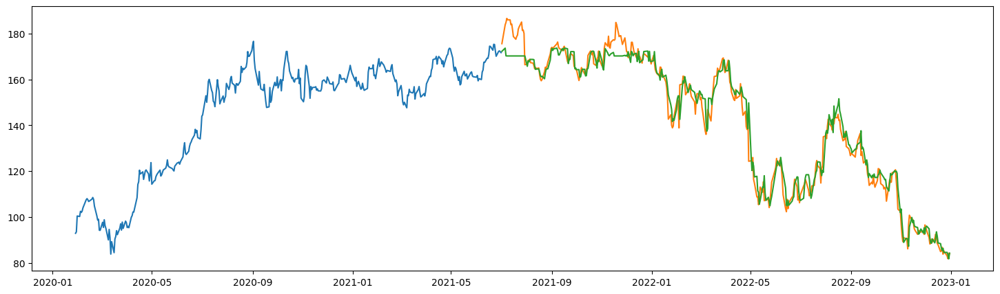

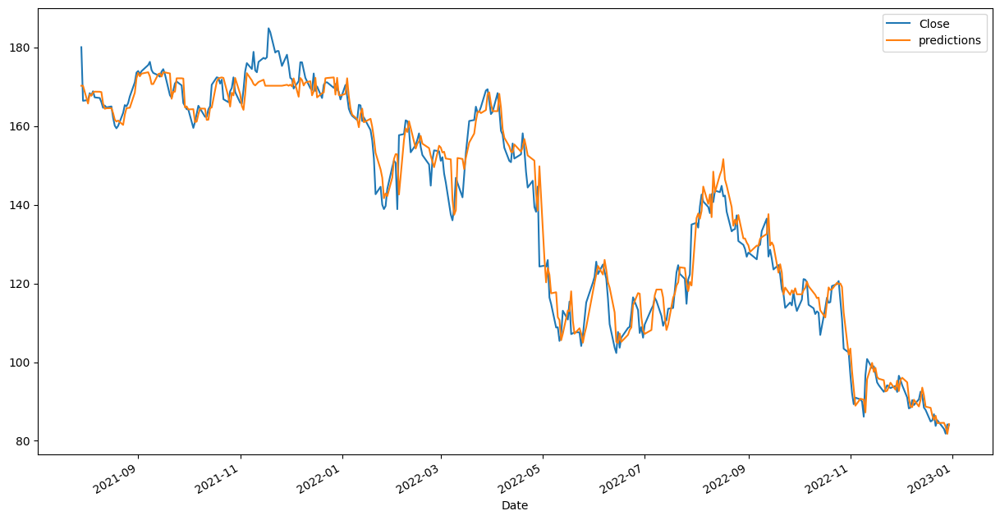

Expirement of:  NETFLIX
Test set MAPE: randomForestRegressor_model  4.757546725683702
Test set RMSE: randomForestRegressor_model  34.60290193490823
Test set MBE: randomForestRegressor_model  -10.638749805892138
r^2: 0.9578145786811334 
                 Close  predictions
Date                               
2022-12-23  294.959991   298.161499
2022-12-27  284.170013   292.388767
2022-12-28  276.880005   286.887418
2022-12-29  291.119995   280.050841
2022-12-30  294.880005   288.585839


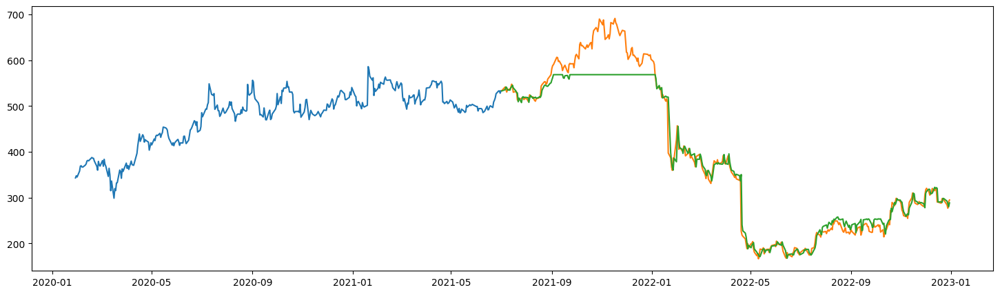

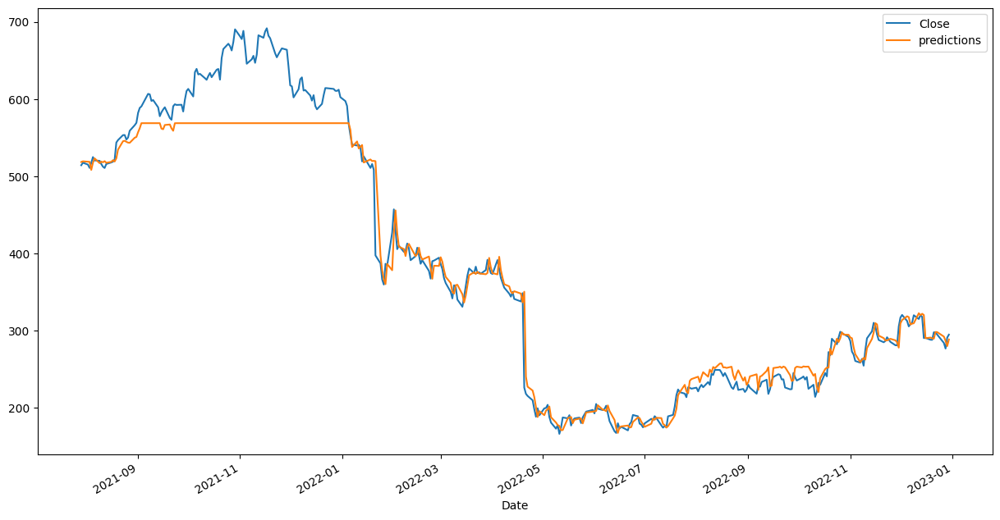

Expirement of:  GOOGLE
Test set MAPE: randomForestRegressor_model  5.871758929409213
Test set RMSE: randomForestRegressor_model  10.39879363968237
Test set MBE: randomForestRegressor_model  -6.096925577171472
r^2: 0.6747091976967149 
                Close  predictions
Date                              
2022-12-23  89.809998    87.965905
2022-12-27  87.930000    89.900244
2022-12-28  86.459999    87.800761
2022-12-29  88.949997    87.522801
2022-12-30  88.730003    88.633385


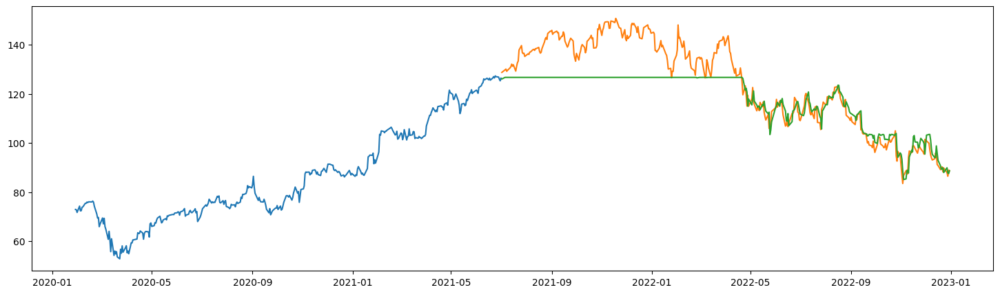

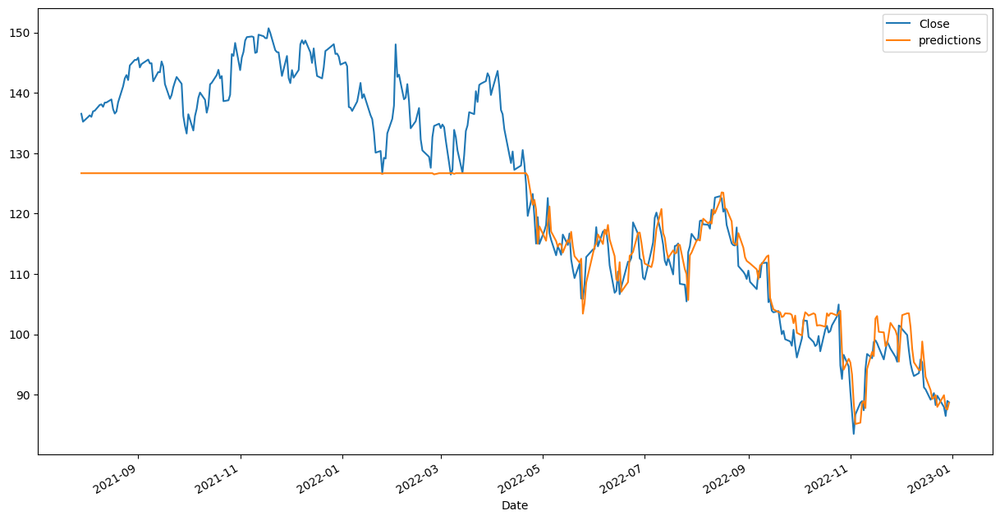

In [ ]:
train_test_and_measure("randomForestRegressor_model",randomForestRegressor_model,x_train_meta,x_test_meta,y_train_meta,y_test_meta,'META')
train_test_and_measure("randomForestRegressor_model",randomForestRegressor_model,x_train_aapl,x_test_aapl,y_train_aapl,y_test_aapl,'APPLE')
train_test_and_measure("randomForestRegressor_model",randomForestRegressor_model,x_train_amzn,x_test_amzn,y_train_amzn,y_test_amzn,'AMAZON')
train_test_and_measure("randomForestRegressor_model",randomForestRegressor_model,x_train_nflx,x_test_nflx,y_train_nflx,y_test_nflx,'NETFLIX')
train_test_and_measure("randomForestRegressor_model",randomForestRegressor_model,x_train_goog,x_test_goog,y_train_goog,y_test_goog,'GOOGLE')

###regression_model

Expirement of:  META
Test set MAPE: regression_model  2.35106539356358
Test set RMSE: regression_model  7.656787229210906
Test set MBE: regression_model  0.8437511320700372
r^2: 0.9929916678157928 
                 Close  predictions
Date                               
2022-12-23  118.040001   116.907510
2022-12-27  116.879997   117.988879
2022-12-28  115.620003   117.235475
2022-12-29  120.260002   116.566664
2022-12-30  120.339996   120.045495


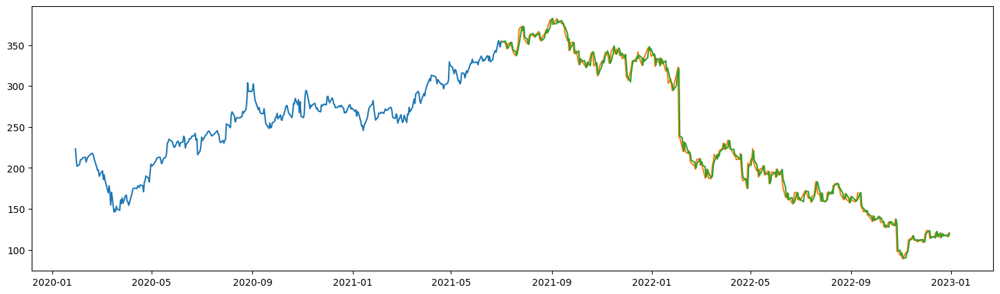

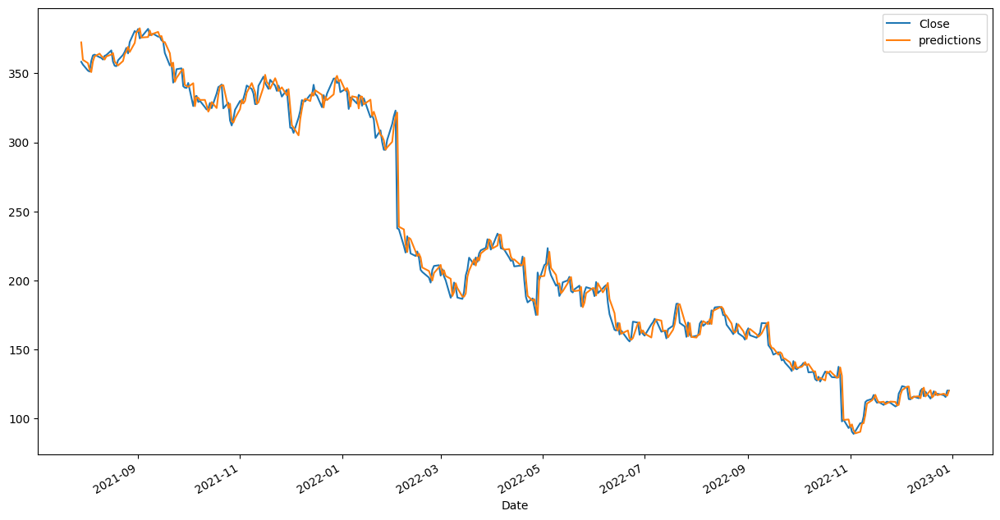

Expirement of:  APPLE
Test set MAPE: regression_model  1.5598936907321923
Test set RMSE: regression_model  3.074022247016224
Test set MBE: regression_model  0.25657582464214773
r^2: 0.9370256214565218 
                 Close  predictions
Date                               
2022-12-23  131.860001   131.484368
2022-12-27  130.029999   131.663933
2022-12-28  126.040001   129.595162
2022-12-29  129.610001   126.908252
2022-12-30  129.929993   130.134455


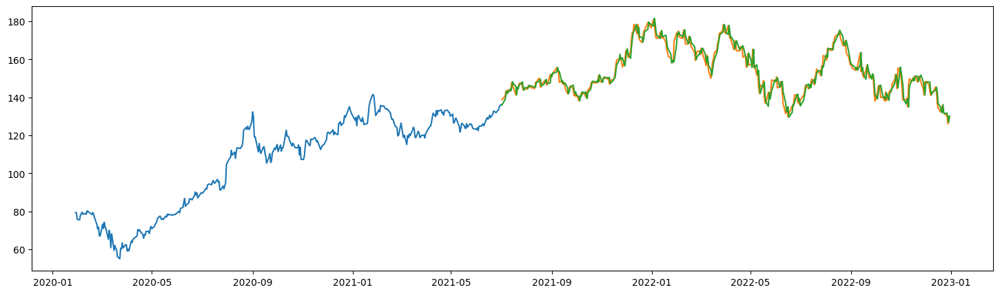

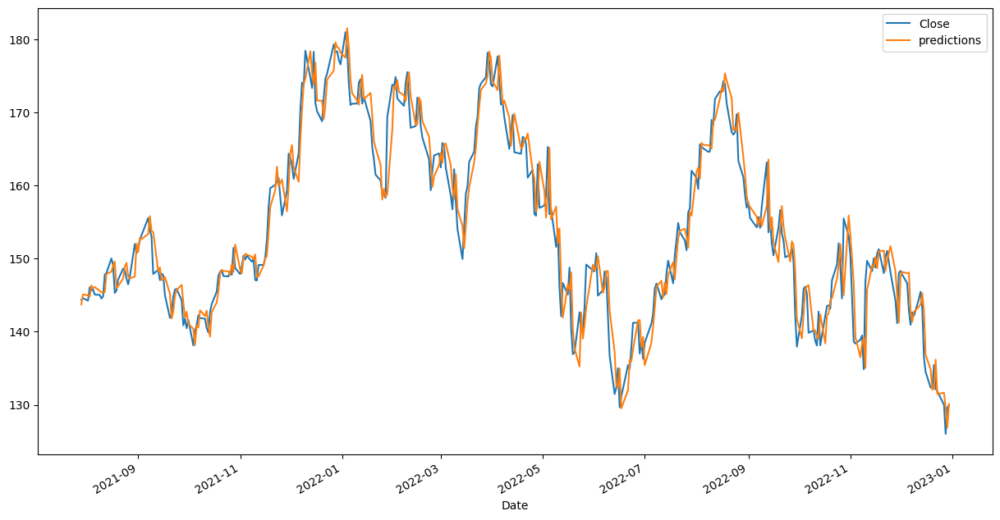

Expirement of:  AMAZON
Test set MAPE: regression_model  1.9563604933470937
Test set RMSE: regression_model  3.587316594260032
Test set MBE: regression_model  0.32134670193049397
r^2: 0.9850097399545144 
                Close  predictions
Date                              
2022-12-23  85.250000    83.384690
2022-12-27  83.040001    85.467000
2022-12-28  81.820000    83.325874
2022-12-29  84.180000    82.198740
2022-12-30  84.000000    84.356462


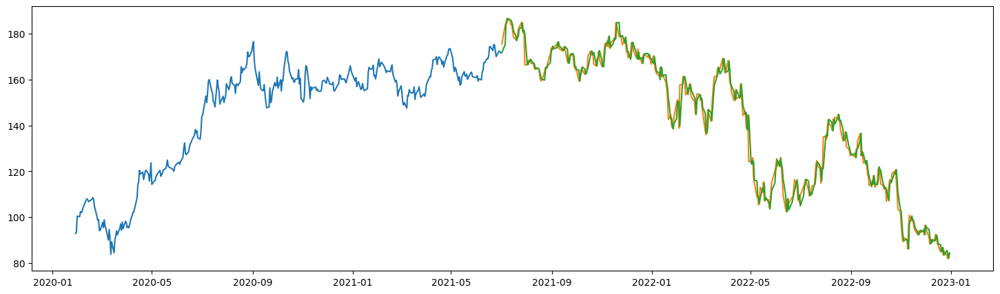

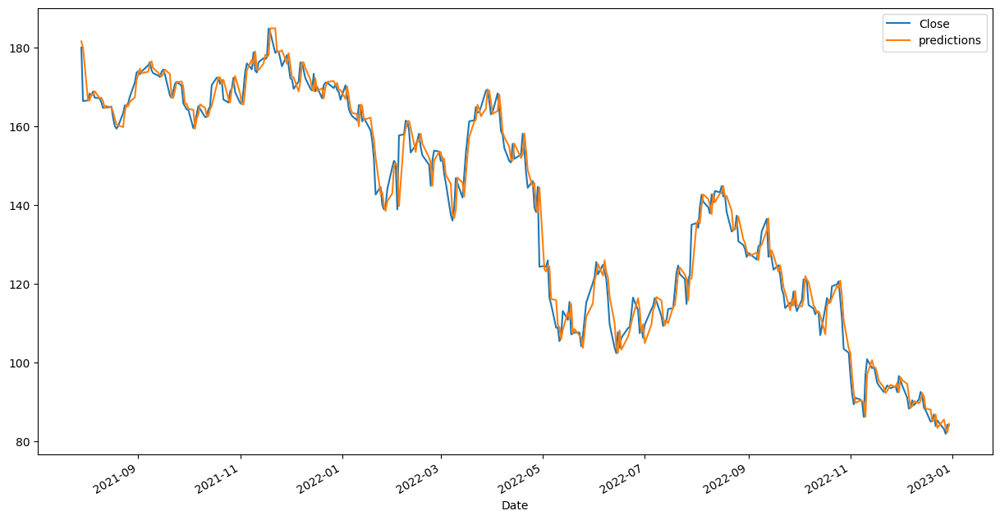

Expirement of:  NETFLIX
Test set MAPE: regression_model  2.4467433559136014
Test set RMSE: regression_model  13.019919555779554
Test set MBE: regression_model  0.8525127739554347
r^2: 0.9940275303864304 
                 Close  predictions
Date                               
2022-12-23  294.959991   296.519595
2022-12-27  284.170013   295.560883
2022-12-28  276.880005   285.059518
2022-12-29  291.119995   277.801078
2022-12-30  294.880005   291.293295


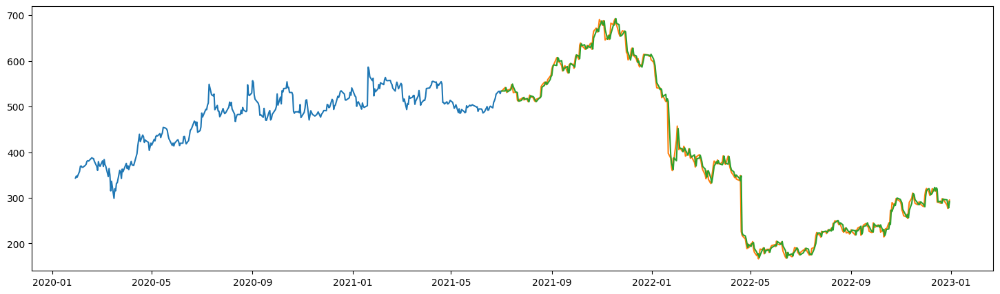

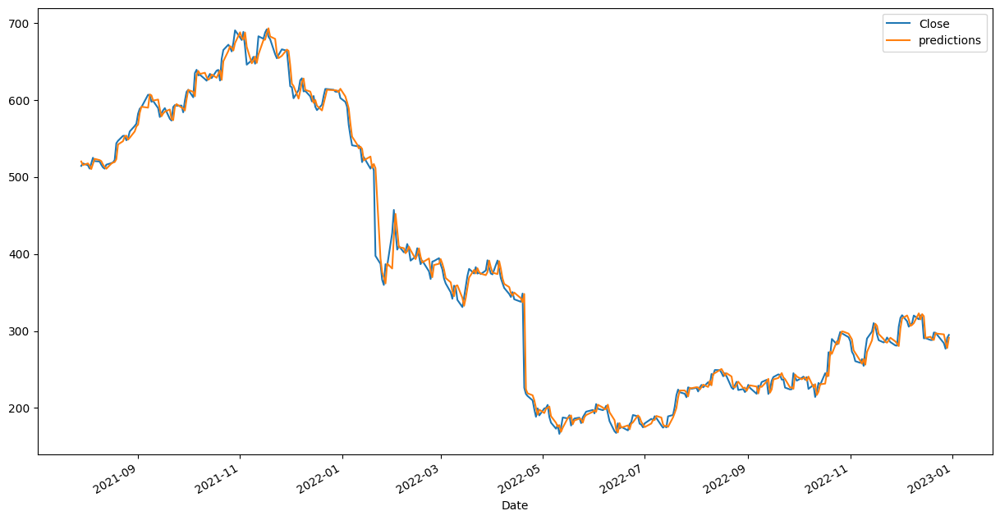

Expirement of:  GOOGLE
Test set MAPE: regression_model  1.6627785649737394
Test set RMSE: regression_model  2.590139970749061
Test set MBE: regression_model  0.316594912606463
r^2: 0.979818551605177 
                Close  predictions
Date                              
2022-12-23  89.809998    88.000765
2022-12-27  87.930000    89.697873
2022-12-28  86.459999    88.199642
2022-12-29  88.949997    87.198866
2022-12-30  88.730003    88.923187


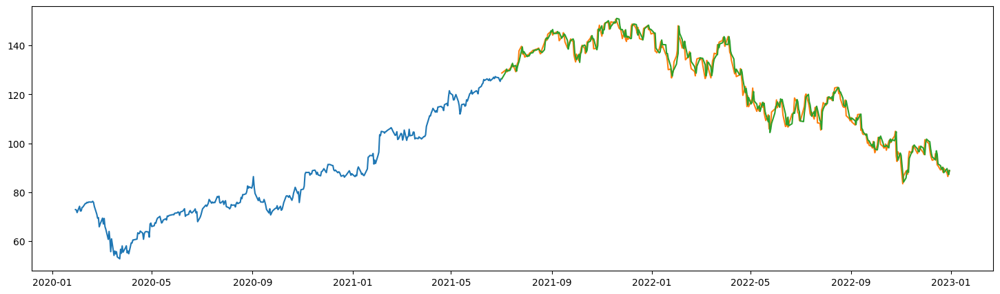

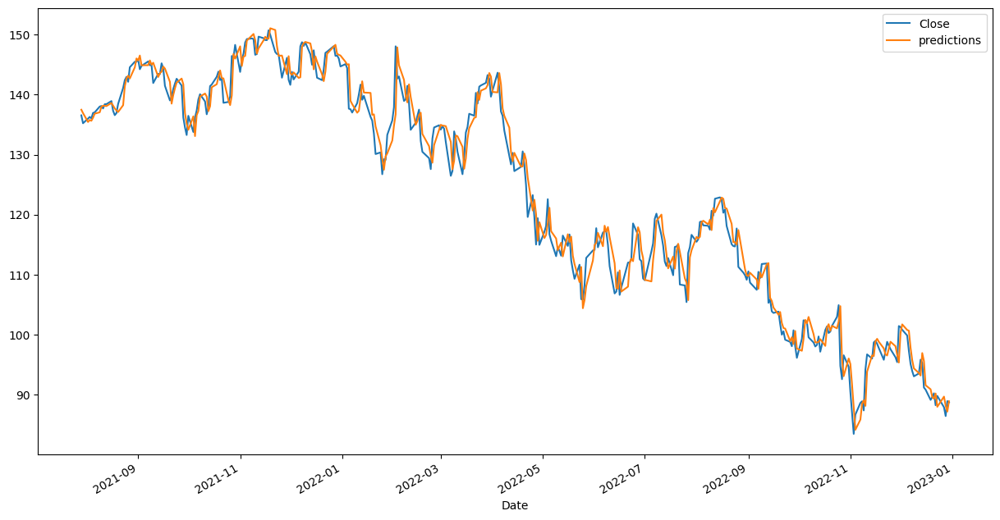

In [ ]:
train_test_and_measure("regression_model",regression_model,x_train_meta,x_test_meta,y_train_meta,y_test_meta,'META')
train_test_and_measure("regression_model",regression_model,x_train_aapl,x_test_aapl,y_train_aapl,y_test_aapl,'APPLE')
train_test_and_measure("regression_model",regression_model,x_train_amzn,x_test_amzn,y_train_amzn,y_test_amzn,'AMAZON')
train_test_and_measure("regression_model",regression_model,x_train_nflx,x_test_nflx,y_train_nflx,y_test_nflx,'NETFLIX')
train_test_and_measure("regression_model",regression_model,x_train_goog,x_test_goog,y_train_goog,y_test_goog,'GOOGLE')

###SVR

Expirement of:  META
Test set MAPE: SVR_model  14.31424725677105
Test set RMSE: SVR_model  51.43927021228668
Test set MBE: SVR_model  -20.963420147893476
r^2: 0.6836913142036489 
                 Close  predictions
Date                               
2022-12-23  118.040001   148.122335
2022-12-27  116.879997   147.911264
2022-12-28  115.620003   147.799685
2022-12-29  120.260002   148.654485
2022-12-30  120.339996   146.786387


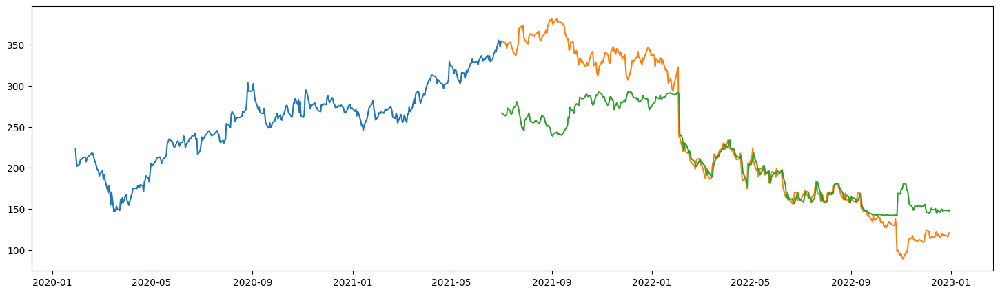

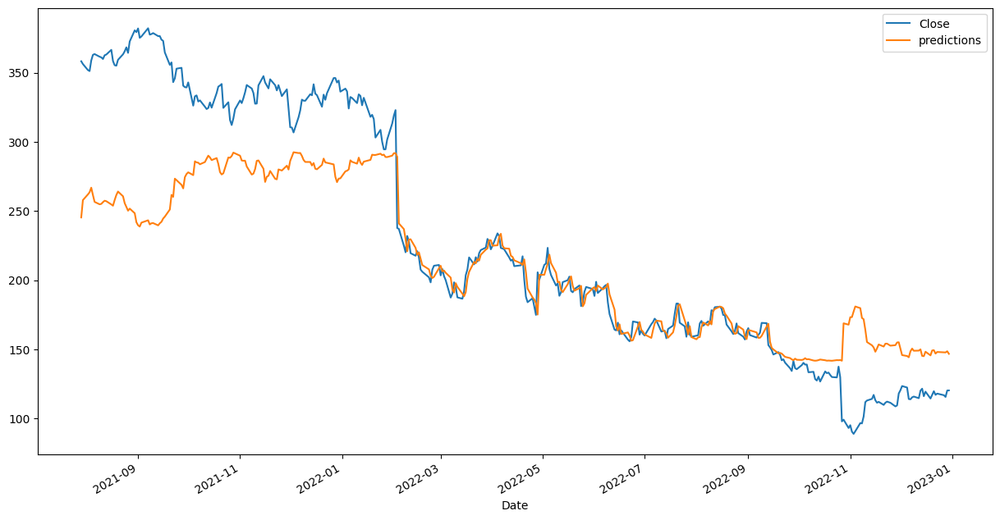

Expirement of:  APPLE
Test set MAPE: SVR_model  25.00650851491485
Test set RMSE: SVR_model  46.91919235456798
Test set MBE: SVR_model  -40.01109832888046
r^2: -13.670703282594532 
                 Close  predictions
Date                               
2022-12-23  131.860001   128.077234
2022-12-27  130.029999   127.908622
2022-12-28  126.040001   127.586279
2022-12-29  129.610001   126.364119
2022-12-30  129.929993   127.183778


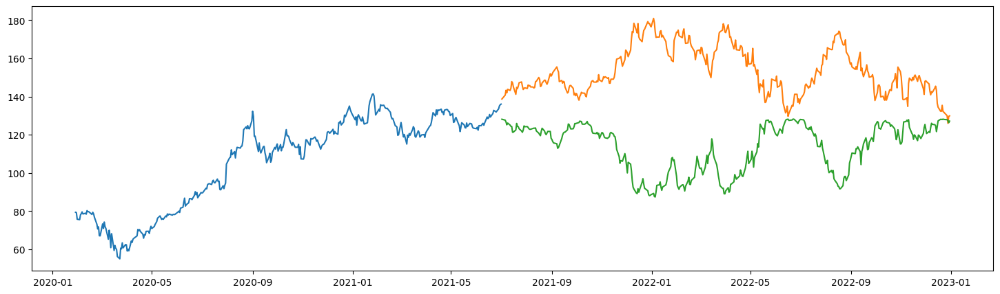

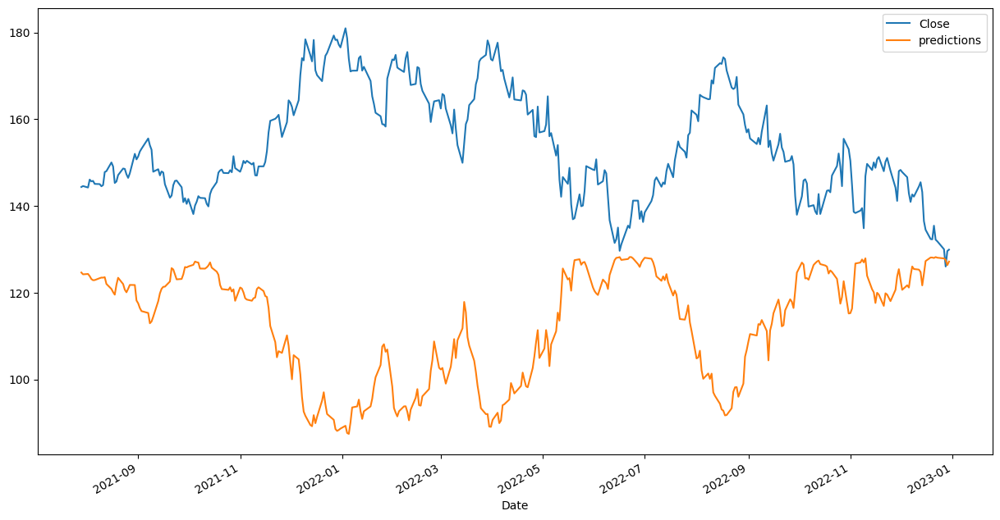

Expirement of:  AMAZON
Test set MAPE: SVR_model  3.817433014366794
Test set RMSE: SVR_model  8.527910875019513
Test set MBE: SVR_model  -3.2776037997630745
r^2: 0.9152860251438646 
                Close  predictions
Date                              
2022-12-23  85.250000    84.672754
2022-12-27  83.040001    85.075851
2022-12-28  81.820000    84.342506
2022-12-29  84.180000    82.872649
2022-12-30  84.000000    84.255319


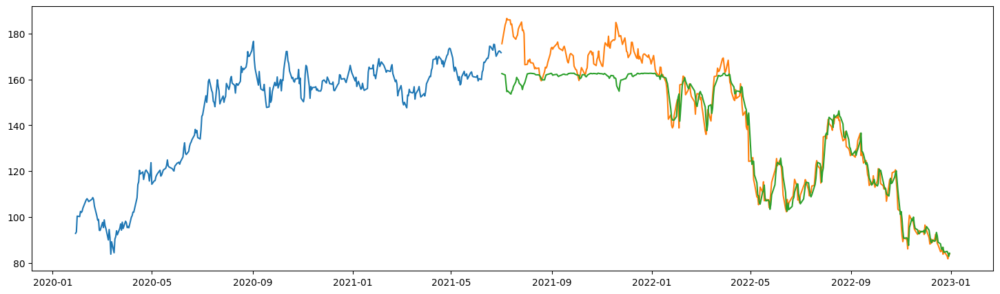

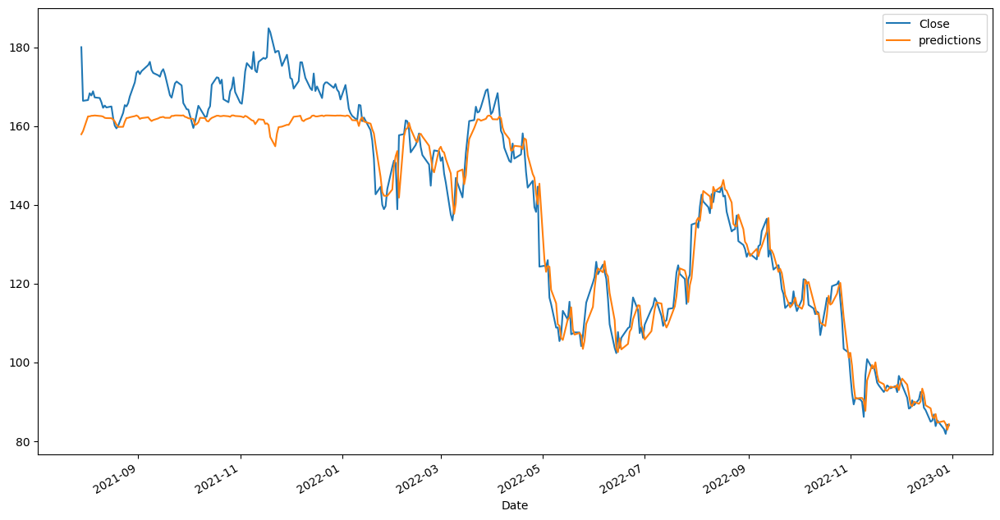

Expirement of:  NETFLIX
Test set MAPE: SVR_model  10.564377461310478
Test set RMSE: SVR_model  105.7332822605457
Test set MBE: SVR_model  -52.17414587145108
r^2: 0.6061228604568585 
                 Close  predictions
Date                               
2022-12-23  294.959991   299.287187
2022-12-27  284.170013   297.915443
2022-12-28  276.880005   289.959069
2022-12-29  291.119995   281.154077
2022-12-30  294.880005   291.171505


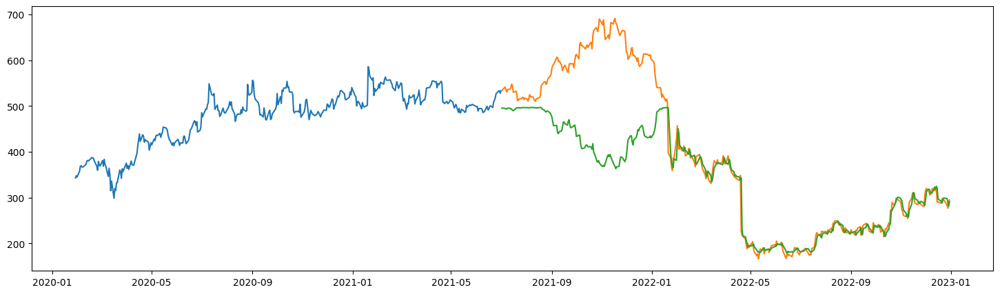

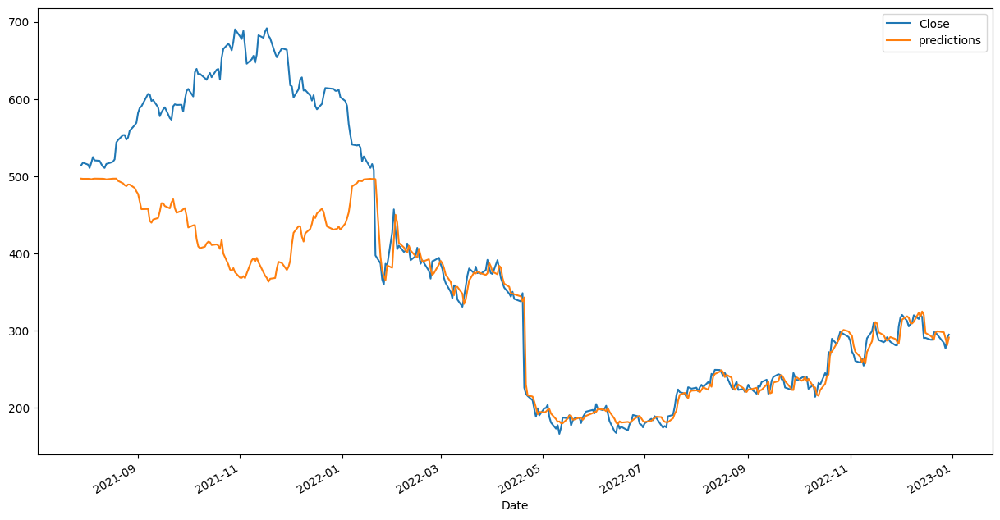

Expirement of:  GOOGLE
Test set MAPE: SVR_model  16.41712245642645
Test set RMSE: SVR_model  31.530477433438307
Test set MBE: SVR_model  -21.885170638498725
r^2: -1.9906594185216875 
                Close  predictions
Date                              
2022-12-23  89.809998    88.265644
2022-12-27  87.930000    88.962966
2022-12-28  86.459999    88.357813
2022-12-29  88.949997    87.079234
2022-12-30  88.730003    88.277919


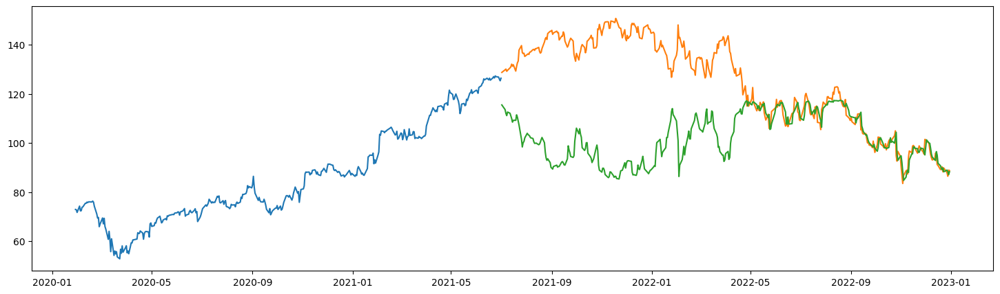

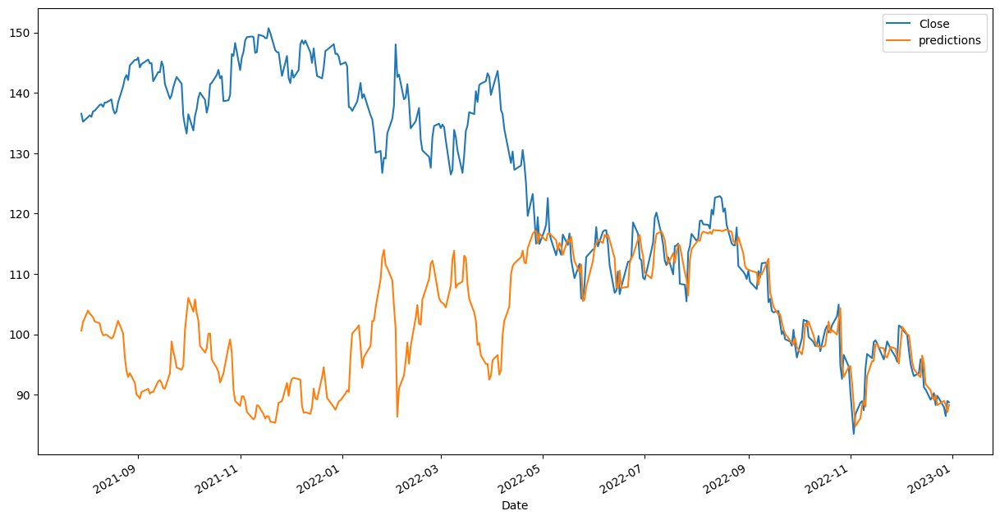

In [251]:
# train_test_and_measure("SVR_model",svr)

train_test_and_measure("SVR_model",svr,x_train_meta,x_test_meta,y_train_meta,y_test_meta,'META')
train_test_and_measure("SVR_model",svr,x_train_aapl,x_test_aapl,y_train_aapl,y_test_aapl,'APPLE')
train_test_and_measure("SVR_model",svr,x_train_amzn,x_test_amzn,y_train_amzn,y_test_amzn,'AMAZON')
train_test_and_measure("SVR_model",svr,x_train_nflx,x_test_nflx,y_train_nflx,y_test_nflx,'NETFLIX')
train_test_and_measure("SVR_model",svr,x_train_goog,x_test_goog,y_train_goog,y_test_goog,'GOOGLE')

###Grad Boost

Expirement of:  META
Test set MAPE: gradientReg_model  3.754357432760486
Test set RMSE: gradientReg_model  11.111680248395123
Test set MBE: gradientReg_model  0.3351336064084985
r^2: 0.9852401823520167 
                 Close  predictions
Date                               
2022-12-23  118.040001   120.544928
2022-12-27  116.879997   120.575077
2022-12-28  115.620003   120.544928
2022-12-29  120.260002   120.346929
2022-12-30  120.339996   122.061450


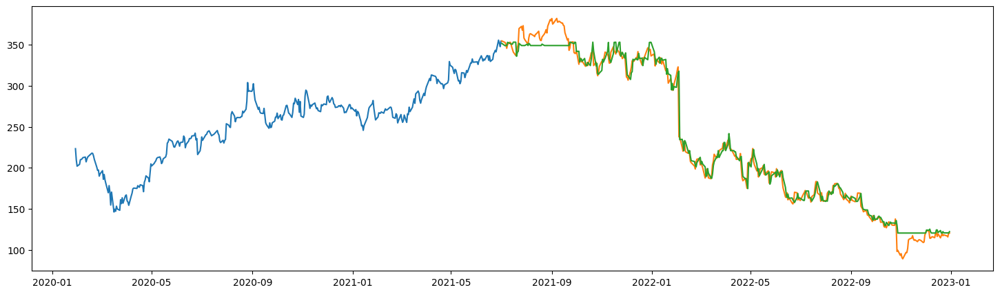

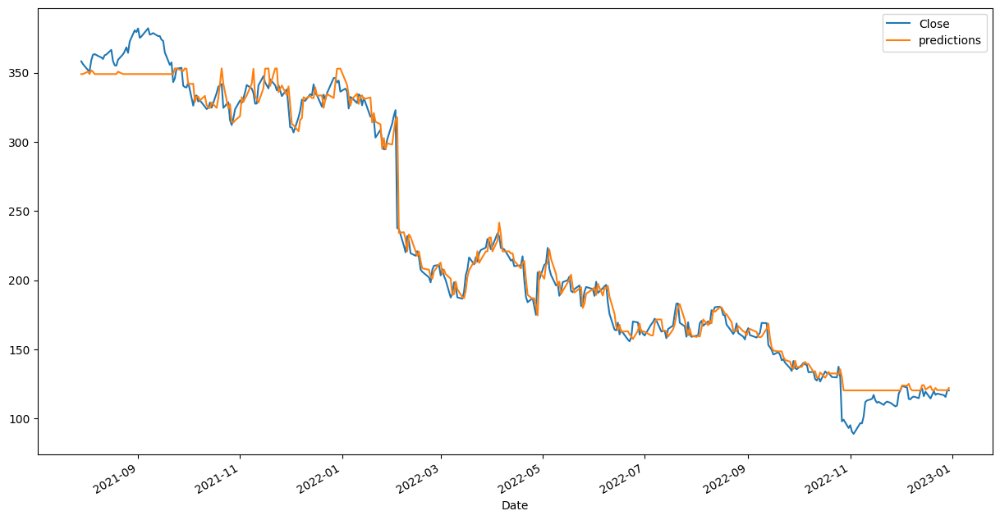

Expirement of:  APPLE
Test set MAPE: gradientReg_model  9.057464510528803
Test set RMSE: gradientReg_model  18.482381266408918
Test set MBE: gradientReg_model  -14.474279981912582
r^2: -1.2764898997785359 
                 Close  predictions
Date                               
2022-12-23  131.860001   131.951050
2022-12-27  130.029999   131.269359
2022-12-28  126.040001   130.319347
2022-12-29  129.610001   126.800678
2022-12-30  129.929993   128.484533


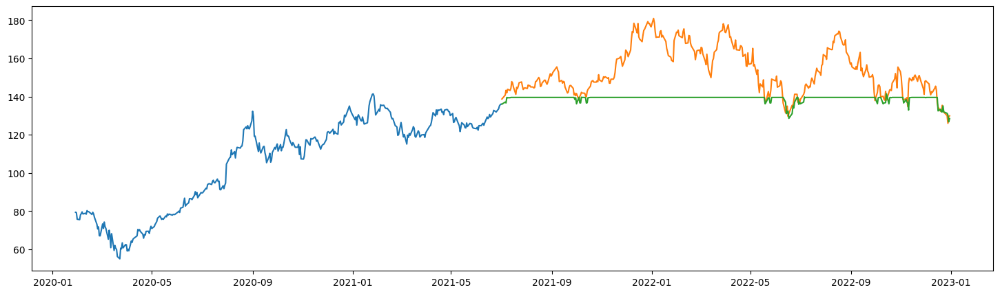

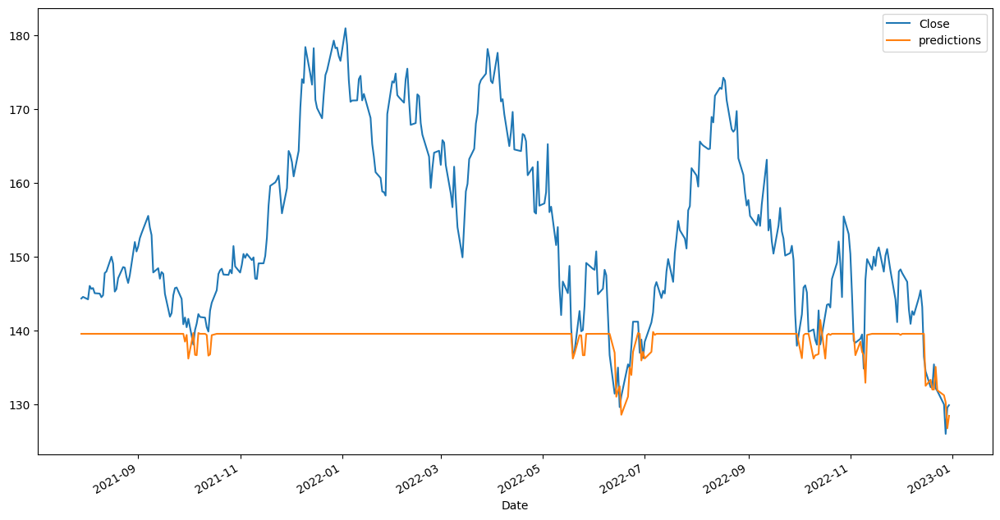

Expirement of:  AMAZON
Test set MAPE: gradientReg_model  2.691132711703295
Test set RMSE: gradientReg_model  5.257713119389246
Test set MBE: gradientReg_model  -0.03350816223709905
r^2: 0.967799432535801 
                Close  predictions
Date                              
2022-12-23  85.250000    84.950214
2022-12-27  83.040001    84.950214
2022-12-28  81.820000    83.648059
2022-12-29  84.180000    82.167250
2022-12-30  84.000000    84.578215


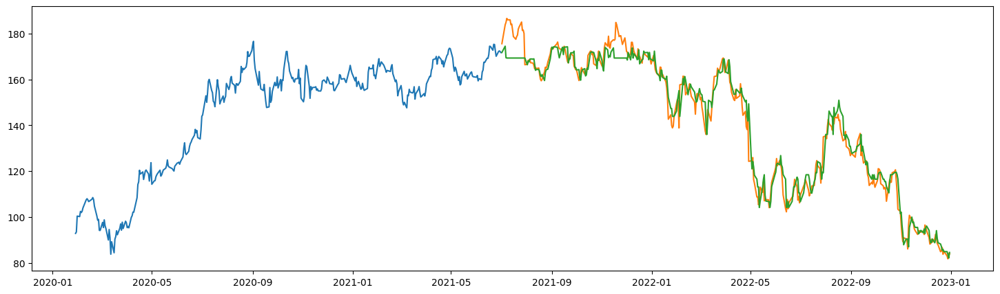

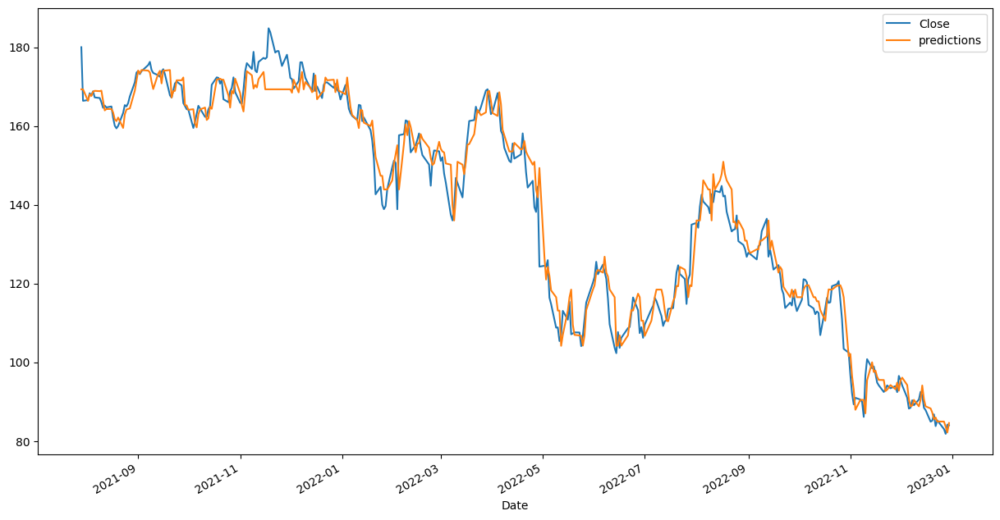

Expirement of:  NETFLIX
Test set MAPE: gradientReg_model  4.418425043022474
Test set RMSE: gradientReg_model  32.26909439305058
Test set MBE: gradientReg_model  -9.724769910078132
r^2: 0.9633131096359119 
                 Close  predictions
Date                               
2022-12-23  294.959991   298.744151
2022-12-27  284.170013   291.822065
2022-12-28  276.880005   286.356248
2022-12-29  291.119995   279.993393
2022-12-30  294.880005   290.816087


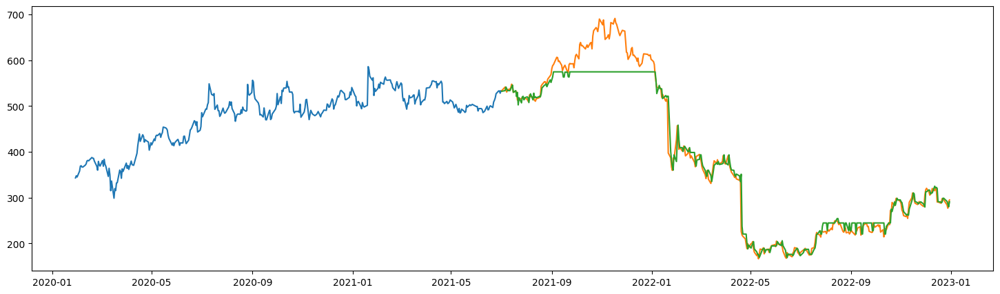

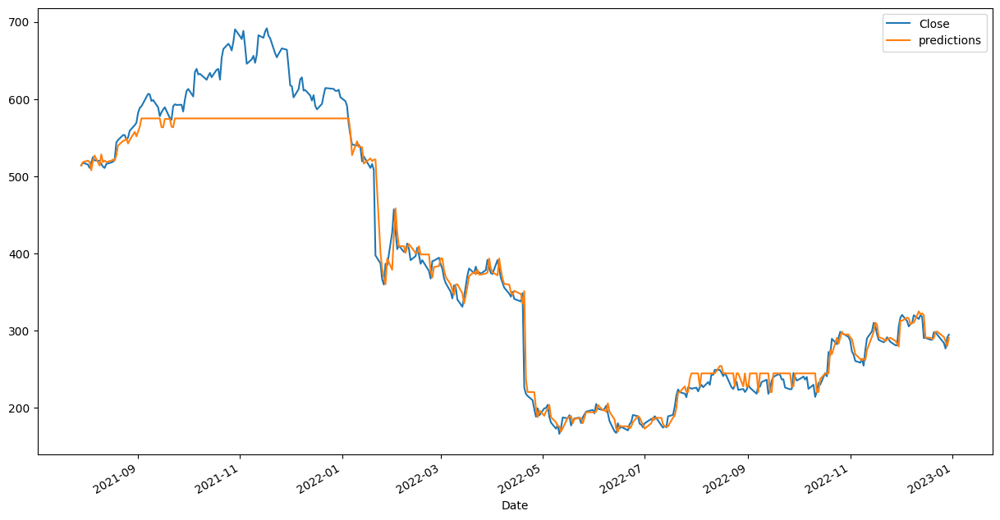

Expirement of:  GOOGLE
Test set MAPE: gradientReg_model  5.891127108977302
Test set RMSE: gradientReg_model  10.367412273742227
Test set MBE: gradientReg_model  -5.956751419956792
r^2: 0.6766695533219063 
                Close  predictions
Date                              
2022-12-23  89.809998    87.903087
2022-12-27  87.930000    90.200372
2022-12-28  86.459999    87.599980
2022-12-29  88.949997    87.196424
2022-12-30  88.730003    88.733701


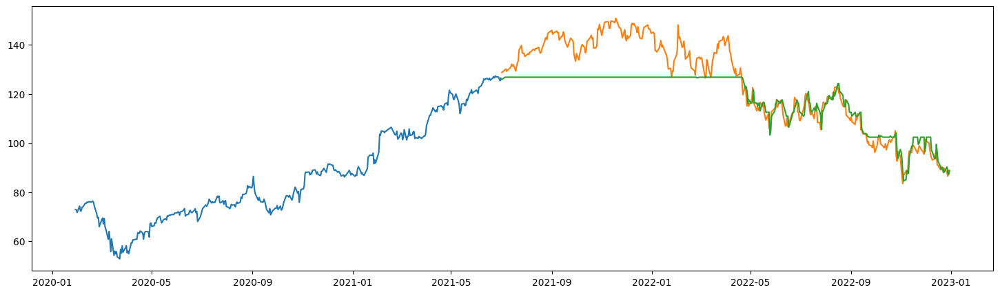

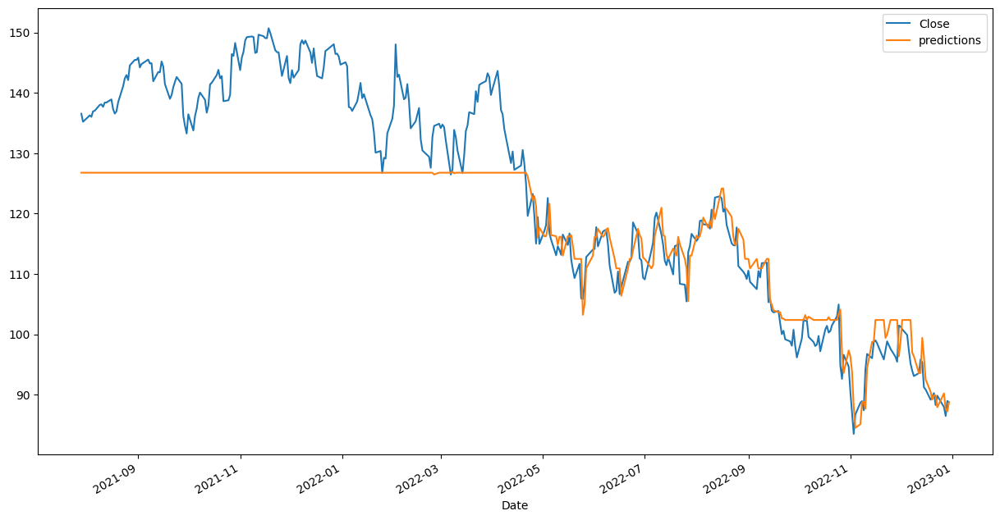

In [252]:
# train_test_and_measure("gradientReg_model",gradientReg)
train_test_and_measure("gradientReg_model",gradientReg,x_train_meta,x_test_meta,y_train_meta,y_test_meta,'META')
train_test_and_measure("gradientReg_model",gradientReg,x_train_aapl,x_test_aapl,y_train_aapl,y_test_aapl,'APPLE')
train_test_and_measure("gradientReg_model",gradientReg,x_train_amzn,x_test_amzn,y_train_amzn,y_test_amzn,'AMAZON')
train_test_and_measure("gradientReg_model",gradientReg,x_train_nflx,x_test_nflx,y_train_nflx,y_test_nflx,'NETFLIX')
train_test_and_measure("gradientReg_model",gradientReg,x_train_goog,x_test_goog,y_train_goog,y_test_goog,'GOOGLE')

###RANDOM FOREST



# Predictions Using Bi-LSTMs
LSTM stands for **Long Short Term Memory**. It is a type of ***Recurrent Neural Network*** that is capable of learning long-term dependencies, especially in sequence prediction problems. LSTMs have **feedback connections** which make them different to more traditional feedforward neural networks. This property enables LSTMs to process entire sequences of data (e.g. time series) without treating each point in the sequence independently, but rather, retaining useful information about previous data in the sequence to help with the processing of new data points.

The output of an LSTM at a particular point in time is dependant on 3 things:
> - The current long-term memory of the network, known as the **cell state**
> - The output at the previous point in time, known as the **previous hidden state**
> - The **input data** at the current time step

LSTMs use a series of **gates** which control how the information in a sequence of data comes into, is stored in and leaves the network. There are 3 gates in a typical LSTM:
> - Forget Gate 
> - Input Gate
> - Output Gate

These gates can be thought of as filters and are each their own neural network. This is what the visual representation of an LSTM looks like:

<img src = "http://bit.ly/2i3kb1w" width = 50%>
<br>

## Bi-Directional LSTMs
These are like upgraded LSTMs. In **Bi-directional LSTMs**, our input flows in ***two directions***, making it different from the regular LSTM. With the regular LSTM, we can make input flow in one direction, either backwards or forward. However, in bi-directional, we can make the input flow in both directions to preserve both the future and the past information. This is what a Bi-directional LSTM looks like:

<img src = "https://149695847.v2.pressablecdn.com/wp-content/uploads/2021/07/image-5.jpeg" width = 50%>

In [ ]:
def retrieve_closing_prices_only(data):
    data = data[['Close']]
    return data

def min_max_scaling(data):
    scaler = MinMaxScaler(feature_range = (0, 1))
    data = scaler.fit_transform(data.values)
    return scaler, data
    
meta_scaler, new_meta_df = min_max_scaling(retrieve_closing_prices_only(new_meta_df))
aapl_scaler, new_aapl_df = min_max_scaling(retrieve_closing_prices_only(new_aapl_df))
amzn_scaler, new_amzn_df = min_max_scaling(retrieve_closing_prices_only(new_amzn_df))
nflx_scaler, new_nflx_df = min_max_scaling(retrieve_closing_prices_only(new_nflx_df))
goog_scaler, new_goog_df = min_max_scaling(retrieve_closing_prices_only(new_goog_df))

new_meta_df

array([[0.05624914],
       [0.04472493],
       [0.03641103],
       ...,
       [0.37149128],
       [0.46930994],
       [0.46316368]])

In [ ]:
def split_and_reshape_data(dataframe, pred_days, company):
    prediction_days = pred_days
    
    train_size = int(np.ceil(len(dataframe) * 0.95))
    test_size = len(dataframe) - train_size
    print(f'The training size for {company.title()} is {train_size} rows')
    print(f'The testing size for {company.title()} is {test_size} rows')
    
    train_data = dataframe[0: int(train_size), :]
    test_data = dataframe[train_size - prediction_days:, :]
    
    X_train, y_train, X_test, y_test = [], [], [], []
    
    for i in range(prediction_days, len(train_data)):
        X_train.append(train_data[i - prediction_days: i, 0])
        y_train.append(train_data[i, 0])
        
    for i in range(prediction_days, len(test_data)):
        X_test.append(test_data[i - prediction_days: i, 0])
        y_test.append(test_data[i, 0])
        
    X_train, y_train, X_test, y_test = np.array(X_train), np.array(y_train), np.array(X_test), np.array(y_test)
    X_train = np.reshape(X_train, (X_train.shape[0], X_train.shape[1], 1))
    X_test = np.reshape(X_test, (X_test.shape[0], X_test.shape[1], 1))
    
        
    print('Data for {} split successfully'.format(company.title()))
    
    return X_train, y_train, X_test, y_test
    
X_train_meta, y_train_meta, X_test_meta, y_test_meta = split_and_reshape_data(new_meta_df, 30, 'META')
X_train_aapl, y_train_aapl, X_test_aapl, y_test_aapl = split_and_reshape_data(new_aapl_df, 30, 'APPLE')
X_train_amzn, y_train_amzn, X_test_amzn, y_test_amzn = split_and_reshape_data(new_amzn_df, 30, 'AMAZON')
X_train_nflx, y_train_nflx, X_test_nflx, y_test_nflx = split_and_reshape_data(new_nflx_df, 30, 'NETFLIX')
X_train_goog, y_train_goog, X_test_goog, y_test_goog = split_and_reshape_data(new_goog_df, 30, 'GOOGLE')

The training size for Meta is 2562 rows
The testing size for Meta is 134 rows
Data for Meta split successfully
The training size for Apple is 10095 rows
The testing size for Apple is 531 rows
Data for Apple split successfully
The training size for Amazon is 6151 rows
The testing size for Amazon is 323 rows
Data for Amazon split successfully
The training size for Netflix is 4952 rows
The testing size for Netflix is 260 rows
Data for Netflix split successfully
The training size for Google is 4416 rows
The testing size for Google is 232 rows
Data for Google split successfully


In [ ]:
def create_and_train_bilstm_model(X_train, y_train, X_test, y_test, company):
    
    print('=========For {}========='.format(company))
    
    model = Sequential([
    Conv1D(32, 3, strides = 1, activation = 'relu', input_shape = [30, 1]),
    Bidirectional(LSTM(64, return_sequences = True)),
    Bidirectional(LSTM(64, return_sequences = True)),
    Bidirectional(LSTM(64)),
    Dense(32, activation = 'relu'),
    Dense(1)
    ])
    
    model.compile(optimizer = Adam(), loss = Huber(), metrics = ['mse', 'mae'])
    
    predictor = model.fit(X_train, y_train, validation_data = (X_test, y_test), epochs = 50)
    
    y_pred = model.predict(X_test)
    
    return model, predictor, y_pred

meta_model, meta_predictor, meta_y_pred = create_and_train_bilstm_model(X_train_meta, y_train_meta, X_test_meta, y_test_meta, 'Meta')
aapl_model, aapl_predictor, aapl_y_pred = create_and_train_bilstm_model(X_train_aapl, y_train_aapl, X_test_aapl, y_test_aapl, 'Apple')
amzn_model, amzn_predictor, amzn_y_pred = create_and_train_bilstm_model(X_train_amzn, y_train_amzn, X_test_amzn, y_test_amzn, 'Amazon')
nflx_model, nflx_predictor, nflx_y_pred = create_and_train_bilstm_model(X_train_nflx, y_train_nflx, X_test_nflx, y_test_nflx, 'Netflix')
goog_model, goog_predictor, goog_y_pred = create_and_train_bilstm_model(X_train_goog, y_train_goog, X_test_goog, y_test_goog, 'Google')

In [ ]:
meta_model.save('meta_Bi_Lstm.h5')
aapl_model.save('aapl_Bi_Lstm.h5')
amzn_model.save('amzn_Bi_Lstm.h5')
nflx_model.save('nflx_Bi_Lstm.h5')
goog_model.save('goog_Bi_Lstm.h5')

In [ ]:
from tensorflow import keras
model = keras.models.load_model('/content/drive/MyDrive/Bi_lstm_models/aapl_Bi_Lstm.h5')

In [ ]:
!mkdir Bi_lstm_models

In [ ]:
!mv *.h5 Bi_lstm_models

In [ ]:
!mv Bi_lstm_models drive/MyDrive

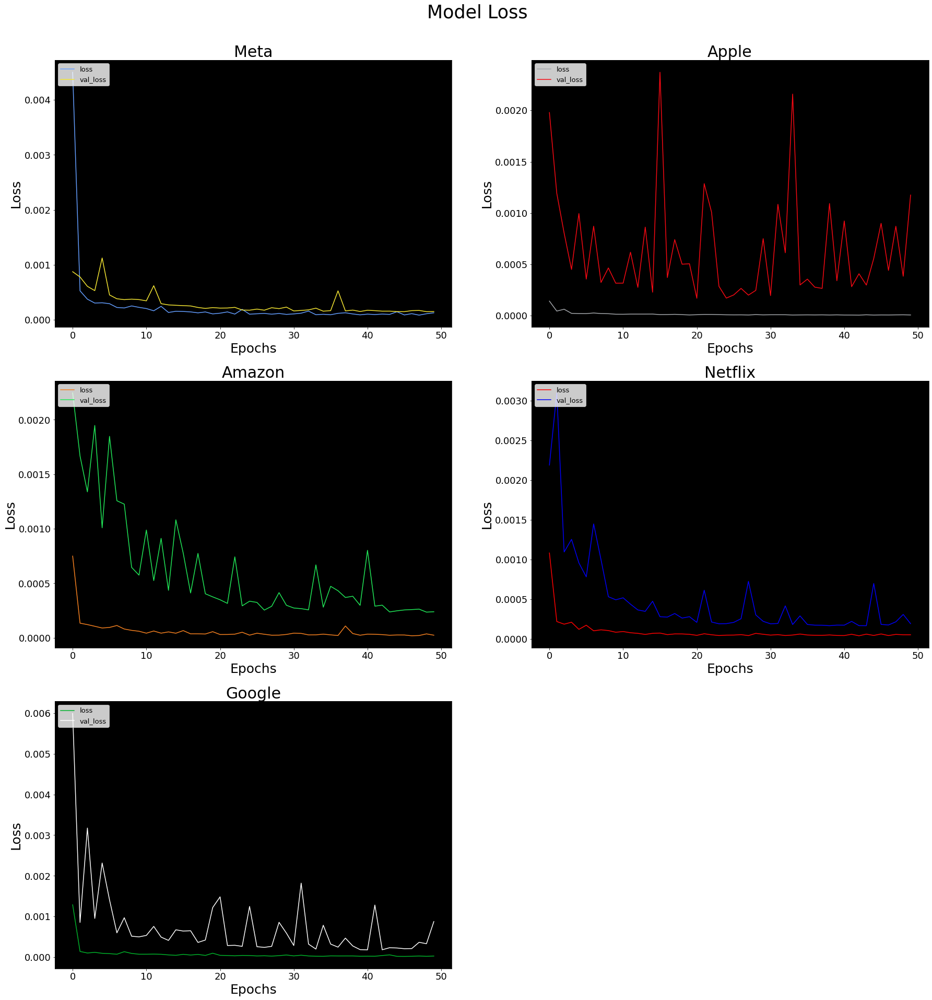

In [ ]:
def visualize_model_loss(meta_predictor, aapl_predictor, amzn_predictor, nflx_predictor, goog_predictor):
    fig, axes = plt.subplots(3, 2, figsize = (30, 30))
    axes[2][1].set_visible(False)
    
    plt.suptitle('Model Loss', verticalalignment = 'top', horizontalalignment = 'center', fontsize = 35)

    axes[0][0].set_facecolor('black')
    axes[0][0].plot(meta_predictor.epoch, meta_predictor.history['loss'], label = 'loss', color = '#649EFF')
    axes[0][0].plot(meta_predictor.epoch, meta_predictor.history['val_loss'], label = 'val_loss', color = '#F5E633')
    axes[0][0].set_title('Meta', fontsize = 30)
    axes[0][0].set_xlabel('Epochs', fontsize = 25)
    axes[0][0].set_ylabel('Loss', fontsize = 25)
    axes[0][0].xaxis.set_tick_params(labelsize = 18)
    axes[0][0].yaxis.set_tick_params(labelsize = 18)
    axes[0][0].legend(loc = 'upper left', fontsize = 13)
    
    axes[0][1].set_facecolor('black')
    axes[0][1].plot(aapl_predictor.epoch, aapl_predictor.history['loss'], label = 'loss', color = '#A4A7AB')
    axes[0][1].plot(aapl_predictor.epoch, aapl_predictor.history['val_loss'], label = 'val_loss', color = '#F70913')
    axes[0][1].set_title('Apple', fontsize = 30)
    axes[0][1].set_xlabel('Epochs', fontsize = 25)
    axes[0][1].set_ylabel('Loss', fontsize = 25)
    axes[0][1].xaxis.set_tick_params(labelsize = 18)
    axes[0][1].yaxis.set_tick_params(labelsize = 18)
    axes[0][1].legend(loc = 'upper left', fontsize = 13)

    axes[1][0].set_facecolor('black')
    axes[1][0].plot(amzn_predictor.epoch, amzn_predictor.history['loss'], label = 'loss', color = '#F48020')
    axes[1][0].plot(amzn_predictor.epoch, amzn_predictor.history['val_loss'], label = 'val_loss', color = '#21E758')
    axes[1][0].set_title('Amazon', fontsize = 30)
    axes[1][0].set_xlabel('Epochs', fontsize = 25)
    axes[1][0].set_ylabel('Loss', fontsize = 25)
    axes[1][0].xaxis.set_tick_params(labelsize = 18)
    axes[1][0].yaxis.set_tick_params(labelsize = 18)
    axes[1][0].legend(loc = 'upper left', fontsize = 13)

    axes[1][1].set_facecolor('black')
    axes[1][1].plot(nflx_predictor.epoch, nflx_predictor.history['loss'], label = 'loss', color = '#FF0000')
    axes[1][1].plot(nflx_predictor.epoch, nflx_predictor.history['val_loss'], label = 'val_loss', color = '#0000F7')
    axes[1][1].set_title('Netflix', fontsize = 30)
    axes[1][1].set_xlabel('Epochs', fontsize = 25)
    axes[1][1].set_ylabel('Loss', fontsize = 25)
    axes[1][1].xaxis.set_tick_params(labelsize = 18)
    axes[1][1].yaxis.set_tick_params(labelsize = 18)
    axes[1][1].legend(loc = 'upper left', fontsize = 13)

    axes[2][0].set_facecolor('black')
    axes[2][0].plot(goog_predictor.epoch, goog_predictor.history['loss'], label = 'loss', color = '#00B22A')
    axes[2][0].plot(goog_predictor.epoch, goog_predictor.history['val_loss'], label = 'val_loss', color = '#FFFFFF')
    axes[2][0].set_title('Google', fontsize = 30)
    axes[2][0].set_xlabel('Epochs', fontsize = 25)
    axes[2][0].set_ylabel('Loss', fontsize = 25)
    axes[2][0].xaxis.set_tick_params(labelsize = 18)
    axes[2][0].yaxis.set_tick_params(labelsize = 18)
    axes[2][0].legend(loc = 'upper left', fontsize = 13)
    
    plt.subplots_adjust(top = 0.93)
    plt.show()
    
visualize_model_loss(meta_predictor, aapl_predictor, amzn_predictor, nflx_predictor, goog_predictor)

In [ ]:
def predictions_inverse_scaler_rmse(company, scaler, model, X_test, y_test):
    y_pred = model.predict(X_test)
    y_pred = scaler.inverse_transform(y_pred)
    y_test = scaler.inverse_transform(y_test.reshape(-1, 1))
    
    rmse = np.sqrt(np.mean((y_pred - y_test) ** 2))
    
    print(f'The RMSE for {company} is {rmse}')
    
    return y_pred, y_test

y_pred_meta, y_test_meta = predictions_inverse_scaler_rmse('Meta', meta_scaler, meta_model, X_test_meta, y_test_meta)
y_pred_aapl, y_test_aapl = predictions_inverse_scaler_rmse('Apple', aapl_scaler, model, X_test_aapl, y_test_aapl)
y_pred_amzn, y_test_amzn = predictions_inverse_scaler_rmse('Amazon', amzn_scaler, amzn_model, X_test_amzn, y_test_amzn)
y_pred_nflx, y_test_nflx = predictions_inverse_scaler_rmse('Netflix', nflx_scaler, nflx_model, X_test_nflx, y_test_nflx)
y_pred_goog, y_test_goog = predictions_inverse_scaler_rmse('Google', goog_scaler, goog_model, X_test_goog, y_test_goog)

5/5 [==============================] - 0s 7ms/step
The RMSE for Meta is 4.31836187377694
17/17 [==============================] - 0s 7ms/step
The RMSE for Apple is 6.772330185335148
11/11 [==============================] - 0s 7ms/step
The RMSE for Amazon is 2.0757377100236374
9/9 [==============================] - 0s 7ms/step
The RMSE for Netflix is 11.479842574824461
8/8 [==============================] - 0s 7ms/step
The RMSE for Google is 4.206377661655202


In [ ]:
def create_dataframes_for_plots(dataframe, y_pred,y_test):
    plot_train = dataframe[:int(np.ceil(len(dataframe) * 0.95))]
    plot_test = dataframe[int(np.ceil(len(dataframe) * 0.95)):]
    plot_test['Predictions'] = y_pred
    plot_test['True'] = y_test

    return plot_train, plot_test

plot_train_meta, plot_test_meta = create_dataframes_for_plots(df_meta, y_pred_meta, y_test_meta)
plot_train_aapl, plot_test_aapl = create_dataframes_for_plots(df_aapl, y_pred_aapl, y_test_aapl)
plot_train_amzn, plot_test_amzn = create_dataframes_for_plots(df_amzn, y_pred_amzn, y_test_amzn)
plot_train_nflx, plot_test_nflx = create_dataframes_for_plots(df_nflx, y_pred_nflx, y_test_nflx)
plot_train_goog, plot_test_goog = create_dataframes_for_plots(df_goog, y_pred_goog, y_test_goog)

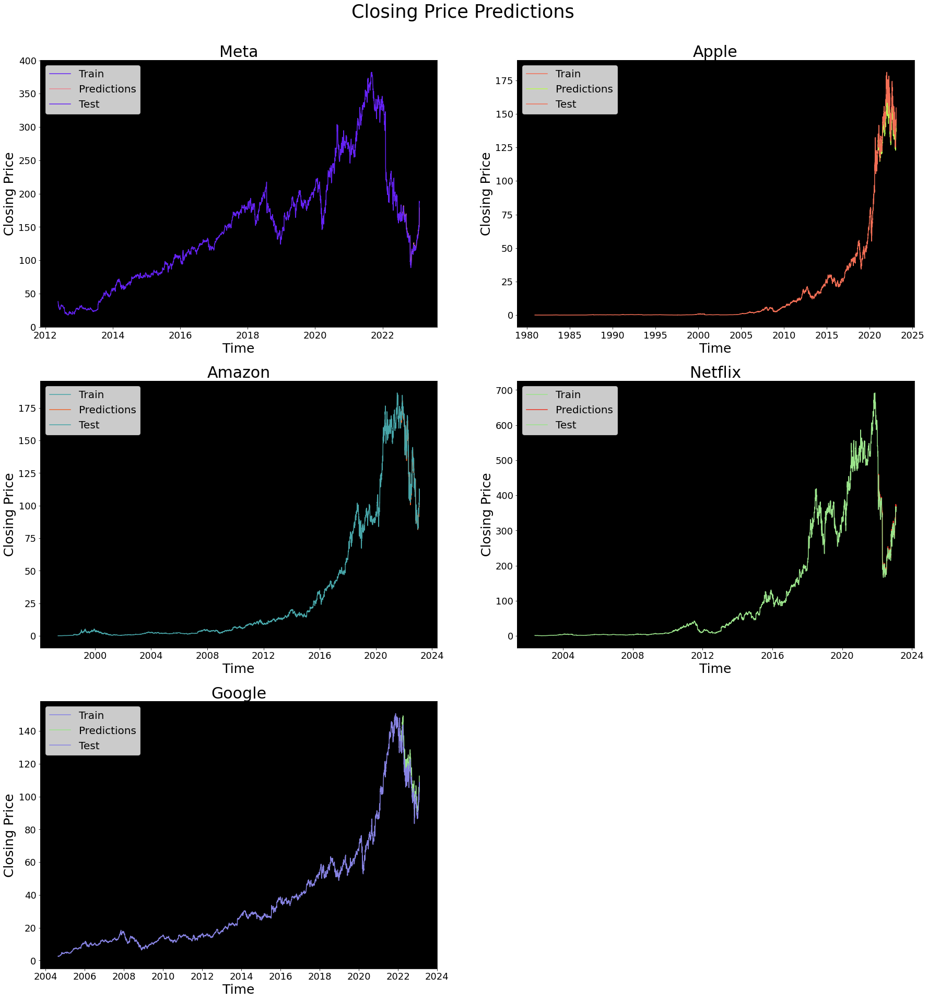

In [ ]:
def plot_model_predictions(plot_train_meta, plot_test_meta, plot_train_aapl, plot_test_aapl, plot_train_amzn, 
                           plot_test_amzn, plot_train_nflx, plot_test_nflx, plot_train_goog, plot_test_goog):
    
    fig, axes = plt.subplots(3, 2, figsize = (30, 30))
    axes[2][1].set_visible(False)
    
    plt.suptitle('Closing Price Predictions', verticalalignment = 'top', horizontalalignment = 'center', fontsize = 35)

    axes[0][0].set_facecolor('black')
    axes[0][0].plot(plot_train_meta['Date'], plot_train_meta['Close'], color = '#6522F5', label = 'Train')
    axes[0][0].plot(plot_test_meta['Date'], plot_test_meta['Predictions'], color = '#EB8791', label = 'Predictions')
    axes[0][0].plot(plot_test_meta['Date'], plot_test_meta['True'], color = '#6522F5', label = 'Test')
    axes[0][0].set_title('Meta', fontsize = 30)
    axes[0][0].set_xlabel('Time', fontsize = 25)
    axes[0][0].set_ylabel('Closing Price', fontsize = 25)
    axes[0][0].xaxis.set_tick_params(labelsize = 18)
    axes[0][0].yaxis.set_tick_params(labelsize = 18)
    axes[0][0].legend(loc = 'upper left', fontsize = 20)
    
    axes[0][1].set_facecolor('black')
    axes[0][1].plot(plot_train_aapl['Date'], plot_train_aapl['Close'], color = '#F26E55', label = 'Train')
    axes[0][1].plot(plot_test_aapl['Date'], plot_test_aapl['Predictions'], color = '#B9FB50', label = 'Predictions')
    axes[0][1].plot(plot_test_aapl['Date'], plot_test_aapl['True'], color = '#F26E55', label = 'Test')
    axes[0][1].set_title('Apple', fontsize = 30)
    axes[0][1].set_xlabel('Time', fontsize = 25)
    axes[0][1].set_ylabel('Closing Price', fontsize = 25)
    axes[0][1].xaxis.set_tick_params(labelsize = 18)
    axes[0][1].yaxis.set_tick_params(labelsize = 18)
    axes[0][1].legend(loc = 'upper left', fontsize = 20)
    
    axes[1][0].set_facecolor('black')
    axes[1][0].plot(plot_train_amzn['Date'], plot_train_amzn['Close'], color = '#47A5A8', label = 'Train')
    axes[1][0].plot(plot_test_amzn['Date'], plot_test_amzn['Predictions'], color = '#ED672C', label = 'Predictions')
    axes[1][0].plot(plot_test_amzn['Date'], plot_test_amzn['True'], color = '#47A5A8', label = 'Test')
    axes[1][0].set_title('Amazon', fontsize = 30)
    axes[1][0].set_xlabel('Time', fontsize = 25)
    axes[1][0].set_ylabel('Closing Price', fontsize = 25)
    axes[1][0].xaxis.set_tick_params(labelsize = 18)
    axes[1][0].yaxis.set_tick_params(labelsize = 18)
    axes[1][0].legend(loc = 'upper left', fontsize = 20)
    
    axes[1][1].set_facecolor('black')
    axes[1][1].plot(plot_train_nflx['Date'], plot_train_nflx['Close'], color = '#9BE48B', label = 'Train')
    axes[1][1].plot(plot_test_nflx['Date'], plot_test_nflx['Predictions'], color = '#EB3323', label = 'Predictions')
    axes[1][1].plot(plot_test_nflx['Date'], plot_test_nflx['True'], color = '#9BE48B', label = 'Test')
    axes[1][1].set_title('Netflix', fontsize = 30)
    axes[1][1].set_xlabel('Time', fontsize = 25)
    axes[1][1].set_ylabel('Closing Price', fontsize = 25)
    axes[1][1].xaxis.set_tick_params(labelsize = 18)
    axes[1][1].yaxis.set_tick_params(labelsize = 18)
    axes[1][1].legend(loc = 'upper left', fontsize = 20)
    
    axes[2][0].set_facecolor('black')
    axes[2][0].plot(plot_train_goog['Date'], plot_train_goog['Close'], color = '#8783E3', label = 'Train')
    axes[2][0].plot(plot_test_goog['Date'], plot_test_goog['Predictions'], color = '#9BE48B', label = 'Predictions')
    axes[2][0].plot(plot_test_goog['Date'], plot_test_goog['True'], color = '#8783E3', label = 'Test')
    axes[2][0].set_title('Google', fontsize = 30)
    axes[2][0].set_xlabel('Time', fontsize = 25)
    axes[2][0].set_ylabel('Closing Price', fontsize = 25)
    axes[2][0].xaxis.set_tick_params(labelsize = 18)
    axes[2][0].yaxis.set_tick_params(labelsize = 18)
    axes[2][0].legend(loc = 'upper left', fontsize = 20)
    
    plt.subplots_adjust(top = 0.93)
    plt.show()
    
plot_model_predictions(plot_train_meta, plot_test_meta, plot_train_aapl, plot_test_aapl, plot_train_amzn, 
                           plot_test_amzn, plot_train_nflx, plot_test_nflx, plot_train_goog, plot_test_goog)

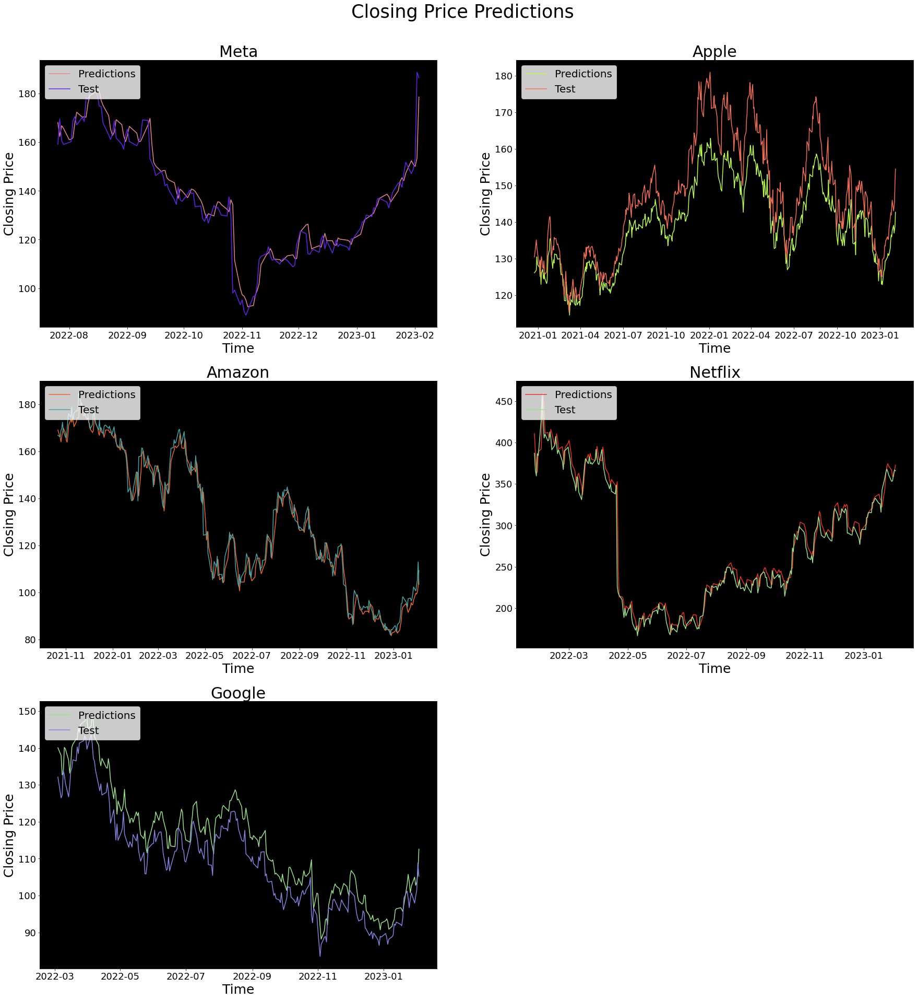

In [ ]:
def plot_model_predictions(plot_train_meta, plot_test_meta, plot_train_aapl, plot_test_aapl, plot_train_amzn, 
                           plot_test_amzn, plot_train_nflx, plot_test_nflx, plot_train_goog, plot_test_goog):
    
    fig, axes = plt.subplots(3, 2, figsize = (30, 30))
    axes[2][1].set_visible(False)
    
    plt.suptitle('Closing Price Predictions', verticalalignment = 'top', horizontalalignment = 'center', fontsize = 35)

    axes[0][0].set_facecolor('black')
    axes[0][0].plot(plot_test_meta['Date'], plot_test_meta['Predictions'], color = '#EB8791', label = 'Predictions')
    axes[0][0].plot(plot_test_meta['Date'], plot_test_meta['True'], color = '#6522F5', label = 'Test')
    axes[0][0].set_title('Meta', fontsize = 30)
    axes[0][0].set_xlabel('Time', fontsize = 25)
    axes[0][0].set_ylabel('Closing Price', fontsize = 25)
    axes[0][0].xaxis.set_tick_params(labelsize = 18)
    axes[0][0].yaxis.set_tick_params(labelsize = 18)
    axes[0][0].legend(loc = 'upper left', fontsize = 20)
    
    axes[0][1].set_facecolor('black')
    axes[0][1].plot(plot_test_aapl['Date'], plot_test_aapl['Predictions'], color = '#B9FB50', label = 'Predictions')
    axes[0][1].plot(plot_test_aapl['Date'], plot_test_aapl['True'], color = '#F26E55', label = 'Test')
    axes[0][1].set_title('Apple', fontsize = 30)
    axes[0][1].set_xlabel('Time', fontsize = 25)
    axes[0][1].set_ylabel('Closing Price', fontsize = 25)
    axes[0][1].xaxis.set_tick_params(labelsize = 18)
    axes[0][1].yaxis.set_tick_params(labelsize = 18)
    axes[0][1].legend(loc = 'upper left', fontsize = 20)
    
    axes[1][0].set_facecolor('black')
    axes[1][0].plot(plot_test_amzn['Date'], plot_test_amzn['Predictions'], color = '#ED672C', label = 'Predictions')
    axes[1][0].plot(plot_test_amzn['Date'], plot_test_amzn['True'], color = '#47A5A8', label = 'Test')
    axes[1][0].set_title('Amazon', fontsize = 30)
    axes[1][0].set_xlabel('Time', fontsize = 25)
    axes[1][0].set_ylabel('Closing Price', fontsize = 25)
    axes[1][0].xaxis.set_tick_params(labelsize = 18)
    axes[1][0].yaxis.set_tick_params(labelsize = 18)
    axes[1][0].legend(loc = 'upper left', fontsize = 20)
    
    axes[1][1].set_facecolor('black')
    axes[1][1].plot(plot_test_nflx['Date'], plot_test_nflx['Predictions'], color = '#EB3323', label = 'Predictions')
    axes[1][1].plot(plot_test_nflx['Date'], plot_test_nflx['True'], color = '#9BE48B', label = 'Test')
    axes[1][1].set_title('Netflix', fontsize = 30)
    axes[1][1].set_xlabel('Time', fontsize = 25)
    axes[1][1].set_ylabel('Closing Price', fontsize = 25)
    axes[1][1].xaxis.set_tick_params(labelsize = 18)
    axes[1][1].yaxis.set_tick_params(labelsize = 18)
    axes[1][1].legend(loc = 'upper left', fontsize = 20)
    
    axes[2][0].set_facecolor('black')
    axes[2][0].plot(plot_test_goog['Date'], plot_test_goog['Predictions'], color = '#9BE48B', label = 'Predictions')
    axes[2][0].plot(plot_test_goog['Date'], plot_test_goog['True'], color = '#8783E3', label = 'Test')
    axes[2][0].set_title('Google', fontsize = 30)
    axes[2][0].set_xlabel('Time', fontsize = 25)
    axes[2][0].set_ylabel('Closing Price', fontsize = 25)
    axes[2][0].xaxis.set_tick_params(labelsize = 18)
    axes[2][0].yaxis.set_tick_params(labelsize = 18)
    axes[2][0].legend(loc = 'upper left', fontsize = 20)
    
    plt.subplots_adjust(top = 0.93)
    plt.show()
    
plot_model_predictions(plot_train_meta, plot_test_meta, plot_train_aapl, plot_test_aapl, plot_train_amzn, 
                           plot_test_amzn, plot_train_nflx, plot_test_nflx, plot_train_goog, plot_test_goog)

# Predictions Using ARIMA
ARIMA stands for ***Auto Regessive Integrated Moving Average***. The model's goal is to predict future securities or financial market moves by examining the differences between values in the series instead of through the actual values. An ARIMA model can be understood by outlining each of its components as follows:
> - **Auto Regression (AR)**: Refers to a model that shows a changing variable that regresses on its own lagged or prior values.
> - **Integrated (I)**: Represents the differencing of raw observations to allow for the time series to become stationary (i.e., data values are replaced by the difference between the data values and the previous values).
> - **Moving Average (MA)**: Incorporates the dependency between an observation and a residual error from a moving average model applied to lagged observations.

<br>

The important parameters of an ARIMA model are as follows:
> - **p**: The number of lag observations in the model also known as the lag order.
> - **d**: The number of times that the raw observations are differenced also known as the degree of differencing.
> - **q**: The size of the moving average window also known as the order of the moving average.

<br>
Block diagram of the ARIMA model:

<img src = "https://www.researchgate.net/profile/Abdellatif-Elmouatamid/publication/336021949/figure/fig3/AS:911704808488962@1594378773709/Different-iterative-steps-of-ARIMA-model.ppm">

### Stationarity
A stationary time series is one whose properties do not depend on the time at which the series is observed. Thus, time series with trends, or with seasonality, are not stationary. The trend and seasonality will affect the value of the time series at different times.


### ADF Test
ADF stands for ***Augmented Dickey Fuller***. It is a common statistical test used to test whether a given time series is stationary or not. The null hypothesis of the ADF test is that the time series is non stationary. If the **p-value** of the test is less than the significance level (**0.05**), then we can reject the null hypothesis and infer that the time series is stationary.

If the **p-value > 0.05** we need to find the order of differencing.

In [ ]:
new_meta_df = df_meta[candlestick_chart_data]
new_aapl_df = df_aapl[candlestick_chart_data]
new_amzn_df = df_amzn[candlestick_chart_data]
new_nflx_df = df_nflx[candlestick_chart_data]
new_goog_df = df_goog[candlestick_chart_data]

def adf_test(dataframe, company):
    result = adfuller(dataframe['Close'])
    print('=========For {}========='.format(company))
    print('ADF Statistic: {}'.format(result[0]))
    print('p-value: {}'.format(result[1]))
    
adf_test(new_meta_df, 'Meta')
adf_test(new_aapl_df, 'Apple')
adf_test(new_amzn_df, 'Amazon')
adf_test(new_nflx_df, 'Netflix')
adf_test(new_goog_df ,'Google')

=========For Meta=========
ADF Statistic: -1.603734966584096
p-value: 0.48171702092712915
=========For Apple=========
ADF Statistic: 2.842291143749398
p-value: 1.0
=========For Amazon=========
ADF Statistic: -0.425811113583558
p-value: 0.9056992306491685
=========For Netflix=========
ADF Statistic: -0.9897189877991461
p-value: 0.7569955702087396
=========For Google=========
ADF Statistic: 0.11120919883738185
p-value: 0.9668181175963508


We need to find the order of differencing for all the companies since their **p-value** is greater than **0.05**.

In [ ]:
def get_degree_of_differencing(dataframe, company):
    company_ndiffs = ndiffs(dataframe['Close'], test = 'adf')
    print(f'The degree of differencing is {company_ndiffs} for {company}')
    return company_ndiffs

meta_dd = get_degree_of_differencing(new_meta_df, 'Meta')
aapl_dd = get_degree_of_differencing(new_aapl_df, 'Apple')
amzn_dd = get_degree_of_differencing(new_amzn_df, 'Amazon')
nflx_dd = get_degree_of_differencing(new_nflx_df, 'Netflix')
goog_dd = get_degree_of_differencing(new_goog_df ,'Google')

The degree of differencing is 1 for Meta
The degree of differencing is 1 for Apple
The degree of differencing is 1 for Amazon
The degree of differencing is 1 for Netflix
The degree of differencing is 1 for Google


We make use of the **`auto_arima`** method in the `pmdarima` package that automatically helps us select the best ARIMA model. In order to find the best model `auto_arima` optimizes for a given `information_criterion` and returns the ARIMA model which minimizes that value. The `information_criterion` selected is **`aic`** which stands for **Akaike Information Criterion**. It is a mathematical method for evaluating how well a model fits the data it was generated from. In statistics, AIC is used to compare different possible models and determine which one is the best fit for the data.

The formula of AIC is as follows:

<img src = "https://miro.medium.com/max/804/1*bgl56Syga-_2SFhQmgShnw.png" width = 250>

where:

**k**: Represents the number of estimated parameters in the model

**$\hat{L}$**: Represents maximum value of the likelihood function for the model

In [ ]:
def arima_split(dataframe, company):
    size = int(len(dataframe) * 0.95)
    train = (dataframe['Close'])[:size]
    test = (dataframe['Close'])[size:]
    
    print('=========For {}========='.format(company))
    print('Train Size: {}, Test Size: {}'.format(len(train), len(test)))
    
    return train, test

meta_train, meta_test = arima_split(new_meta_df, 'Meta')
aapl_train, aapl_test = arima_split(new_aapl_df, 'Apple')
amzn_train, amzn_test = arima_split(new_amzn_df, 'Amazon')
nflx_train, nflx_test = arima_split(new_nflx_df, 'Netflix')
goog_train, goog_test = arima_split(new_goog_df, 'Google')

=========For Meta=========
Train Size: 2561, Test Size: 135
=========For Apple=========
Train Size: 10094, Test Size: 532
=========For Amazon=========
Train Size: 6150, Test Size: 324
=========For Netflix=========
Train Size: 4951, Test Size: 261
=========For Google=========
Train Size: 4415, Test Size: 233


In [ ]:
def find_best_fit_arima(data, company):
    print('=========For {}========='.format(company))

    model = pm.auto_arima(data, test = 'adf', 
                          start_p = 1, start_q = 1,     
                          max_p = 3, max_q = 3,
                          d = None, seasonal = True,   
                          start_P = 0, m = 3,
                          trace = True, error_action = 'ignore',  
                          suppress_warnings = True, stepwise = True,
                          D = 1, information_criterion = 'aic')

    print(model.summary())
    print('\n')
    
    return model
    
meta_arima_model = find_best_fit_arima(meta_train, 'Meta')
aapl_arima_model = find_best_fit_arima(aapl_train, 'Apple')
amzn_arima_model = find_best_fit_arima(amzn_train, 'Amazon')
nflx_arima_model = find_best_fit_arima(nflx_train, 'Netflix')
goog_arima_model = find_best_fit_arima(goog_train, 'Google')

=========For Meta=========
Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,1,1)[3] intercept   : AIC=inf, Time=2.79 sec
 ARIMA(0,0,0)(0,1,0)[3] intercept   : AIC=17149.583, Time=0.10 sec
 ARIMA(1,0,0)(1,1,0)[3] intercept   : AIC=15288.362, Time=0.79 sec
 ARIMA(0,0,1)(0,1,1)[3] intercept   : AIC=16045.023, Time=0.91 sec
 ARIMA(0,0,0)(0,1,0)[3]             : AIC=17149.114, Time=0.07 sec
 ARIMA(1,0,0)(0,1,0)[3] intercept   : AIC=15878.062, Time=0.15 sec
 ARIMA(1,0,0)(2,1,0)[3] intercept   : AIC=14951.530, Time=1.62 sec
 ARIMA(1,0,0)(2,1,1)[3] intercept   : AIC=inf, Time=5.84 sec
 ARIMA(1,0,0)(1,1,1)[3] intercept   : AIC=inf, Time=3.12 sec
 ARIMA(0,0,0)(2,1,0)[3] intercept   : AIC=17114.663, Time=1.06 sec
 ARIMA(2,0,0)(2,1,0)[3] intercept   : AIC=14945.123, Time=2.77 sec
 ARIMA(2,0,0)(1,1,0)[3] intercept   : AIC=15269.429, Time=1.15 sec
 ARIMA(2,0,0)(2,1,1)[3] intercept   : AIC=inf, Time=7.28 sec
 ARIMA(2,0,0)(1,1,1)[3] intercept   : AIC=inf, Time=10.54 sec
 ARIMA(2,0,1)(2,1,0)[

**Note**: To avoid *out of memory errors* the value of **`m`** was set to 3. Changing the parameters of the ARIMA model can alos lead to a lower RMSE score.

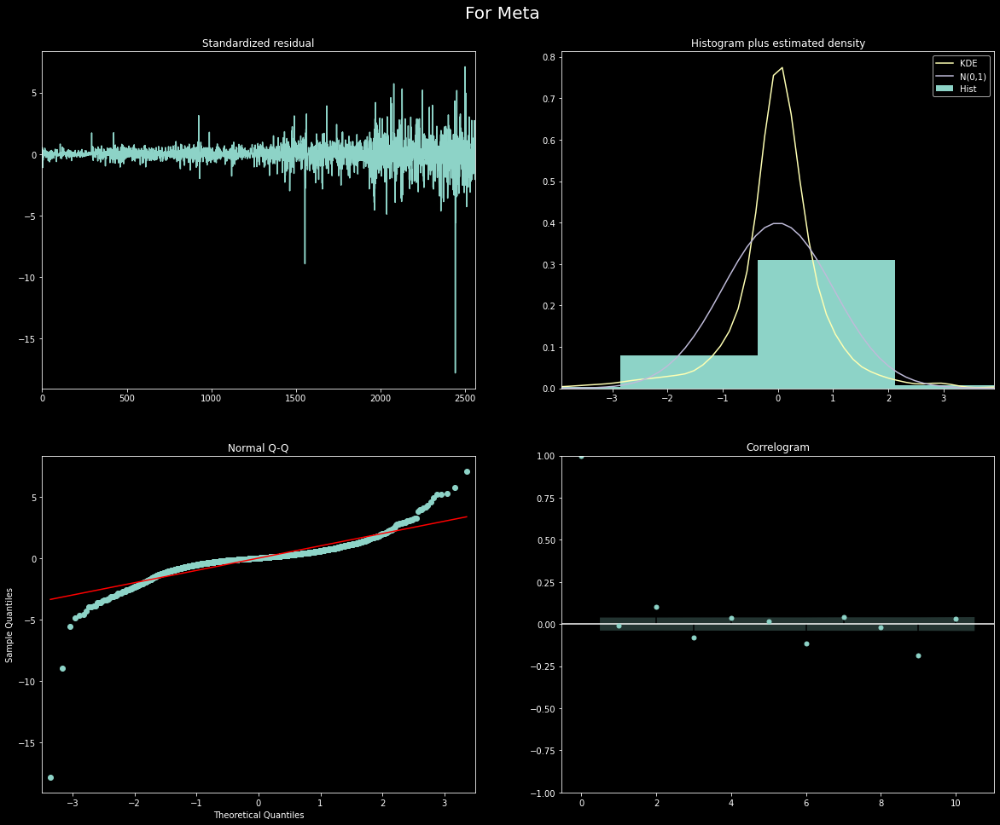

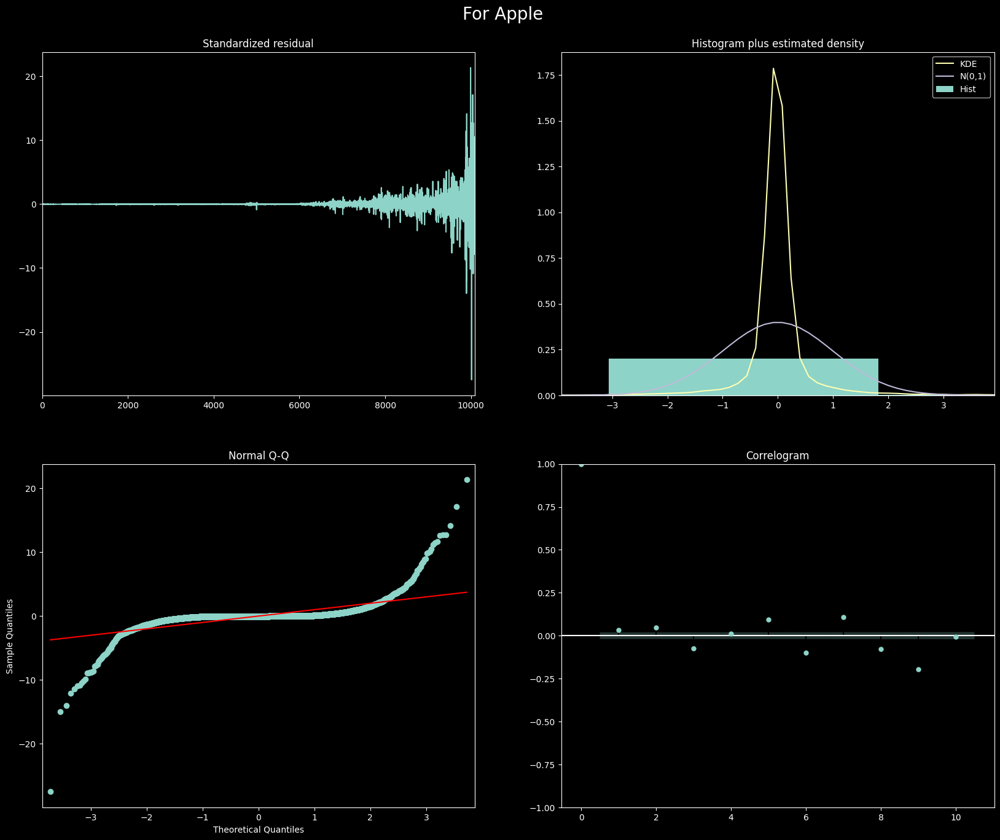

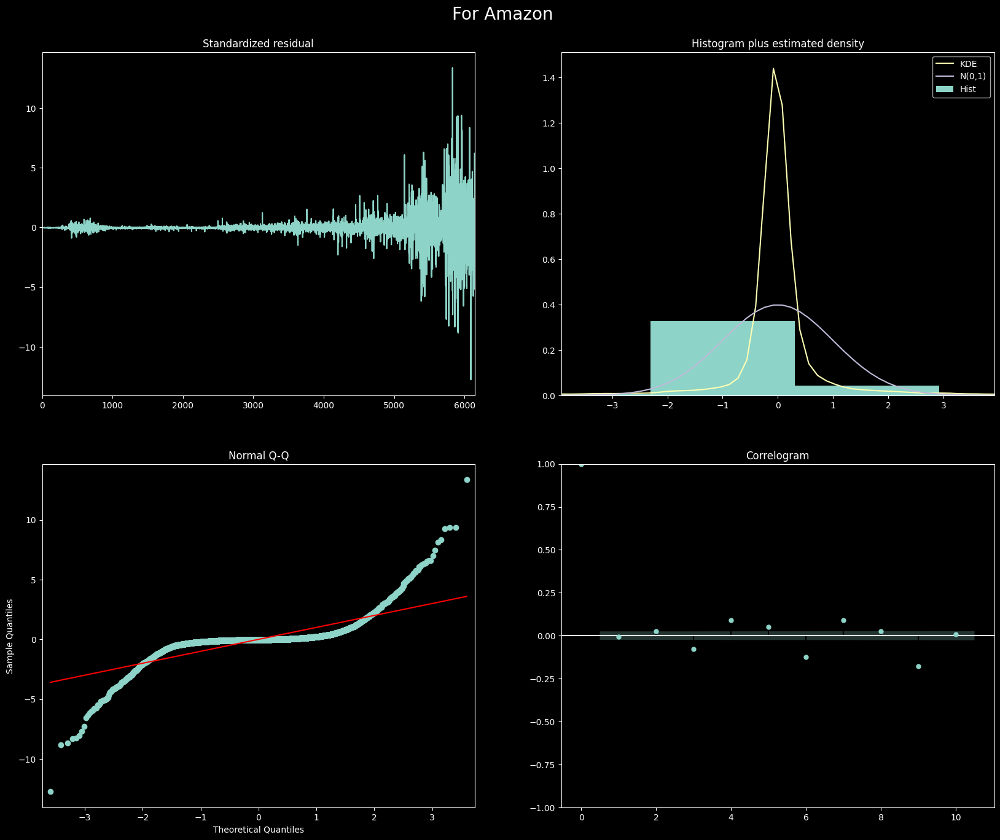

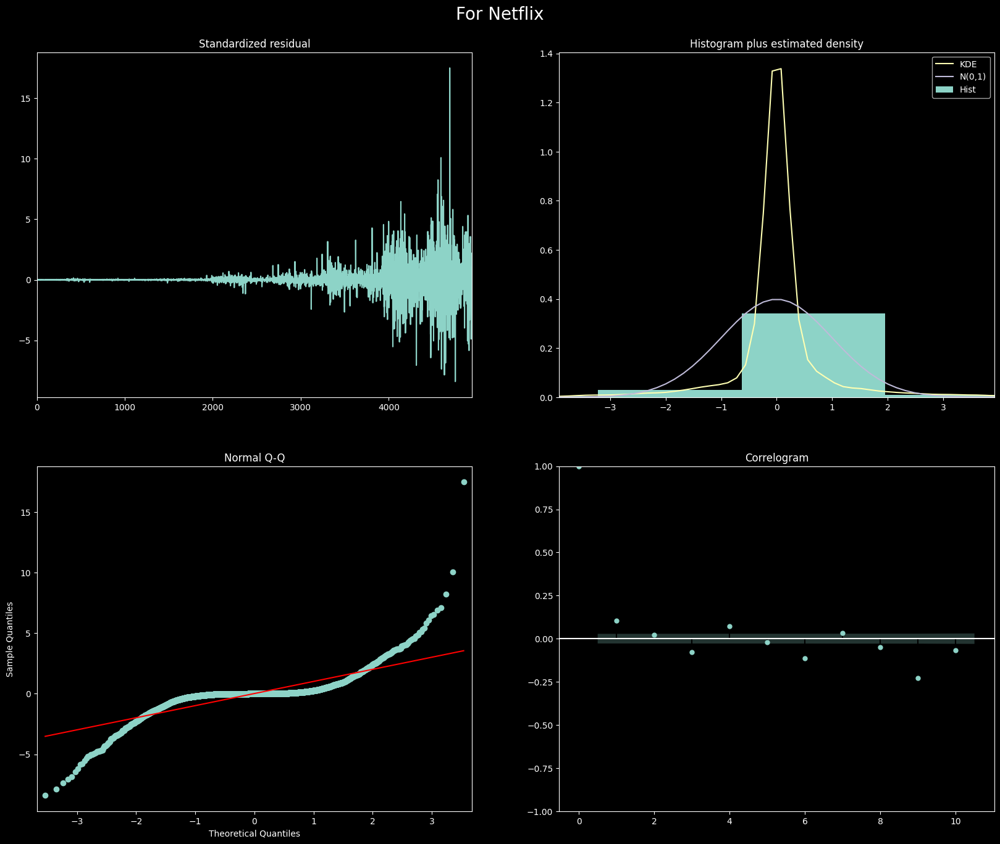

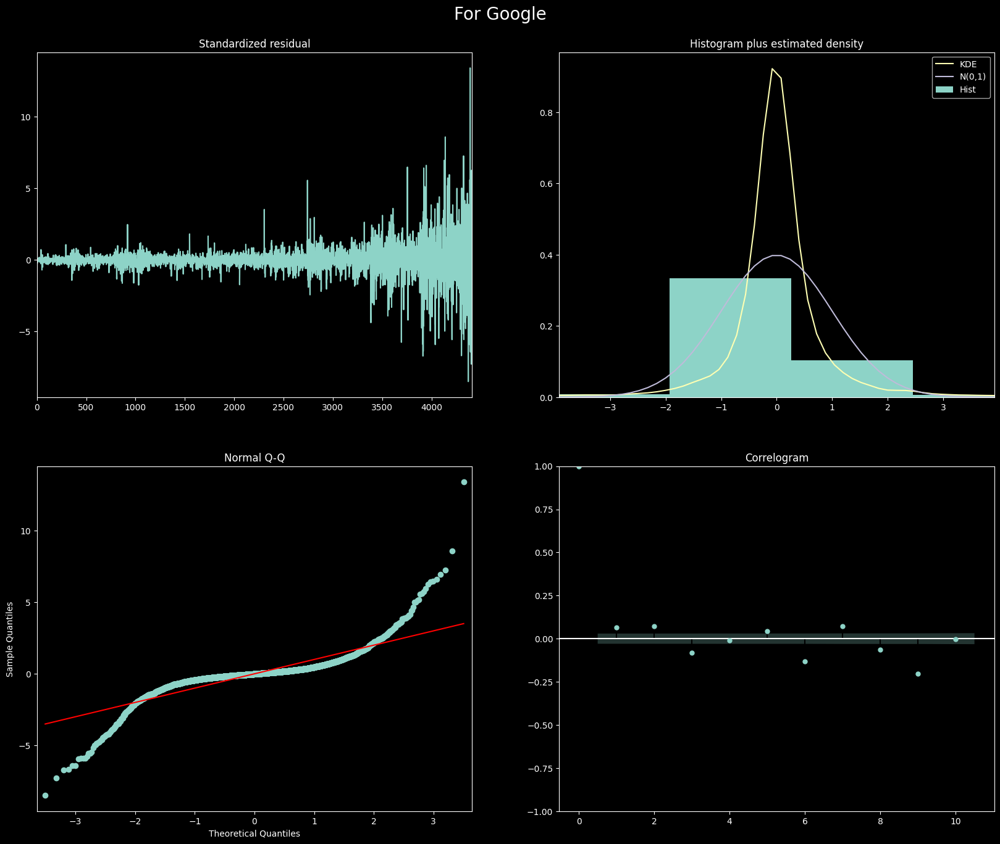

In [ ]:
def display_model_plots(model, company):
    plt.style.use('dark_background')
    model.plot_diagnostics(figsize = (20, 15));
    plt.suptitle('For {}'.format(company), fontsize = 20)
    plt.subplots_adjust(top = 0.93)
    plt.show()
    plt.style.use('default')
    
display_model_plots(meta_arima_model, 'Meta')
display_model_plots(aapl_arima_model, 'Apple')
display_model_plots(amzn_arima_model, 'Amazon')
display_model_plots(nflx_arima_model, 'Netflix')
display_model_plots(goog_arima_model, 'Google')

Lets try and understand what each of the plots mean:
> - **Standard Residual**: The residual errors seem to fluctuate around a mean of zero.
> - **Histograms plus estimated density**: The density plots represent a normal distribution. The **KDE** (Kernel Density Estimator) is also shown. **N(0, 1)** is another way of saying that the graph is a normal distribution with mean of 0 and variance of 1.
> - **Normal Q-Q**: Mostly the dots fall in line with the red line. Any significant deviations would imply the distribution is skewed.
> - **Correlogram**: A correlogram, also called an **ACF (Auto Correlation Function)** plot is a visual way to show serial correlation in data that changes over time. 

In [ ]:
def check_model_params(model, company):
    print('The best parameters for {} are {}'.format(company, model))
    print('==================')
    
check_model_params(meta_arima_model, 'Meta')
check_model_params(aapl_arima_model, 'Apple')
check_model_params(amzn_arima_model, 'Amazon')
check_model_params(nflx_arima_model, 'Netflix')
check_model_params(goog_arima_model, 'Google')

The best parameters for Meta are  ARIMA(2,0,0)(2,1,0)[3]          
The best parameters for Apple are  ARIMA(2,0,1)(2,1,0)[3] intercept
The best parameters for Amazon are  ARIMA(2,0,1)(2,1,0)[3] intercept
The best parameters for Netflix are  ARIMA(2,0,1)(2,1,0)[3]          
The best parameters for Google are  ARIMA(2,0,1)(2,1,0)[3] intercept


In [ ]:
def make_predictions_and_print_rmse(model, test_data, company):
    print('=========For {}========='.format(company))
    
    forecast, confidence_interval = model.predict(X = test_data, n_periods = len(test_data), return_conf_int = True)
    forecast = pd.Series(forecast, index = test_data[:len(test_data)].index)
    lower = pd.Series(confidence_interval[:, 0], index = test_data[:len(test_data)].index)
    upper = pd.Series(confidence_interval[:, 1], index = test_data[:len(test_data)].index)
    
    rmse = np.sqrt(np.mean((forecast - test_data) ** 2))
    
    print('The RMSE is {}'.format(rmse))
    
    return forecast, lower, upper

forecast_meta, lower_meta, upper_meta = make_predictions_and_print_rmse(meta_arima_model, meta_test, 'Meta')
forecast_aapl, lower_aapl, upper_aapl = make_predictions_and_print_rmse(aapl_arima_model, aapl_test, 'Apple')
forecast_amzn, lower_amzn, upper_amzn = make_predictions_and_print_rmse(amzn_arima_model, amzn_test, 'Amazon')
forecast_nflx, lower_nflx, upper_nflx = make_predictions_and_print_rmse(nflx_arima_model, nflx_test, 'Netflix')
forecast_goog, lower_goog, upper_goog = make_predictions_and_print_rmse(goog_arima_model, goog_test, 'Google')

=========For Meta=========
The RMSE is 44.15276303373507
=========For Apple=========
The RMSE is 17.743180370674065
=========For Amazon=========
The RMSE is 52.994149082880384
=========For Netflix=========
The RMSE is 231.8037123883669
=========For Google=========
The RMSE is 31.551285194158304


In [ ]:
def create_df_for_plotting(dataframe, forecast, lower, upper):
    data = {'Date': (dataframe['Date'])[int(len(dataframe) * 0.95):],
            'Predictions': forecast,
            'Lower_conf': lower,
            'Upper_conf': upper}
    
    plot_df = pd.DataFrame(data)
    
    return plot_df

meta_plot_df = create_df_for_plotting(new_meta_df, forecast_meta, lower_meta, upper_meta)
aapl_plot_df = create_df_for_plotting(new_aapl_df, forecast_aapl, lower_aapl, upper_aapl)
amzn_plot_df = create_df_for_plotting(new_amzn_df, forecast_amzn, lower_amzn, upper_amzn)
nflx_plot_df = create_df_for_plotting(new_nflx_df, forecast_nflx, lower_nflx, upper_nflx)
goog_plot_df = create_df_for_plotting(new_goog_df, forecast_goog, lower_goog, upper_goog)

meta_plot_df.head()

,Date,Predictions,Lower_conf,Upper_conf
2561,2022-07-25,172.487607,163.706870,181.268344
2562,2022-07-26,172.881245,161.191449,184.571041
2563,2022-07-27,168.744680,155.475799,182.013562
2564,2022-07-28,174.205111,158.764021,189.646200
2565,2022-07-29,175.042898,158.258297,191.827499


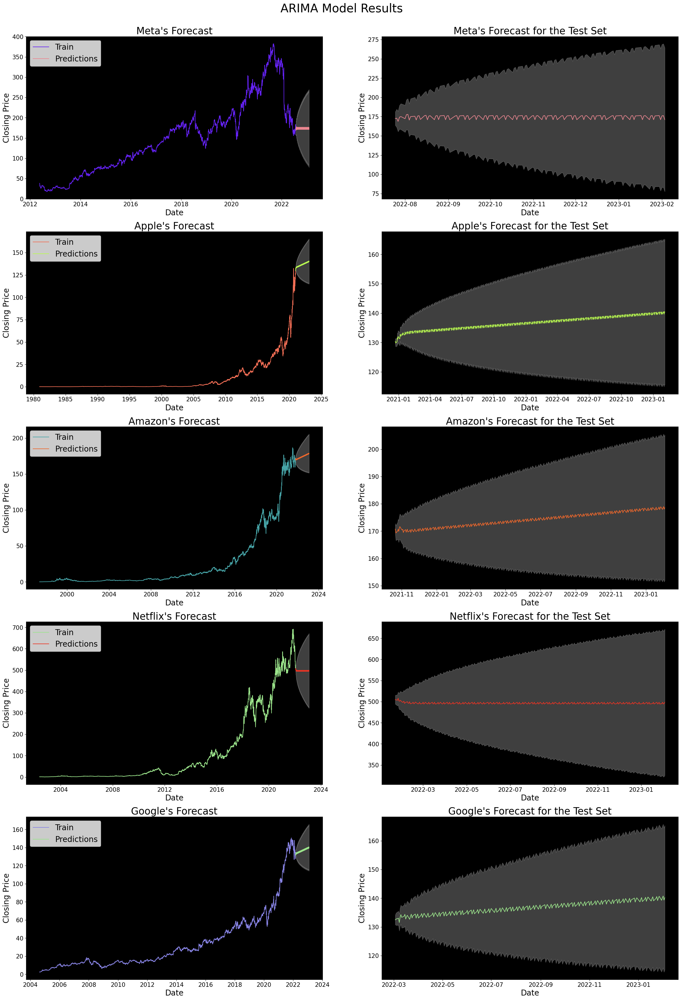

In [ ]:
def show_arima_results(new_meta_df, new_aapl_df, new_amzn_df, new_nflx_df, new_goog_df,
    meta_plot_df, aapl_plot_df, amzn_plot_df, nflx_plot_df, goog_plot_df):
    
    fig, axes = plt.subplots(5, 2, figsize = (30, 40))    
    plt.suptitle('ARIMA Model Results', fontsize = 30)
    
    axes[0][0].set_facecolor('black')
    axes[0][0].set_title("Meta's Forecast", fontsize = 25)
    axes[0][0].plot((new_meta_df['Date'])[:int(len(new_meta_df) * 0.95)], meta_train, color = '#6522F5', label = 'Train')
    axes[0][0].plot((new_meta_df['Date'])[int(len(new_meta_df) * 0.95):], meta_plot_df['Predictions'], color = '#EB8791', label = 'Predictions')
    axes[0][0].fill_between(meta_plot_df['Date'].values, 
                     meta_plot_df['Lower_conf'], 
                     meta_plot_df['Upper_conf'], 
                     color = 'w', alpha = 0.25)
    axes[0][0].set_xlabel('Date', fontsize = 20)
    axes[0][0].set_ylabel('Closing Price', fontsize = 20)
    axes[0][0].xaxis.set_tick_params(labelsize = 15)
    axes[0][0].yaxis.set_tick_params(labelsize = 15)
    axes[0][0].legend(loc = 'upper left', fontsize = 20)
    
    axes[0][1].set_title("Meta's Forecast for the Test Set", fontsize = 25)
    axes[0][1].set_facecolor('black')
    axes[0][1].plot((new_meta_df['Date'])[int(len(new_meta_df) * 0.95):], forecast_meta, color = '#EB8791')
    axes[0][1].fill_between(meta_plot_df['Date'].values, 
                     meta_plot_df['Lower_conf'], 
                     meta_plot_df['Upper_conf'], 
                     color = 'w', alpha = 0.25)
    axes[0][1].set_xlabel('Date', fontsize = 20)
    axes[0][1].set_ylabel('Closing Price', fontsize = 20)
    axes[0][1].xaxis.set_tick_params(labelsize = 15)
    axes[0][1].yaxis.set_tick_params(labelsize = 15)
    
    axes[1][0].set_facecolor('black')
    axes[1][0].set_title("Apple's Forecast", fontsize = 25)
    axes[1][0].plot((new_aapl_df['Date'])[:int(len(new_aapl_df) * 0.95)], aapl_train, color = '#F26E55', label = 'Train')
    axes[1][0].plot((new_aapl_df['Date'])[int(len(new_aapl_df) * 0.95):], aapl_plot_df['Predictions'], color = '#B9FB50', label = 'Predictions')
    axes[1][0].fill_between(aapl_plot_df['Date'].values, 
                     aapl_plot_df['Lower_conf'], 
                     aapl_plot_df['Upper_conf'], 
                     color = 'w', alpha = 0.25)
    axes[1][0].set_xlabel('Date', fontsize = 20)
    axes[1][0].set_ylabel('Closing Price', fontsize = 20)
    axes[1][0].xaxis.set_tick_params(labelsize = 15)
    axes[1][0].yaxis.set_tick_params(labelsize = 15)
    axes[1][0].legend(loc = 'upper left', fontsize = 20)
    
    axes[1][1].set_title("Apple's Forecast for the Test Set", fontsize = 25)
    axes[1][1].set_facecolor('black')
    axes[1][1].plot((new_aapl_df['Date'])[int(len(new_aapl_df) * 0.95):], forecast_aapl, color = '#B9FB50')
    axes[1][1].fill_between(aapl_plot_df['Date'].values, 
                     aapl_plot_df['Lower_conf'], 
                     aapl_plot_df['Upper_conf'], 
                     color = 'w', alpha = 0.25)
    axes[1][1].set_xlabel('Date', fontsize = 20)
    axes[1][1].set_ylabel('Closing Price', fontsize = 20)
    axes[1][1].xaxis.set_tick_params(labelsize = 15)
    axes[1][1].yaxis.set_tick_params(labelsize = 15)
    
    axes[2][0].set_facecolor('black')
    axes[2][0].set_title("Amazon's Forecast", fontsize = 25)
    axes[2][0].plot((new_amzn_df['Date'])[:int(len(new_amzn_df) * 0.95)], amzn_train, color = '#47A5A8', label = 'Train')
    axes[2][0].plot((new_amzn_df['Date'])[int(len(new_amzn_df) * 0.95):], amzn_plot_df['Predictions'], color = '#ED672C', label = 'Predictions')
    axes[2][0].fill_between(amzn_plot_df['Date'].values, 
                     amzn_plot_df['Lower_conf'], 
                     amzn_plot_df['Upper_conf'], 
                     color = 'w', alpha = 0.25)
    axes[2][0].set_xlabel('Date', fontsize = 20)
    axes[2][0].set_ylabel('Closing Price', fontsize = 20)
    axes[2][0].xaxis.set_tick_params(labelsize = 15)
    axes[2][0].yaxis.set_tick_params(labelsize = 15)
    axes[2][0].legend(loc = 'upper left', fontsize = 20)
    
    axes[2][1].set_title("Amazon's Forecast for the Test Set", fontsize = 25)
    axes[2][1].set_facecolor('black')
    axes[2][1].plot((new_amzn_df['Date'])[int(len(new_amzn_df) * 0.95):], forecast_amzn, color = '#ED672C')
    axes[2][1].fill_between(amzn_plot_df['Date'].values, 
                     amzn_plot_df['Lower_conf'], 
                     amzn_plot_df['Upper_conf'], 
                     color = 'w', alpha = 0.25)
    axes[2][1].set_xlabel('Date', fontsize = 20)
    axes[2][1].set_ylabel('Closing Price', fontsize = 20)
    axes[2][1].xaxis.set_tick_params(labelsize = 15)
    axes[2][1].yaxis.set_tick_params(labelsize = 15)
    
    axes[3][0].set_facecolor('black')
    axes[3][0].set_title("Netflix's Forecast", fontsize = 25)
    axes[3][0].plot((new_nflx_df['Date'])[:int(len(new_nflx_df) * 0.95)], nflx_train, color = '#9BE48B', label = 'Train')
    axes[3][0].plot((new_nflx_df['Date'])[int(len(new_nflx_df) * 0.95):], nflx_plot_df['Predictions'], color = '#EB3323', label = 'Predictions')
    axes[3][0].fill_between(nflx_plot_df['Date'].values, 
                     nflx_plot_df['Lower_conf'], 
                     nflx_plot_df['Upper_conf'], 
                     color = 'w', alpha = 0.25)
    axes[3][0].set_xlabel('Date', fontsize = 20)
    axes[3][0].set_ylabel('Closing Price', fontsize = 20)
    axes[3][0].xaxis.set_tick_params(labelsize = 15)
    axes[3][0].yaxis.set_tick_params(labelsize = 15)
    axes[3][0].legend(loc = 'upper left', fontsize = 20)
    
    axes[3][1].set_title("Netflix's Forecast for the Test Set", fontsize = 25)
    axes[3][1].set_facecolor('black')
    axes[3][1].plot((new_nflx_df['Date'])[int(len(new_nflx_df) * 0.95):], forecast_nflx, color = '#EB3323')
    axes[3][1].fill_between(nflx_plot_df['Date'].values, 
                     nflx_plot_df['Lower_conf'], 
                     nflx_plot_df['Upper_conf'], 
                     color = 'w', alpha = 0.25)
    axes[3][1].set_xlabel('Date', fontsize = 20)
    axes[3][1].set_ylabel('Closing Price', fontsize = 20)
    axes[3][1].xaxis.set_tick_params(labelsize = 15)
    axes[3][1].yaxis.set_tick_params(labelsize = 15)
    
    axes[4][0].set_facecolor('black')
    axes[4][0].set_title("Google's Forecast", fontsize = 25)
    axes[4][0].plot((new_goog_df['Date'])[:int(len(new_goog_df) * 0.95)], goog_train, color = '#8783E3', label = 'Train')
    axes[4][0].plot((new_goog_df['Date'])[int(len(new_goog_df) * 0.95):], goog_plot_df['Predictions'], color = '#9BE48B', label = 'Predictions')
    axes[4][0].fill_between(goog_plot_df['Date'].values, 
                     goog_plot_df['Lower_conf'], 
                     goog_plot_df['Upper_conf'], 
                     color = 'w', alpha = 0.25)
    axes[4][0].set_xlabel('Date', fontsize = 20)
    axes[4][0].set_ylabel('Closing Price', fontsize = 20)
    axes[4][0].xaxis.set_tick_params(labelsize = 15)
    axes[4][0].yaxis.set_tick_params(labelsize = 15)
    axes[4][0].legend(loc = 'upper left', fontsize = 20)
    
    axes[4][1].set_title("Google's Forecast for the Test Set", fontsize = 25)
    axes[4][1].set_facecolor('black')
    axes[4][1].plot((new_goog_df['Date'])[int(len(new_goog_df) * 0.95):], forecast_goog, color = '#9BE48B')
    axes[4][1].fill_between(goog_plot_df['Date'].values, 
                     goog_plot_df['Lower_conf'], 
                     goog_plot_df['Upper_conf'], 
                     color = 'w', alpha = 0.25)
    axes[4][1].set_xlabel('Date', fontsize = 20)
    axes[4][1].set_ylabel('Closing Price', fontsize = 20)
    axes[4][1].xaxis.set_tick_params(labelsize = 15)
    axes[4][1].yaxis.set_tick_params(labelsize = 15)
        
    plt.subplots_adjust(top = 0.95)
    plt.show()
    
show_arima_results(new_meta_df, new_aapl_df, new_amzn_df, new_nflx_df, new_goog_df,
                   meta_plot_df, aapl_plot_df, amzn_plot_df, nflx_plot_df, goog_plot_df)

**Observations**: The LSTM models have a much better performance as compared to the ARIMA models. The LSTMs have a much lower ***RMSE*** score and produce better forecasts. The predictions made by the ARIMA models can be improved by experimenting with different parameters of the `auto_arima` function.

# Predictions Using Prophet
Facebook's (now Meta's) Prophet helps forecasting time series data based on an **additive model** where non-linear trends are fit with yearly, weekly, and daily seasonality, plus holiday effects. It works best with time series that have strong seasonal effects and several seasons of historical data. **Prophet** is *robust* to missing data and shifts in the trend, and typically handles outliers well.

The mathematical equation behind the Prophet model is defined as:

<img src = "https://miro.medium.com/max/800/1*ghTHwruT5QxQ_g_2rvu-3w.png" width = 350>

> - **g(t)**: Represents the trend. Prophet uses a piecewise linear model for trend forecasting.
> - **s(t)**: Represents periodic changes (weekly, monthly, yearly).
> - **h(t)**: Represents the effects of holidays (Holidays can impact businesses).
> - **ε(t)**: Represents the error term

The Prophet model fitting procedure is usually very fast (even for thousands of observations) and it does not require any data preprocessing. It deals also with **missing data and outliers**.

The input to Prophet is ***always*** a dataframe with two columns: `ds` and `y`. The `ds` column represents the date and the `y` column must be numeric and should be the measurement we wish to forecast. 

In [ ]:
def prophet_formatting(dataframe):
    dataframe = dataframe[['Date', 'Close']]
    dataframe = dataframe.rename(columns = {'Date': 'ds', 'Close': 'y'})
    return dataframe

meta_prophet_df = prophet_formatting(new_meta_df)
aapl_prophet_df = prophet_formatting(new_aapl_df)
amzn_prophet_df = prophet_formatting(new_amzn_df)
nflx_prophet_df = prophet_formatting(new_nflx_df)
goog_prophet_df = prophet_formatting(new_goog_df)

meta_prophet_df.head()

,ds,y
0,2012-05-18,38.230000
1,2012-05-21,34.029999
2,2012-05-22,31.000000
3,2012-05-23,32.000000
4,2012-05-24,33.029999


In [ ]:
def make_predictions_with_prophet(data, company):
    print('=========For {}========='.format(company))
        
    size = int(len(data) * 0.95)
    train = data[:size]
    test = data[size:]
    
    t1 = datetime.strptime(str(test['ds'].iloc[0]), '%Y-%m-%d %H:%M:%S')
    t2 = datetime.strptime(str(test['ds'].iloc[-1]), '%Y-%m-%d %H:%M:%S')
    time = t2 - t1
    period = int(time.total_seconds() / 86400) + 1
    
    fbp = Prophet(yearly_seasonality = 'auto') 
    fbp.fit(train)
    future = fbp.make_future_dataframe(periods = period)
    pred = fbp.predict(future)
    
    return fbp, train, test, pred

meta_fbp, meta_train, meta_test, meta_pred = make_predictions_with_prophet(meta_prophet_df, 'Meta')
aapl_fbp, aapl_train, aapl_test, aapl_pred = make_predictions_with_prophet(aapl_prophet_df, 'Apple')
amzn_fbp, amzn_train, amzn_test, amzn_pred = make_predictions_with_prophet(amzn_prophet_df, 'Amazon')
nflx_fbp, nflx_train, nflx_test, nflx_pred = make_predictions_with_prophet(nflx_prophet_df, 'Netflix')
goog_fbp, goog_train, goog_test, goog_pred = make_predictions_with_prophet(goog_prophet_df, 'Google')

INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp30zdaj7u/3tm4niw8.json


=========For Meta=========


DEBUG:cmdstanpy:input tempfile: /tmp/tmp30zdaj7u/l7pdlh3f.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.8/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=72165', 'data', 'file=/tmp/tmp30zdaj7u/3tm4niw8.json', 'init=/tmp/tmp30zdaj7u/l7pdlh3f.json', 'output', 'file=/tmp/tmp30zdaj7u/prophet_model33xhbipc/prophet_model-20230204135429.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
13:54:29 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
13:54:31 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp30zdaj7u/12oif0ya.json


=========For Apple=========


DEBUG:cmdstanpy:input tempfile: /tmp/tmp30zdaj7u/665b7h07.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.8/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=2290', 'data', 'file=/tmp/tmp30zdaj7u/12oif0ya.json', 'init=/tmp/tmp30zdaj7u/665b7h07.json', 'output', 'file=/tmp/tmp30zdaj7u/prophet_model23cibdga/prophet_model-20230204135432.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
13:54:32 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
13:54:35 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp30zdaj7u/mwdwr2ev.json


=========For Amazon=========


DEBUG:cmdstanpy:input tempfile: /tmp/tmp30zdaj7u/bgzvwsyy.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.8/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=45221', 'data', 'file=/tmp/tmp30zdaj7u/mwdwr2ev.json', 'init=/tmp/tmp30zdaj7u/bgzvwsyy.json', 'output', 'file=/tmp/tmp30zdaj7u/prophet_model7pnp_mey/prophet_model-20230204135438.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
13:54:38 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
13:54:41 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp30zdaj7u/xzv3v45z.json


=========For Netflix=========


DEBUG:cmdstanpy:input tempfile: /tmp/tmp30zdaj7u/ls_ts30a.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.8/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=92682', 'data', 'file=/tmp/tmp30zdaj7u/xzv3v45z.json', 'init=/tmp/tmp30zdaj7u/ls_ts30a.json', 'output', 'file=/tmp/tmp30zdaj7u/prophet_modelvvpocw74/prophet_model-20230204135442.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
13:54:42 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
13:54:44 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp30zdaj7u/xv5u36hb.json


=========For Google=========


DEBUG:cmdstanpy:input tempfile: /tmp/tmp30zdaj7u/smyu_rv9.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.8/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=25258', 'data', 'file=/tmp/tmp30zdaj7u/xv5u36hb.json', 'init=/tmp/tmp30zdaj7u/smyu_rv9.json', 'output', 'file=/tmp/tmp30zdaj7u/prophet_model8p6zqewu/prophet_model-20230204135445.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
13:54:45 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
13:54:47 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


In [ ]:
def calculate_prophet_rmse(pred, test, company):    
    print('=========For {}========='.format(company))
    
    rmse = np.sqrt(np.mean((np.array(pred.tail(len(test))[['trend']]) - np.array(test['y'])) ** 2))
    
    print('The RMSE is {}'.format(rmse))
    
calculate_prophet_rmse(meta_pred, meta_test, 'Meta')
calculate_prophet_rmse(aapl_pred, aapl_test, 'Apple')
calculate_prophet_rmse(amzn_pred, amzn_test, 'Amazon')
calculate_prophet_rmse(nflx_pred, nflx_test, 'Netflix')
calculate_prophet_rmse(goog_pred, goog_test, 'Google')

=========For Meta=========
The RMSE is 144.74106820013083
=========For Apple=========
The RMSE is 64.00258223263667
=========For Amazon=========
The RMSE is 68.24016181347476
=========For Netflix=========
The RMSE is 376.4970194005673
=========For Google=========
The RMSE is 42.084000195851466


In [ ]:
def display_prophet_predictions(model, predictions, company):

    fig = plot_plotly(model, predictions, 
                      xlabel = 'Date', ylabel = 'Closing Price',
                      figsize = (900, 600))
    fig.update_layout(title = dict(
                         text = '<b>Predictions for ' + company + '</b>',
                         x = 0.5,
                         y = 0.95,
                         font = dict(
                             size = 20
                         )
                      ),
                      template = 'plotly_dark')
    fig.show()
    
display_prophet_predictions(meta_fbp, meta_pred, 'Meta')
display_prophet_predictions(aapl_fbp, aapl_pred, 'Apple')
display_prophet_predictions(amzn_fbp, amzn_pred, 'Amazon')
display_prophet_predictions(nflx_fbp, nflx_pred, 'Netflix')
display_prophet_predictions(goog_fbp, goog_pred, 'Google')